## 本文档 准备重新区分一下训练集、验证集，并且实验 userid 作为 emb 


模型1：
---
输入：
1. 展示给用户的9个商品（商品的emb、离散属性、连续属性变成离散）
2. 用户的点击历史记录（商品的emb、离散属性、连续属性变成离散）
3. 用户的属性（离散属性）
4. 用户id（emb）
5. 用户购买时间（月、日、星期几、小时）

输出：
1. 用户购买到了第几个 session（购买了0-3，4-6，7-9，三类session）
2. 用户是否购买这9个商品（可以用gaochen提的4类商品reweighting loss）


模型2：
---
输入：
1. 用户 __之前的__ 点击历史记录（商品的emb、离散属性、连续属性变成离散）
2. 用户 __当前点击__ 的商品（商品的emb、离散属性、连续属性变成离散）
3. 用户的属性（离散属性）
4. 用户id（emb）

输出：
1. 用户是否点击这个商品


以上两个模型公用所有的 emb 


In [ ]:
%cd /content/drive/MyDrive/202108-bigdatacup2021

/content/drive/MyDrive/202108-bigdatacup2021


In [ ]:
# %load_ext tensorboard
%reload_ext tensorboard
%tensorboard --logdir=./

Reusing TensorBoard on port 6006 (pid 268), started 0:26:48 ago. (Use '!kill 268' to kill it.)

<IPython.core.display.Javascript object>

## pre

In [ ]:
!pip install einops

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.tensorboard import SummaryWriter

import datetime as dt
from datetime import datetime, timezone
tz_bj = dt.timezone(dt.timedelta(hours=8))

import pandas as pd
from tqdm import tqdm
import numpy as np
from sklearn.utils import shuffle

import matplotlib.pyplot as plt

import einops

## aggregate samples to user_id_real (已处理，重复不用跑)

决定试一下，如果所有的 user_protrait 都相同，就认为是同一个 user，这样来  aggregate user

#### 输入：trainset.csv, track1_testset.csv, track2_testset.csv

#### 输出：data/processed/

* 点击：
    * click_all.csv 包含了三个所有的 click 数据
* 购买：
    * trainset_user_id_real.csv (相较于原来的多了一个 user_id_real 字段)
    * track1_testset_user_id_real.csv (相较于原来的多了一个 user_id_real 字段)
    * track2_testset_user_id_real.csv (相较于原来的多了一个 user_id_real 字段)

In [ ]:
data_path='/content/drive/MyDrive/202108-bigdatacup2021/data/'
df_train = pd.read_csv(f'{data_path}/trainset.csv', sep=' ')
df_test1 = pd.read_csv(f'{data_path}/track1_testset.csv', sep=' ')
df_test2 = pd.read_csv(f'{data_path}/track2_testset.csv', sep=' ')

In [ ]:
df_train.head()

,user_id,user_click_history,user_protrait,exposed_items,labels,time
0,1,"30:1580603130,34:1581178937,15:1581178939,28:1...","64054,21804,80911,36504,8867,7615,54240,37294,...","1,20,28,99,86,119,213,237,164","1,1,1,1,1,1,1,1,1",1582992009
1,2,"20:1580644762,13:1580644765,1:1580644770,127:1...","64054,26565,93755,88510,6344,7615,54240,21927,...","1,4,26,112,86,117,191,234,172","1,1,1,1,1,1,1,1,0",1582992010
2,3,"39:1580772975,6:1580772981,1:1581178309,2:1581...","64054,64086,63021,88510,93500,7615,54240,21927...","22,4,28,48,105,42,193,236,159","1,1,1,0,1,0,0,0,0",1582992014
3,4,"6:1580657608,9:1580657612,15:1580657615,127:15...","64054,21531,6599,16721,37078,7615,54240,65505,...","5,16,1,74,133,122,235,218,172","1,1,1,1,1,1,1,1,0",1582992014
4,5,"37:1580743545,36:1580743554,25:1580743556,37:1...","64054,66036,6599,88510,76066,20543,83978,37294...","6,1,16,85,73,112,239,172,205","1,1,1,1,1,1,1,1,1",1582992017


In [ ]:
## 先得到一个 user_protrait:user_id_real 的对应关系
a = set(list(df_train['user_protrait']))
b = set(list(df_test1['user_protrait']))
c = set(list(df_test2['user_protrait']))
print(len(a), len(b), len(c))
print(len(a.union(b)), len(a.union(c)), len(b.union(c)))
print(len(a.union(b).union(c)))

all_user_portrait = a.union(b).union(c)
dict_user_protrait_to_user_id_real = {}
for idx, u in enumerate(all_user_portrait):
    dict_user_protrait_to_user_id_real[u] = idx

164925 113058 113167
277362 277474 225725
389616


In [ ]:
print(min(dict_user_protrait_to_user_id_real.values()))
print(max(dict_user_protrait_to_user_id_real.values()))

0
389615


In [ ]:
# !mkdir data/processed

In [ ]:
for i in tqdm(range(df_train.shape[0])):
    up = df_train.at[i, 'user_protrait'] 
    user_id_real = dict_user_protrait_to_user_id_real[up]
    df_train.at[i, 'user_id_real'] = user_id_real
df_train = df_train.astype({"user_id_real": int})
df_train.head()
df_train.to_csv('data/processed/trainset_user_id_real.csv', index=False)

100%|██████████| 260087/260087 [00:03<00:00, 73030.23it/s]


In [ ]:
for i in tqdm(range(df_test1.shape[0])):
    up = df_test1.at[i, 'user_protrait'] 
    user_id_real = dict_user_protrait_to_user_id_real[up]
    df_test1.at[i, 'user_id_real'] = user_id_real
df_test1 = df_test1.astype({"user_id_real": int})
df_test1.head()
df_test1.to_csv('data/processed/track1_testset_user_id_real.csv', index=False)

100%|██████████| 206254/206254 [00:02<00:00, 70785.95it/s]


In [ ]:
for i in tqdm(range(df_test2.shape[0])):
    up = df_test2.at[i, 'user_protrait'] 
    user_id_real = dict_user_protrait_to_user_id_real[up]
    df_test2.at[i, 'user_id_real'] = user_id_real
df_test2 = df_test2.astype({"user_id_real": int})
df_test2.head()
df_test2.to_csv('data/processed/track2_testset_user_id_real.csv', index=False)

100%|██████████| 206096/206096 [00:02<00:00, 70909.12it/s]


In [ ]:
df_train = pd.read_csv('data/processed/trainset_user_id_real.csv')
df_test1 = pd.read_csv('data/processed/track1_testset_user_id_real.csv')
df_test2 = pd.read_csv('data/processed/track2_testset_user_id_real.csv')

In [ ]:
df_test1.head()

,user_id,user_click_history,user_protrait,exposed_items,labels,time,user_id_real
0,1,"24:1580573710,7:1580573724,1:1580573730,127:15...","64054,50887,66367,44932,59460,20543,83978,5013...","3,5,29,72,53,52,164,211,172","0,0,0,0,0,0,0,0,0",1582992008,107860
1,2,"35:1580629376,9:1580629379,2:1580629381,73:158...","64054,35323,6599,36504,24180,37350,83978,21927...","22,29,25,132,73,108,188,213,164","0,0,0,0,0,0,0,0,0",1582992009,15492
2,3,"35:1580804903,32:1580804915,39:1581268224,33:1...","64054,67884,6599,16721,17121,38762,83978,37294...","29,35,14,61,51,106,150,148,234","0,0,0,0,0,0,0,0,0",1582992019,85780
3,4,"15:1580688381,5:1580688385,39:1580688388,39:15...","64054,23083,93755,36504,35011,37350,83978,3729...","29,27,35,99,79,107,213,200,152","0,0,0,0,0,0,0,0,0",1582992024,354003
4,5,"29:1580906648,18:1580906650,10:1580906652,139:...","64054,32125,93755,36504,37741,7615,54240,21927...","4,8,28,102,61,86,151,235,199","0,0,0,0,0,0,0,0,0",1582992027,63512


In [ ]:
all_click = \
pd.concat([df_train[['user_id_real', 'user_click_history', 'user_protrait']],
           df_test1[['user_id_real', 'user_click_history', 'user_protrait']],
           df_test2[['user_id_real', 'user_click_history', 'user_protrait']]
])

In [ ]:
all_click.reset_index(drop=True).to_csv('data/processed/click_all.csv', index=False)

In [ ]:
pd.read_csv('data/processed/click_all.csv')

,user_id_real,user_click_history,user_protrait
0,383280,"30:1580603130,34:1581178937,15:1581178939,28:1...","64054,21804,80911,36504,8867,7615,54240,37294,..."
1,276091,"20:1580644762,13:1580644765,1:1580644770,127:1...","64054,26565,93755,88510,6344,7615,54240,21927,..."
2,149385,"39:1580772975,6:1580772981,1:1581178309,2:1581...","64054,64086,63021,88510,93500,7615,54240,21927..."
3,114792,"6:1580657608,9:1580657612,15:1580657615,127:15...","64054,21531,6599,16721,37078,7615,54240,65505,..."
4,353129,"37:1580743545,36:1580743554,25:1580743556,37:1...","64054,66036,6599,88510,76066,20543,83978,37294..."
...,...,...,...
672432,188437,0:0,"64054,69325,6599,36504,83167,7615,54240,37294,..."
672433,102255,"1:1590855013,30:1590901062,39:1590901065,130:1...","64054,41498,6599,88510,75610,7615,54240,37294,..."
672434,116299,"20:1590506219,14:1590506221,29:1590506223,74:1...","64054,65488,6599,36504,56754,7615,54240,21927,..."
672435,30912,"18:1590479772,33:1590479774,18:1590479820,25:1...","64054,31038,6599,36504,6344,7615,54240,21927,7..."


## time EDA

In [ ]:
data_path='/content/drive/MyDrive/202108-bigdatacup2021/data/'
df_train = pd.read_csv(f'{data_path}/trainset.csv', sep=' ')
df_test1 = pd.read_csv(f'{data_path}/track1_testset.csv', sep=' ')

In [ ]:
df_train['time']

0         1582992009
1         1582992010
2         1582992014
3         1582992014
4         1582992017
             ...    
260082    1593014108
260083    1593014287
260084    1593014307
260085    1593014325
260086    1593014357
Name: time, Length: 260087, dtype: int64

In [ ]:
df_test1['time']

0         1582992008
1         1582992009
2         1582992019
3         1582992024
4         1582992027
             ...    
206249    1593014193
206250    1593014200
206251    1593014247
206252    1593014372
206253    1593014375
Name: time, Length: 206254, dtype: int64

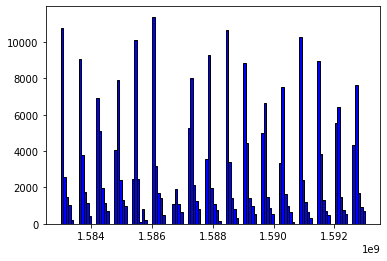

In [ ]:
plt.hist(df_train['time'], color='blue', edgecolor='black', bins=120)
plt.show()

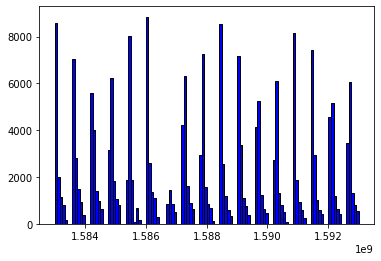

In [ ]:
plt.hist(df_test1['time'], color='blue', edgecolor='black', bins=120)
plt.show()

In [ ]:
import datetime as dt
from datetime import datetime, timezone
tz_bj = dt.timezone(dt.timedelta(hours=8))

print(datetime.utcfromtimestamp(1582992009).strftime('%Y-%m-%d %H:%M:%S'))
print(datetime.utcfromtimestamp(1593014357).strftime('%Y-%m-%d %H:%M:%S'))

print(datetime.fromtimestamp(1582992009, tz_bj).strftime('%Y-%m-%d %H:%M:%S'))
print(datetime.fromtimestamp(1593014357, tz_bj).strftime('%Y-%m-%d %H:%M:%S'))

a = datetime.fromtimestamp(1593014357, tz_bj)
month   = int(a.strftime('%m')) - 1 # 几月 01, 02, …, 12 (-1)
date    = int(a.strftime('%d')) - 1 # 几号 01, 02, …, 31 (-1)
weekday = int(a.strftime('%w')) # 星期几 0, 1, …, 6. 0:sunday, 6:saturday
hour    = int(a.strftime('%H')) # 小时 00, 01, …, 23

print(month, date, weekday, hour)

2020-02-29 16:00:09
2020-06-24 15:59:17
2020-03-01 00:00:09
2020-06-24 23:59:17
5 23 3 23


## 把所有的 feature 改成 离散的分桶

In [ ]:
def load_item_info(data_path='/content/drive/MyDrive/202108-bigdatacup2021/data/'):
    # item info
    df_item_info = pd.read_csv(f'{data_path}/item_info.csv', sep=' ')
    item_info_dict = {}
    for i in tqdm(range(df_item_info.shape[0])):
        item_id = df_item_info.at[i, 'item_id'] 

        item_discrete = df_item_info.at[i, 'item_vec'].split(',')[:3]
        item_cont = df_item_info.at[i, 'item_vec'].split(',')[-2:]
        price = df_item_info.at[i, 'price'] # / 3000
        loc = df_item_info.at[i, 'location'] - 1 # 0~2

        item_cont.append(price) # 2 + 1
        item_discrete.append(loc) # 3 + 1

        item_cont = [float(it) for it in item_cont]
        item_discrete = [int(it) for it in item_discrete]
        item_discrete[0] = item_discrete[0] - 1 # 1~4 -> 0~3
        item_discrete[2] = item_discrete[2] - 1 # 1~2 -> 0~1

        item_info_dict[int(item_id)] = {
            'cont': np.array(item_cont, dtype=np.float64),
            'discrete': np.array(item_discrete, dtype=np.int64),
        }
    return item_info_dict

In [ ]:
item_info_dict = load_item_info(data_path='/content/drive/MyDrive/202108-bigdatacup2021/data/')

100%|██████████| 381/381 [00:00<00:00, 25559.07it/s]


In [ ]:
item_info_dict[1]

{'cont': array([1.5764e-02, 8.3300e-01, 2.9540e+03]),
 'discrete': array([1, 2, 0, 0])}

In [ ]:
cont1, cont2, cont3 = [], [], []
for k, v in item_info_dict.items():
    c = v['cont']
    cont1.append(c[0])
    cont2.append(c[1])
    cont3.append(c[2])
cont1, cont2, cont3 = np.array(cont1), np.array(cont2), np.array(cont3)

### item cont1

In [ ]:
cont1_nonzero = cont1[cont1 != 0]
cont1_nonzero_log = np.log(cont1_nonzero)

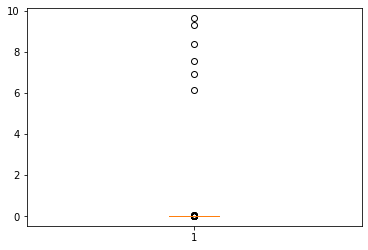

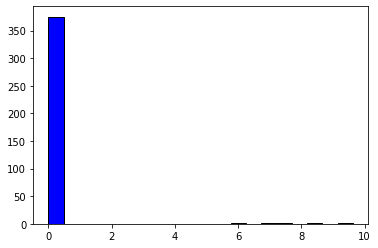

In [ ]:
fig1, ax1 = plt.subplots()
# ax1.set_title('Basic Plot')
ax1.boxplot(cont1)
plt.show()

plt.hist(cont1, color='blue', edgecolor='black', bins=20)
plt.show()

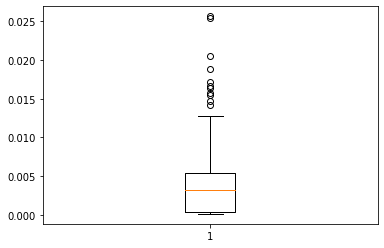

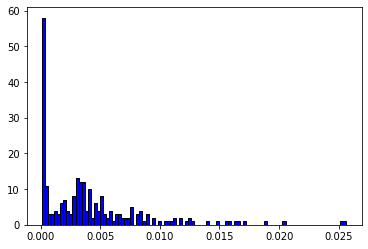

In [ ]:
fig1, ax1 = plt.subplots()
# ax1.set_title('Basic Plot')
ax1.boxplot(cont1_nonzero[cont1_nonzero < 5])
plt.show()

plt.hist(cont1_nonzero[cont1_nonzero < 5], color='blue', edgecolor='black', bins=100)
plt.show()

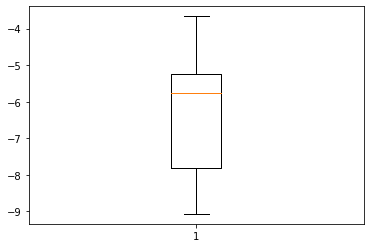

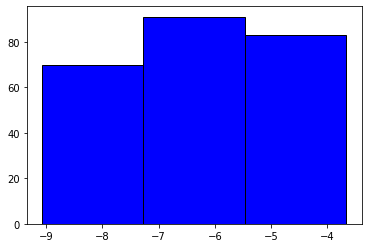

In [ ]:
fig1, ax1 = plt.subplots()
# ax1.set_title('Basic Plot')
ax1.boxplot(cont1_nonzero_log[cont1_nonzero_log < 0])
plt.show()

plt.hist(cont1_nonzero_log[cont1_nonzero_log < 0], color='blue', edgecolor='black', bins=3)
plt.show()

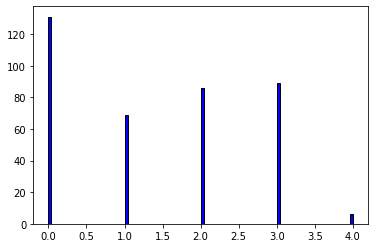

In [ ]:
def cont1_to_discrete(cont_val):
    if cont_val == 0:
        return 0
    cont_val_log = np.log(cont_val)
    if cont_val_log > 0:
        return 4
    if cont_val_log < -7.5:
        return 1
    if cont_val_log < -5.5:
        return 2
    if cont_val_log < 0:
        return 3

cont1_discrete = []
for c in cont1:
    tmp = cont1_to_discrete(c)
    cont1_discrete.append(tmp)

plt.hist(cont1_discrete, color='blue', edgecolor='black', bins=100)
plt.show()

### item cont2

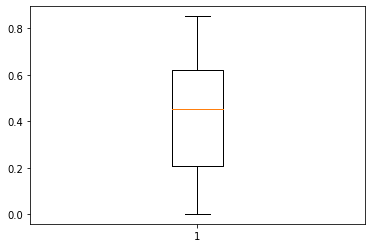

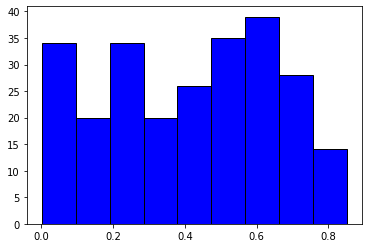

In [ ]:
fig1, ax1 = plt.subplots()
# ax1.set_title('Basic Plot')
ax1.boxplot(cont2[cont2 != 0])
plt.show()

plt.hist(cont2[cont2 != 0], color='blue', edgecolor='black', bins=9)
plt.show()

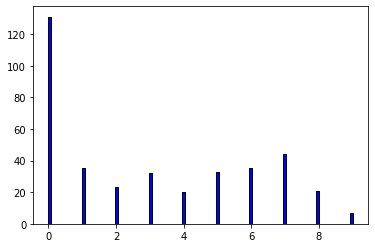

In [ ]:
def cont2_to_discrete(cont_val):
    if cont_val == 0:
        return 0
    if cont_val < 0.1:
        return 1
    if cont_val < 0.2:
        return 2
    if cont_val < 0.3:
        return 3
    if cont_val < 0.4:
        return 4
    if cont_val < 0.5:
        return 5
    if cont_val < 0.6:
        return 6
    if cont_val < 0.7:
        return 7
    if cont_val < 0.8:
        return 8
    if cont_val < 0.9:
        return 9

cont2_discrete = []
for c in cont2:
    tmp = cont2_to_discrete(c)
    cont2_discrete.append(tmp)

plt.hist(cont2_discrete, color='blue', edgecolor='black', bins=100)
plt.show()

### item cont3

In [ ]:
cont3_log = np.log(cont3)

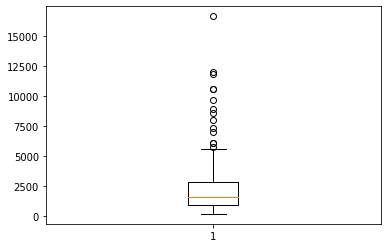

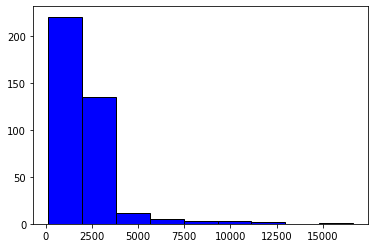

In [ ]:
fig1, ax1 = plt.subplots()
# ax1.set_title('Basic Plot')
ax1.boxplot(cont3)
plt.show()

plt.hist(cont3, color='blue', edgecolor='black', bins=9)
plt.show()

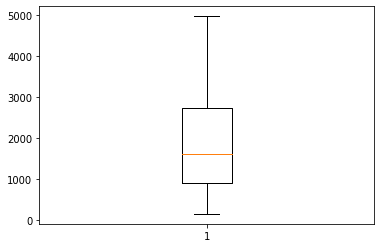

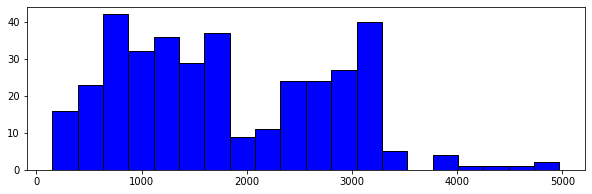

In [ ]:
fig1, ax1 = plt.subplots()
# ax1.set_title('Basic Plot')
ax1.boxplot(cont3[cont3 < 5000])
plt.show()

plt.figure(figsize=(10, 3))
plt.hist(cont3[cont3 < 5000], color='blue', edgecolor='black', bins=20)
plt.show()

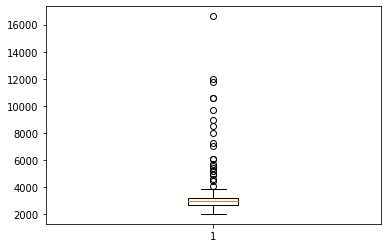

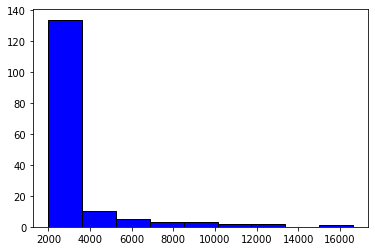

In [ ]:
fig1, ax1 = plt.subplots()
# ax1.set_title('Basic Plot')
ax1.boxplot(cont3[cont3 >= 2000])
plt.show()

plt.hist(cont3[cont3 >= 2000], color='blue', edgecolor='black', bins=9)
plt.show()

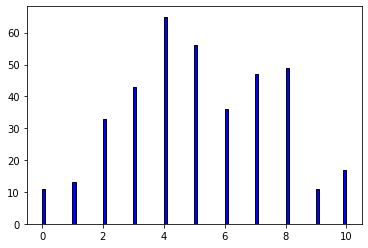

In [ ]:
## price
def cont3_to_discrete(cont_val):
    if cont_val < 300:
        return 0
    if cont_val < 500:
        return 1
    if cont_val < 750:
        return 2
    if cont_val < 1000:
        return 3
    if cont_val < 1500:
        return 4
    if cont_val < 2000:
        return 5
    if cont_val < 2500:
        return 6
    if cont_val < 3000:
        return 7
    if cont_val < 3500:
        return 8
    if cont_val <= 5000:
        return 9
    if cont_val > 5000:
        return 10

cont3_discrete = []
for c in cont3:
    tmp = cont3_to_discrete(c)
    cont3_discrete.append(tmp)

plt.hist(cont3_discrete, color='blue', edgecolor='black', bins=100)
plt.show()

## overall data cont to discrete

cont1,2,3 -> discrete 

len = [5, 10, 11]

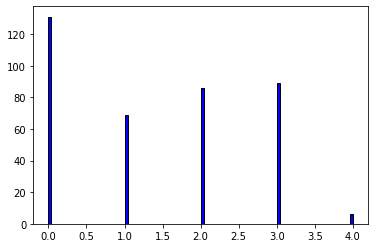

In [ ]:
def cont1_to_discrete(cont_val):
    if cont_val == 0:
        return 0
    cont_val_log = np.log(cont_val)
    if cont_val_log < -7.5:
        return 1
    if cont_val_log < -5.5:
        return 2
    if cont_val_log <= 0:
        return 3
    if cont_val_log > 0:
        return 4

cont1_discrete = []
for c in cont1:
    tmp = cont1_to_discrete(c)
    cont1_discrete.append(tmp)
assert len(cont1_discrete) == len(cont1)

plt.hist(cont1_discrete, color='blue', edgecolor='black', bins=100)
plt.show()

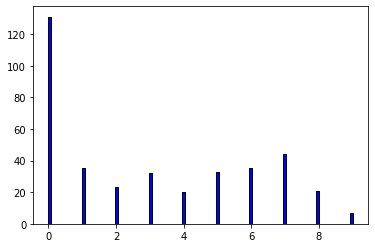

In [ ]:
def cont2_to_discrete(cont_val):
    if cont_val == 0:
        return 0
    if cont_val < 0.1:
        return 1
    if cont_val < 0.2:
        return 2
    if cont_val < 0.3:
        return 3
    if cont_val < 0.4:
        return 4
    if cont_val < 0.5:
        return 5
    if cont_val < 0.6:
        return 6
    if cont_val < 0.7:
        return 7
    if cont_val < 0.8:
        return 8
    if cont_val < 0.9:
        return 9

cont2_discrete = []
for c in cont2:
    tmp = cont2_to_discrete(c)
    cont2_discrete.append(tmp)
assert len(cont2_discrete) == len(cont2)

plt.hist(cont2_discrete, color='blue', edgecolor='black', bins=100)
plt.show()

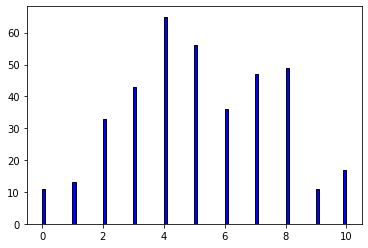

In [ ]:
## price
def cont3_to_discrete(cont_val):
    if cont_val < 300:
        return 0
    if cont_val < 500:
        return 1
    if cont_val < 750:
        return 2
    if cont_val < 1000:
        return 3
    if cont_val < 1500:
        return 4
    if cont_val < 2000:
        return 5
    if cont_val < 2500:
        return 6
    if cont_val < 3000:
        return 7
    if cont_val < 3500:
        return 8
    if cont_val <= 5000:
        return 9
    if cont_val > 5000:
        return 10

cont3_discrete = []
for c in cont3:
    tmp = cont3_to_discrete(c)
    cont3_discrete.append(tmp)
assert len(cont3_discrete) == len(cont3)

plt.hist(cont3_discrete, color='blue', edgecolor='black', bins=100)
plt.show()

In [ ]:
def load_item_info_turn_cont_to_discrete(
    data_path='/content/drive/MyDrive/202108-bigdatacup2021/data/'
):

    # item info
    df_item_info = pd.read_csv(f'{data_path}/item_info.csv', sep=' ')

    num_items = 381+1 # 0 means no item; normal items start from 1
    num_features = (3+1) + (2+1)
    item_features = np.zeros((num_items, num_features)).astype(np.int64)

    for i in tqdm(range(num_items - 1)):
        item_id = df_item_info.at[i, 'item_id']
        # discrete
        item_discrete = df_item_info.at[i, 'item_vec'].split(',')[:3]
        loc = df_item_info.at[i, 'location'] - 1 # 0~2
        item_discrete.append(loc)
        item_discrete = [int(it) for it in item_discrete]
        item_discrete[0] = item_discrete[0] - 1 # 1~4 -> 0~3
        item_discrete[2] = item_discrete[2] - 1 # 1~2 -> 0~1

        # cont
        item_cont = df_item_info.at[i, 'item_vec'].split(',')[-2:]
        price = df_item_info.at[i, 'price']
        item_cont.append(price)
        item_cont = [float(it) for it in item_cont]

        item_cont1 = cont1_to_discrete(item_cont[0])
        item_cont2 = cont2_to_discrete(item_cont[1])
        item_cont3 = cont3_to_discrete(item_cont[2])

        # agg
        item_discrete.append(item_cont1)
        item_discrete.append(item_cont2)
        item_discrete.append(item_cont3)

        item_total_feat = np.array(item_discrete, dtype=np.int64)
        item_features[item_id] = item_total_feat
    
    # change 0 item to no-feature (last idx of each feature + 1)
    last_idx = np.max(item_features, axis=0)
    item_features[0] = last_idx + 1

    return item_features

In [ ]:
item_features = load_item_info_turn_cont_to_discrete(
    data_path='/content/drive/MyDrive/202108-bigdatacup2021/data/'
)

100%|██████████| 381/381 [00:00<00:00, 23752.99it/s]


In [ ]:
print(item_features[:10])

[[ 4 10  2  3  5 10 11]
 [ 1  2  0  0  3  9  7]
 [ 1  0  0  0  3  8  0]
 [ 1  8  0  0  3  8  3]
 [ 1  0  0  0  3  9  4]
 [ 1  0  0  0  3  8  2]
 [ 1  7  0  0  3  8  4]
 [ 1  7  0  0  3  7  7]
 [ 1  0  0  0  3  7  0]
 [ 1  0  0  0  3  7  0]]


## data

In [ ]:
def get_portraitidx_to_idx_dict_list():
    ## 获取 user portrait 的映射，因为
    data_path='/content/drive/MyDrive/202108-bigdatacup2021/data/'
    # portraitidx_to_idx_dict_list: list of 10 dict, int:int

    portraitidx_to_idx_dict_list = []
    for i in range(10):
        portraitidx_to_idx_dict_list.append(dict())
    acculumated_idx = [0] * 10


    df_train = pd.read_csv(f'{data_path}/trainset.csv', sep=' ')
    for i in tqdm(range(df_train.shape[0])):
        user_portrait = [int(s) for s in df_train.at[i, 'user_protrait'].split(',')]
        for idx, u in enumerate(user_portrait):
            if portraitidx_to_idx_dict_list[idx].get(u, -1) == -1:
                portraitidx_to_idx_dict_list[idx][u] = acculumated_idx[idx]
                acculumated_idx[idx] += 1
    print(acculumated_idx)


    # 测试集中如果出现训练集里没出现的， 就统一置为最后一个
    df_test1 = pd.read_csv(f'{data_path}/track1_testset.csv', sep=' ')
    for i in tqdm(range(df_test1.shape[0])):
        user_portrait = [int(s) for s in df_test1.at[i, 'user_protrait'].split(',')]
        for idx, u in enumerate(user_portrait):
            if portraitidx_to_idx_dict_list[idx].get(u, -1) == -1:
                portraitidx_to_idx_dict_list[idx][u] = acculumated_idx[idx]
    df_test2 = pd.read_csv(f'{data_path}/track2_testset.csv', sep=' ')
    for i in tqdm(range(df_test2.shape[0])):
        user_portrait = [int(s) for s in df_test2.at[i, 'user_protrait'].split(',')]
        for idx, u in enumerate(user_portrait):
            if portraitidx_to_idx_dict_list[idx].get(u, -1) == -1:
                portraitidx_to_idx_dict_list[idx][u] = acculumated_idx[idx]

    for i in range(10):
        acculumated_idx[i] += 1

    # 所以最后也统一加上一个， 即使有些维度其实没有 测试集出现但训练集没出现的东西
    print(acculumated_idx)
    return portraitidx_to_idx_dict_list

portraitidx_to_idx_dict_list = get_portraitidx_to_idx_dict_list()

100%|██████████| 260087/260087 [00:02<00:00, 88809.25it/s]


[3, 1363, 20, 10, 195, 49, 3, 11, 2, 2164]


100%|██████████| 206096/206096 [00:02<00:00, 88558.17it/s]

[4, 1364, 21, 11, 196, 50, 4, 12, 3, 2165]


In [ ]:
def load_buy_train_data():

    df_train = pd.read_csv('data/processed/trainset_user_id_real.csv')
    df_train = shuffle(df_train, random_state=2333).reset_index(drop=True)

    total_num = int(df_train.shape[0])
    num_train = int(total_num * 0.85) # 这样大约有 6.27% 的数据会划分到 validation set
    # train, val: (243775, 16312)

    # 需要把同样userid的也放到train里
    train_user_id_real_set = set(list(df_train['user_id_real'][:num_train]))

    buy_train_samples = []
    buy_val_samples = []

    for i in tqdm(range(total_num)):
        if df_train.at[i, 'user_click_history'] == '0:0':
            user_click_list = [0]
        else:
            user_click_list = df_train.at[i, 'user_click_history'].split(',')
            user_click_list = [int(sample.split(':')[0]) for sample in user_click_list]
        num_user_click_history = len(user_click_list)
        tmp = np.zeros(400, dtype=np.int64)
        tmp[:len(user_click_list)] = user_click_list
        user_click_list = tmp
        
        user_id_real = df_train.at[i, 'user_id_real']
        exposed_items = [int(s) for s in df_train.at[i, 'exposed_items'].split(',')]
        labels = [int(s) for s in df_train.at[i, 'labels'].split(',')]

        user_portrait = [int(s) for s in df_train.at[i, 'user_protrait'].split(',')]
        # portraitidx_to_idx_dict_list: list of 10 dict, int:int
        for j in range(10):
            user_portrait[j] = portraitidx_to_idx_dict_list[j][user_portrait[j]]
        one_sample = {
            'user_click_list': user_click_list,
            'num_user_click_history': num_user_click_history,
            'user_portrait': np.array(user_portrait, dtype=np.int64),
            'item_id': np.array(exposed_items, dtype=np.int64),
            'user_id_real': user_id_real,
            'label': np.array(labels, dtype=np.int64),
            't': df_train.at[i, 'time'] # int
        }
        if i < num_train or user_id_real in train_user_id_real_set:
            buy_train_samples.append(one_sample)
        else:
            buy_val_samples.append(one_sample)
    
    return buy_train_samples, buy_val_samples

buy_train_samples, buy_val_samples = load_buy_train_data()

100%|██████████| 260087/260087 [00:23<00:00, 11306.20it/s]


In [ ]:
len(buy_train_samples), len(buy_val_samples)

(243775, 16312)

In [ ]:
def load_click_train_data():
    click_train_samples = []
    click_val_samples = []

    df_click = pd.read_csv('data/processed/click_all.csv')
    df_click = shuffle(df_click, random_state=2333).reset_index(drop=True)

    total_num = int(df_click.shape[0])
    num_train = int(total_num * 0.85) # 这样大约有 5.157% 的数据会划分到 validation set
    # train, val: (637762, 34675)

    # 需要把同样userid的也放到train里
    train_user_id_real_set = set(list(df_click['user_id_real'][:num_train]))

    click_train_samples = []
    click_val_samples = []

    for i in tqdm(range(total_num)):
        if df_click.at[i, 'user_click_history'] == '0:0':
            user_click_list = [0]
        else:
            user_click_list = df_click.at[i, 'user_click_history'].split(',')
            user_click_list = [int(sample.split(':')[0]) for sample in user_click_list]
        num_user_click_history = len(user_click_list)
        tmp = np.zeros(400, dtype=np.int64)
        tmp[:len(user_click_list)] = user_click_list
        user_click_list = tmp
        
        user_id_real = df_click.at[i, 'user_id_real']

        user_portrait = [int(s) for s in df_click.at[i, 'user_protrait'].split(',')]
        # portraitidx_to_idx_dict_list: list of 10 dict, int:int
        for j in range(10):
            user_portrait[j] = portraitidx_to_idx_dict_list[j][user_portrait[j]]
        one_sample = {
            'user_click_list': user_click_list,
            'num_user_click_history': num_user_click_history,
            'user_portrait': np.array(user_portrait, dtype=np.int64),
            'user_id_real': user_id_real,
        }
        if i < num_train or user_id_real in train_user_id_real_set:
            click_train_samples.append(one_sample)
        else:
            click_val_samples.append(one_sample)    

    return click_train_samples, click_val_samples

click_train_samples, click_val_samples = load_click_train_data()

100%|██████████| 672437/672437 [00:39<00:00, 17083.07it/s]


In [ ]:
len(click_train_samples), len(click_val_samples)

(637762, 34675)

In [ ]:
# aug items within sess
from itertools import permutations
from functools import reduce
import operator
import random

perm1 = list(permutations([0, 1, 2]))
perm2 = list(permutations([3, 4, 5]))
perm3 = list(permutations([6, 7, 8]))

aug_order = []
for p1 in perm1:
    # print(p1)
    for p2 in perm2:
        # print(p1, p2)
        for p3 in perm3:
            # print(p1, p2, p3)
            tmp = reduce(operator.concat, [p1, p2, p3])
            aug_order.append(tmp)
len_aug_order = len(aug_order)

In [ ]:
class BuyDataset(torch.utils.data.Dataset):
    def __init__(self, 
                 item_features,
                 buy_database,
                 train_val='train' # if train, use augorder
                ):
        super().__init__()
        self.item_features = item_features
        self.buy_database = buy_database
        self.train_val = train_val

    def __len__(self, ):
        return len(self.buy_database)

    def __getitem__(self, idx):
        one_sample = self.buy_database[idx]
        user_click_history = one_sample['user_click_list'] # [400]
        num_user_click_history = one_sample['num_user_click_history'] # int
        user_discrete_feature = one_sample['user_portrait'] # [10]
        nine_item_id = one_sample['item_id'] # [9]
        user_id_real = one_sample['user_id_real'] # int
        label = one_sample['label'] # [9]
        t = one_sample['t'] # int

        a = datetime.fromtimestamp(t, tz_bj)
        month   = int(a.strftime('%m')) - 1 # 几月 01, 02, …, 12 (-1)
        date    = int(a.strftime('%d')) - 1 # 几号 01, 02, …, 31 (-1)
        weekday = int(a.strftime('%w')) # 星期几 0, 1, …, 6. 0:sunday, 6:saturday
        hour    = int(a.strftime('%H')) # 小时 00, 01, …, 23

        if self.train_val == 'train':
            ao = list(aug_order[random.randint(0, len_aug_order - 1)])
            nine_item_id = nine_item_id[ao]
            label = label[ao]

        user_click_history_discrete_feature = np.zeros((400, (3+1) + (2+1))).astype(np.int64)
        for i in range(num_user_click_history):
            if user_click_history[i] == 0:
                user_click_history_discrete_feature[i] = self.item_features[user_click_history[i]]
                # 这里 0表示没有任何点击
            else:
                user_click_history_discrete_feature[i] = self.item_features[user_click_history[i]]

        nine_item_discrete_feature = np.zeros((9, (3+1) + (2+1))).astype(np.int64)
        for i in range(9):
            nine_item_discrete_feature[i] = self.item_features[nine_item_id[i]]

        session_label = 0 # 0,1,2,3
        # 0: 什么都不买
        for i in range(9):
            if label[i]: # 买1~3个
                session_label = 1
            if i >= 3 and label[i]: # 买4~6个
                session_label = 2
            if i >= 6 and label[i]: # 买7~9个
                session_label = 3

        # buy
        user_click_history = torch.IntTensor(user_click_history)
        user_click_history_discrete_feature = torch.IntTensor(user_click_history_discrete_feature)
        num_user_click_history = torch.IntTensor([num_user_click_history])
        user_discrete_feature = torch.IntTensor(user_discrete_feature)
        nine_item_id = torch.IntTensor(nine_item_id)
        nine_item_discrete_feature = torch.IntTensor(nine_item_discrete_feature)
        user_id_real = user_id_real
        label = torch.IntTensor(label)
        session_label = session_label

        return user_click_history, \
            user_click_history_discrete_feature, \
            num_user_click_history, \
            nine_item_id, \
            nine_item_discrete_feature, \
            user_discrete_feature, \
            user_id_real, \
            label, session_label, \
            month, date, weekday, hour

In [ ]:
class ClickDataset(torch.utils.data.Dataset):
    def __init__(self, 
                 item_features,
                 click_database,
                ):
        super().__init__()
        self.item_features = item_features
        self.click_database = click_database

    def __len__(self, ):
        return len(self.click_database)

    def __getitem__(self, idx):
        one_sample = self.click_database[idx]

        user_click_history = one_sample['user_click_list'] # [400]
        num_user_click_history = one_sample['num_user_click_history'] # int
        user_discrete_feature = one_sample['user_portrait'] # [10]
        user_id_real = one_sample['user_id_real'] # [9]

        user_click_history_discrete_feature = np.zeros((400, (3+1) + (2+1))).astype(np.int64)
        for i in range(num_user_click_history):
            if user_click_history[i] == 0:
                user_click_history_discrete_feature[i] = self.item_features[user_click_history[i]]
                # 这里 0表示没有任何点击
            else:
                user_click_history_discrete_feature[i] = self.item_features[user_click_history[i]]

        # click
        def neg_sample(): # 这里没有考虑到 buy 和 click，但就先随机吧
            return random.randint(1, 381)

        if num_user_click_history == 1:
            item_id = neg_sample() # random sample (todo)
            item_discrete_feature = torch.IntTensor(self.item_features[item_id])
            label = torch.IntTensor([0])
        else: # num_user_click_history >= 2
            # random sample to a click history thre
            click_idx = random.randint(2, num_user_click_history) # 要预测的那个点击item
            num_user_click_history = click_idx - 1 # 预测的点击item之前有多少东西
            # pos or neg 1:4
            if random.randint(1, 3) == 1:
                # pos
                item_id = user_click_history[click_idx - 1]
                label = torch.IntTensor([1])
            else:
                # neg
                item_id = neg_sample()
                label = torch.IntTensor([0])
            item_discrete_feature = torch.IntTensor(self.item_features[item_id])

        # click
        user_click_history = torch.IntTensor(user_click_history)
        user_click_history_discrete_feature = torch.IntTensor(user_click_history_discrete_feature)
        num_user_click_history = torch.IntTensor([num_user_click_history])
        item_id = torch.IntTensor([item_id])
        item_discrete_feature = torch.IntTensor(item_discrete_feature)
        user_discrete_feature = torch.IntTensor(user_discrete_feature)
        user_id_real = user_id_real
        label = torch.IntTensor([label])

        return user_click_history, \
        user_click_history_discrete_feature, \
        num_user_click_history, \
        item_id, \
        item_discrete_feature, \
        user_discrete_feature, \
        user_id_real, \
        label


In [ ]:
buy_ds_train = BuyDataset(item_features, buy_train_samples, 'train')
buy_ds_val   = BuyDataset(item_features, buy_val_samples,   'val')

buy_dl_train = torch.utils.data.DataLoader(dataset=buy_ds_train, batch_size=32, shuffle=True)
buy_dl_val   = torch.utils.data.DataLoader(dataset=buy_ds_val,   batch_size=32, shuffle=False)

In [ ]:
click_ds_train = ClickDataset(item_features, click_train_samples)
click_ds_val   = ClickDataset(item_features, click_val_samples)

click_dl_train = torch.utils.data.DataLoader(dataset=click_ds_train, batch_size=32, shuffle=True)
click_dl_val   = torch.utils.data.DataLoader(dataset=click_ds_val,   batch_size=32, shuffle=False)

## model

### transformer

In [ ]:
class MultiHeadSelfAttention(nn.Module):
    def __init__(self, 
                 hidden_size,
                 qkv_size, 
                 num_heads, 
                 dropout_ratio=0.
                ):
        super().__init__()
        self.n = num_heads
        self.d = qkv_size
        self.D = hidden_size

        self.scale = self.d ** -0.5
        self.to_qkv = nn.Linear(self.D, self.n * self.d * 3, bias=False)
        self.attend = nn.Softmax(dim=-1)
        self.to_out = nn.Sequential(
            nn.Linear(self.n * self.d, self.D),
            nn.Dropout(dropout_ratio)
        )
        
    def forward(self, x):
        """
        x: BND
        output: BND
        """
        B, N, D = x.shape
        
        # get qkv
        qkv_agg = self.to_qkv(x) # BND -> BN(num_heads*qkv_size*3)
        qkv_agg = qkv_agg.chunk(3, dim=-1) # BND -> 3 * [BN(num_heads*qkv_size)]
        q = einops.rearrange(qkv_agg[0], 'B N (n d) -> B n N d', n=self.n)
        k = einops.rearrange(qkv_agg[1], 'B N (n d) -> B n N d', n=self.n)
        v = einops.rearrange(qkv_agg[2], 'B N (n d) -> B n N d', n=self.n)

        # calc self attention 
        dots = torch.einsum('Bnid, Bnjd -> Bnij', q, k)     # BnNd, BnNd -> BnNN
        attn = self.attend(dots * self.scale)
        out = torch.einsum('BnNj, Bnjd -> BnNd', attn, v)   # BnNN, BnNd -> BnNd
        out = einops.rearrange(out, 'B n N d -> B N (n d)') # BnNd -> BN(nd) = BND

        # aggregate multihead
        out = self.to_out(out)
        
        return out


class FeedForwardNetwork(nn.Module):
    def __init__(self, 
                 hidden_size,
                 mlp_size,
                 dropout_ratio
                ):
        super().__init__()
        self.model = nn.Sequential(
            nn.Linear(hidden_size, mlp_size),
            nn.GELU(),
            nn.Dropout(dropout_ratio),
            nn.Linear(mlp_size, hidden_size),
            nn.Dropout(dropout_ratio)
        )

    def forward(self, x):
        """
        x: BND
        output: BND
        """
        return self.model(x)


In [ ]:
class MultitaskTransformer(nn.Module):
    def __init__(self, 
                 num_items=381,
                 num_users=389616,
                 hidden_size=128,
                 num_layers=3, 
                 mlp_size=64, # normally = 4 * hidden_size
                 qkv_size=32, # normally = 64 = hidden_size / num_heads
                 num_heads=4, 
                 msa_dropout_ratio=0.1, 
                 ffn_dropout_ratio=0.1, 
                 device='cpu'
                ):
        """
        除了 item_emb 之外，其余的 emb 编号都是 0 开始的
        """

        super().__init__()
        self.device = device
        self.num_items = num_items
        self.num_users = num_users
        self.NUM_ITEM_DISCRETE_FEATURE = 3+1 + 2+1 # item_vec3+location1 + item_vec2+price1
        self.NUM_USER_DISCRETE_FEATURE = 10
        self.hidden_size = hidden_size
        # self.N_buy = 1 + self.NUM_ITEM_DISCRETE_FEATURE + \
        #              9 * (1 + self.NUM_ITEM_DISCRETE_FEATURE) + \
        #              1 + self.NUM_USER_DISCRETE_FEATURE + \
        #              4 # time feat

        # self.N_buy = 1 + self.NUM_ITEM_DISCRETE_FEATURE + \ # useremb + userfeat
        #              9 * (1 + self.NUM_ITEM_DISCRETE_FEATURE) + \
        #              1 + self.NUM_USER_DISCRETE_FEATURE
        # self.N_click = 1 + self.NUM_ITEM_DISCRETE_FEATURE + \ # useremb + userfeat
        #                1 + self.NUM_ITEM_DISCRETE_FEATURE + \
        #                1 + self.NUM_USER_DISCRETE_FEATURE
        
        self.N_buy = self.NUM_ITEM_DISCRETE_FEATURE + \
                     9 * (1 + self.NUM_ITEM_DISCRETE_FEATURE) + \
                     1 + self.NUM_USER_DISCRETE_FEATURE
        self.N_click = self.NUM_ITEM_DISCRETE_FEATURE + \
                       1 + self.NUM_ITEM_DISCRETE_FEATURE + \
                       1 + self.NUM_USER_DISCRETE_FEATURE

        # item emb
        self.item_emb = nn.Embedding(self.num_items + 1, self.hidden_size) # 0 表示没有记录，因此 num_items + 1
        # # user emb
        # self.user_emb = nn.Embedding(self.num_users, self.hidden_size) # 0 表示没有记录，因此 num_items + 1

        # item discrete feature
        self.item_discrete_feature_emb_list = nn.ModuleList()
        num_unique_value_list = [4+1, 10+1, 2+1, 3+1, 5+1, 10+1, 11+1] # [4, 10, 2, 3]
        for i in range(self.NUM_ITEM_DISCRETE_FEATURE):
            num_unique_value = num_unique_value_list[i]
            self.item_discrete_feature_emb_list.append(
                nn.Embedding(num_unique_value, self.hidden_size)
            )
        
        # user discrete feature
        self.user_discrete_feature_emb_list = nn.ModuleList()
        num_unique_value_list = [4, 1364, 21, 11, 196, 50, 4, 12, 3, 2165] # (already add 1 for features in test but not in train)
        for i in range(self.NUM_USER_DISCRETE_FEATURE):
            num_unique_value = num_unique_value_list[i]
            self.user_discrete_feature_emb_list.append(
                nn.Embedding(num_unique_value, self.hidden_size)
            )
        
        # position emb
        self.position_emb_buy   = nn.Parameter(torch.randn(1, self.N_buy, self.hidden_size))
        self.position_emb_click = nn.Parameter(torch.randn(1, self.N_click, self.hidden_size))

        # # time emb
        # self.month_emb   = nn.Embedding(12, self.hidden_size)
        # self.date_emb    = nn.Embedding(31, self.hidden_size)
        # self.weekday_emb = nn.Embedding(7,  self.hidden_size)
        # self.hour_emb    = nn.Embedding(24, self.hidden_size)

        # month, date, weekday, hour
        # month   = int(a.strftime('%m')) - 1 # 几月 01, 02, …, 12 (-1)
        # date    = int(a.strftime('%d')) - 1 # 几号 01, 02, …, 31 (-1)
        # weekday = int(a.strftime('%w')) # 星期几 0, 1, …, 6. 0:sunday, 6:saturday
        # hour    = int(a.strftime('%H')) # 小时 00, 01, …, 23


        # transformer layers
        self.transformer_layers_buy = nn.ModuleList([])
        for _ in range(num_layers):
            self.transformer_layers_buy.append(nn.ModuleList([
                nn.Sequential( # MSA(LN(x))
                    nn.LayerNorm(self.hidden_size),
                    MultiHeadSelfAttention(self.hidden_size, qkv_size, num_heads, msa_dropout_ratio),
                ),
                nn.Sequential( # MLPs(LN(x))
                    nn.LayerNorm(self.hidden_size),
                    FeedForwardNetwork(self.hidden_size, mlp_size, ffn_dropout_ratio)
                )
            ]))
        self.transformer_layers_click = nn.ModuleList([])
        for _ in range(num_layers):
            self.transformer_layers_click.append(nn.ModuleList([
                nn.Sequential( # MSA(LN(x))
                    nn.LayerNorm(self.hidden_size),
                    MultiHeadSelfAttention(self.hidden_size, qkv_size, num_heads, msa_dropout_ratio),
                ),
                nn.Sequential( # MLPs(LN(x))
                    nn.LayerNorm(self.hidden_size),
                    FeedForwardNetwork(self.hidden_size, mlp_size, ffn_dropout_ratio)
                )
            ]))

        # session prediction head
        self.session_prediction_head = nn.Sequential(
            nn.Linear(self.hidden_size, 64),
            nn.PReLU(),
            nn.Linear(64, 4)
        )

        # buy prediction head
        self.buy_prediction_head = nn.Sequential(
            nn.Linear(self.hidden_size, 64),
            nn.PReLU(),
            nn.Linear(64, 9)
        )

        # click prediction head
        self.click_prediction_head = nn.Sequential(
            nn.Linear(self.hidden_size, 64),
            nn.PReLU(),
            nn.Linear(64, 1)
        )


    def get_item_emb_attr(self, 
                          item_id, 
                          item_discrete_feature):
        """
        param:
            item_id:               [B, 9]   (0表示没有记录，从1开始是真的item)
            item_discrete_feature: [B, 9, NUM_USER_DISCRETE_FEATURE]
        return: 
            emb_attr:
                [B(batchsize), 9, N(num_feat=1+7), D(hiddendim)]
        note: 
            above, 9 can be an arbitrary number, e.g. 400
        """
        tmp = []
        # item emb
        item_emb = self.item_emb(item_id) # [B, 9, D]
        tmp.append(torch.unsqueeze(item_emb, 2)) # [B, 9, 1, D]
        # item discrete feature emb
        for i in range(self.NUM_ITEM_DISCRETE_FEATURE):
            a = self.item_discrete_feature_emb_list[i](item_discrete_feature[:, :, i]) # [B, 9, D]
            tmp.append(torch.unsqueeze(a, 2)) # [B, 9, 1, D]
        # cat to [B, 9, N, D]
        return torch.cat(tmp, dim=2) # [B, 9, 8, D]

    def forward(self,
                user_click_history, user_click_history_discrete_feature, num_user_click_history,
                nine_item_id, nine_item_discrete_feature,
                user_discrete_feature,
                # user_id_real, 
                # month, date, weekday, hour
                ):
        """
        用户的点击历史记录（商品的emb、离散属性）
            user_click_history: [B, 400], 最多有400个点击历史记录, 每个里面是itemid, 0表示没有记录
            user_click_history_discrete_feature: [B, 400, 3+1 + 2+1]
            num_user_click_history: [B, 1], 用户点击历史数量
        展示给用户的9个商品（商品的emb、离散属性、连续属性）
            nine_item_id: [B, 9], 商品id
            nine_item_discrete_feature: [B, 9, 3+1 + 2+1] 商品离散属性（已重映射） item_vec3 + location1 + item_vec2 + price1
        用户的属性（离散属性、emb）
            user_discrete_feature: [B, 10] 用户离散属性（已重映射）
            user_id_real: [B]
        时间 feat：
            month, date, weekday, hour [B]
        """

        batch_size = user_click_history.size()[0]

        # 用户的点击历史记录（商品的emb、离散属性）
        user_click_history_emb = torch.zeros( # [B, 8, D]
            (batch_size, 1 + self.NUM_ITEM_DISCRETE_FEATURE, self.hidden_size)
        ).to(self.device)
        assert 1 + self.NUM_ITEM_DISCRETE_FEATURE == 8
        tmp = self.get_item_emb_attr(user_click_history, user_click_history_discrete_feature) # [B, 400, 8, D]
        for i in range(batch_size):
            aa = tmp[i, :num_user_click_history[i], :, :] # [B, 400, 8, D] -> [400-, 8, D]
            a = torch.mean(aa, dim=0) # [400-, 8, D] -> [8, D]
            user_click_history_emb[i] = a
        
        # 展示给用户的9个商品（商品的emb、离散属性）
        nine_item_emb = self.get_item_emb_attr(nine_item_id, nine_item_discrete_feature) # [B, 9, 8, D]
        nine_item_emb = einops.rearrange(nine_item_emb, 'B n N D -> B (n N) D') # [B, 9*8, D]

        # 用户的属性（离散属性）
        tmp = []
        for i in range(self.NUM_USER_DISCRETE_FEATURE):
            a = self.user_discrete_feature_emb_list[i](user_discrete_feature[:, i]) # [B, D]
            tmp.append(torch.unsqueeze(a, 1)) # [B, 1, D]
        user_discrete_feature_emb = torch.cat(tmp, dim=1) # [B, 10, D]

        # # 用户 emb
        # user_emb = self.user_emb(user_id_real) # [B, D]
        # user_emb = torch.unsqueeze(user_emb, dim=1)

        # # time feat: month, date, weekday, hour
        # m_emb = torch.unsqueeze(self.month_emb(month), 1) # [B, D]
        # d_emb = torch.unsqueeze(self.date_emb(date), 1)
        # w_emb = torch.unsqueeze(self.weekday_emb(weekday), 1)
        # h_emb = torch.unsqueeze(self.hour_emb(hour), 1)

        # concat all emb
        z0 = torch.cat([user_click_history_emb,     # [B, 8, D]
                        nine_item_emb,              # [B, 9*8, D]
                        user_discrete_feature_emb,  # [B, 10, D]
                        # user_emb,                   # [B, 1, D]
                        # m_emb, d_emb, w_emb, h_emb  # [B, 1, D] * 4
                        ], dim=1) # [B, N, D]

        position_embs = einops.repeat(self.position_emb_buy, '() N D -> B N D', B=batch_size)
        z0 = z0 + position_embs

        # transformer
        zl = z0
        for transformer_layer in self.transformer_layers_buy:
            zl = zl + transformer_layer[0](zl) # MSA(LN(x))
            zl = zl + transformer_layer[1](zl) # MLPs(LN(x))

        # global average pooling
        zl = einops.reduce(zl, 'B N D -> B D', reduction='mean')

        # head
        session_pred = self.session_prediction_head(zl)
        buy_pred = self.buy_prediction_head(zl)

        return session_pred, buy_pred # [B, 4], [B, 9]


    def forward_click(self,
                      user_click_history, user_click_history_discrete_feature, num_user_click_history,
                      item_id, item_discrete_feature,
                      user_discrete_feature, 
                    #   user_id_real
                      ):
        """
        用户 之前的 点击历史记录（商品的emb、离散属性、连续属性变成离散）
            user_click_history: [N, 400], 最多有400个点击历史记录, 每个里面是itemid, 0表示没有记录
            user_click_history_discrete_feature: [N, 400, 3+1 + 2+1]
            num_user_click_history: [N, 1], 用户点击历史数量
        用户 __当前点击__ 的商品（商品的emb、离散属性、连续属性变成离散）
            item_id: [N, 1], 商品id
            item_discrete_feature: [N, 3+1 + 2+1] 商品离散属性（已重映射） item_vec3 + location1 + item_vec2 + price1
        用户的属性（离散属性、emb）
            user_discrete_feature: [B, 10] 用户离散属性（已重映射）
            user_id_real: [B]

        输出：
        1. 用户是否点击这个商品
        
        """
        batch_size = user_click_history.size()[0]

        # 用户的点击历史记录（商品的emb、离散属性）
        user_click_history_emb = torch.zeros( # [B, 7+1, D]
            (batch_size, 1 + self.NUM_ITEM_DISCRETE_FEATURE, self.hidden_size)
        ).to(self.device)
        assert 1 + self.NUM_ITEM_DISCRETE_FEATURE == 8
        # print(user_click_history.device, user_click_history_discrete_feature.device, flush=True)
        tmp = self.get_item_emb_attr(user_click_history, user_click_history_discrete_feature) # [B, 400, 8, D]
        for i in range(batch_size):
            aa = tmp[i, :num_user_click_history[i], :, :] # [B, 400, 8, D] -> [400-, 8, D]
            a = torch.mean(aa, dim=0) # [400-, 8, D] -> [8, D]
            user_click_history_emb[i] = a
        
        # 用户 __当前点击__ 的商品（商品的emb、离散属性）
        item_discrete_feature = torch.unsqueeze(item_discrete_feature, dim=1) # [B, 7] -> [B, 1, 7]
        # print(item_id.shape, item_discrete_feature.shape)
        item_emb = self.get_item_emb_attr(item_id, item_discrete_feature) # [B, 1, 8, D]
        item_emb = einops.rearrange(item_emb, 'B n N D -> B (n N) D') # [B, 1*8, D]

        # 用户的属性（离散属性）
        tmp = []
        for i in range(self.NUM_USER_DISCRETE_FEATURE):
            a = self.user_discrete_feature_emb_list[i](user_discrete_feature[:, i]) # [B, D]
            tmp.append(torch.unsqueeze(a, 1)) # [B, 1, D]
        user_discrete_feature_emb = torch.cat(tmp, dim=1) # [B, 10, D]

        # # 用户 emb
        # # print(user_id_real.shape)
        # user_emb = self.user_emb(user_id_real) # [B, D]
        # user_emb = torch.unsqueeze(user_emb, dim=1)

        # concat all emb
        z0 = torch.cat([user_click_history_emb,     # [B, 8, D]
                        item_emb,                   # [B, 1*8, D]
                        user_discrete_feature_emb,  # [B, 10, D]
                        # user_emb,                   # [B, 1, D]
                        ], dim=1) # [B, N, D]

        position_embs = einops.repeat(self.position_emb_click, '() N D -> B N D', B=batch_size)
        z0 = z0 + position_embs

        # transformer
        zl = z0
        for transformer_layer in self.transformer_layers_click:
            zl = zl + transformer_layer[0](zl) # MSA(LN(x))
            zl = zl + transformer_layer[1](zl) # MLPs(LN(x))

        # global average pooling
        zl = einops.reduce(zl, 'B N D -> B D', reduction='mean')

        # head
        click_pred = self.click_prediction_head(zl)

        return click_pred # [B, 1]

In [ ]:
m = MultitaskTransformer(
    num_items=381,
    num_users=389616,
    hidden_size=128,
    num_layers=3, 
    mlp_size=64, # normally = 4 * hidden_size
    qkv_size=32, # normally = 64 = hidden_size / num_heads
    num_heads=4, 
    msa_dropout_ratio=0.1, 
    ffn_dropout_ratio=0.1, 
    device='cuda'
)
m = m.to('cuda')

B = 3
a = m(
    user_click_history=torch.ones([B, 400], dtype=torch.int32).cuda(),
    user_click_history_discrete_feature=torch.ones([B, 400, 7], dtype=torch.int32).cuda(),
    num_user_click_history=torch.ones([B, 1], dtype=torch.int32).cuda() * 10,
    user_discrete_feature=torch.ones([B, 10], dtype=torch.int32).cuda(),
    # user_id_real=torch.ones([B], dtype=torch.int32).cuda(),
    nine_item_id=torch.ones([B, 9], dtype=torch.int32).cuda(),
    nine_item_discrete_feature=torch.ones([B, 9, 7], dtype=torch.int32).cuda(),
    # month=torch.zeros([B], dtype=torch.int32).cuda(),
    # date=torch.zeros([B], dtype=torch.int32).cuda(), 
    # weekday=torch.zeros([B], dtype=torch.int32).cuda(), 
    # hour=torch.zeros([B], dtype=torch.int32).cuda()
)
print(a)

b = m.forward_click(
    user_click_history=torch.ones([B, 400], dtype=torch.int32).cuda(),
    user_click_history_discrete_feature=torch.ones([B, 400, 7], dtype=torch.int32).cuda(),
    num_user_click_history=torch.ones([B, 1], dtype=torch.int32).cuda() * 10,
    user_discrete_feature=torch.ones([B, 10], dtype=torch.int32).cuda(),
    # user_id_real=torch.ones([B], dtype=torch.int32).cuda(),
    item_id=torch.ones([B, 1], dtype=torch.int32).cuda(),
    item_discrete_feature=torch.ones([B, 7], dtype=torch.int32).cuda()
)
print(b)

(tensor([[0.0681, 0.2749, 0.0165, 0.2307],
        [0.0638, 0.2751, 0.0183, 0.2293],
        [0.0593, 0.2781, 0.0211, 0.2325]], device='cuda:0',
       grad_fn=<AddmmBackward>), tensor([[-0.0231,  0.1031, -0.0638, -0.1411,  0.1117,  0.1471, -0.1321, -0.0386,
          0.1389],
        [-0.0201,  0.0990, -0.0493, -0.1469,  0.1123,  0.1390, -0.1405, -0.0417,
          0.1276],
        [-0.0209,  0.0968, -0.0554, -0.1514,  0.1080,  0.1471, -0.1445, -0.0383,
          0.1385]], device='cuda:0', grad_fn=<AddmmBackward>))
tensor([[-0.0640],
        [-0.0787],
        [-0.0746]], device='cuda:0', grad_fn=<AddmmBackward>)


## train

In [ ]:
m = torch.load('runs/2021-08-25-09:28:02-multitask_transformer_augorder_reweight_notimefeat_nouseridemb_orioptimize_adamlr0.001_epoch10/model_epoch10_0.336867.pth', map_location='cuda')

In [ ]:
del m.user_emb

In [ ]:
torch.save(m, 'runs/2021-08-25-09:28:02-multitask_transformer_augorder_reweight_notimefeat_nouseridemb_orioptimize_adamlr0.001_epoch10/model_epoch10_latest.pth')

In [ ]:
# model_name = 'multitask_transformer_augorder_reweight_notimefeat_useridemb_adamlr0.001_epoch10'

model_name = 'multitask_transformer_augorder_reweight_notimefeat_nouseridemb_orioptimize_adamlr0.001_epoch10'
tb_path = 'runs/%s-%s' % (datetime.today().strftime('%Y-%m-%d-%H:%M:%S'), model_name)
tb_writer = SummaryWriter(tb_path)

In [ ]:
device = 'cuda'
model = MultitaskTransformer(
    num_items=381,
    num_users=389616,
    hidden_size=128,
    num_layers=3, 
    mlp_size=64, # normally = 4 * hidden_size
    qkv_size=32, # normally = 64 = hidden_size / num_heads
    num_heads=4, 
    msa_dropout_ratio=0.1, 
    ffn_dropout_ratio=0.1, 
    device='cuda'
)
model = model.to(device)

In [ ]:
## load
# tb_path = 'runs/2021-08-21-15:51:42-multitask_transformer_augorder_reweight_adamlr0.001_epoch10'
tb_path = 'runs/2021-08-25-09:28:02-multitask_transformer_augorder_reweight_notimefeat_nouseridemb_orioptimize_adamlr0.001_epoch10'
tb_writer = SummaryWriter(tb_path)


device ='cuda'
model = torch.load(f'{tb_path}/model_epoch10_latest.pth', map_location=device)
model = model.to(device)

In [ ]:
def binary_acc(sess_pred, y_pred, y_test):
    # print(sess_pred)
    y_pred_tag = torch.round(torch.sigmoid(y_pred))
    y_pred_tag_intact = y_pred_tag.clone()


    ##################################
    ## vanilla
    correct_results_sum = (y_pred_tag == y_test).sum().float()
    acc1 = correct_results_sum / y_test.shape[0] / 9

    real_acc1 = 0.0
    for i in range(y_test.shape[0]):
        correct_results_sum = (y_pred_tag[i] == y_test[i]).sum().float()
        one_acc = correct_results_sum / 9
        if one_acc == 1:
            real_acc1 += 1
    real_acc1 = real_acc1 / y_test.shape[0]
    # print(y_pred_tag)

    ####################################
    ## use sess to refine y_pred_tag
    for i in range(y_test.shape[0]):
        if sess_pred[i] == 0:
            y_pred_tag[i][:] = 0
        elif sess_pred[i] == 1:
            y_pred_tag[i][3:] = 0
        elif sess_pred[i] == 2:
            y_pred_tag[i][:3] = 1
            y_pred_tag[i][6:] = 0
        elif sess_pred[i] == 3:
            y_pred_tag[i][:6] = 1

    correct_results_sum = (y_pred_tag == y_test).sum().float()
    acc2 = correct_results_sum / y_test.shape[0] / 9

    real_acc2 = 0.0
    for i in range(y_test.shape[0]):
        correct_results_sum = (y_pred_tag[i] == y_test[i]).sum().float()
        one_acc = correct_results_sum / 9
        if one_acc == 1:
            real_acc2 += 1
    real_acc2 = real_acc2 / y_test.shape[0]
    # print(y_pred_tag)

    #######################################
    ## rule 2
    y_pred_tag = y_pred_tag_intact
    acc_rule2 = 0.0
    real_acc_rule2 = 0.0
    for i in range(y_test.shape[0]):
        for j in range(9):
            k = 8 - j
            if k >= 6 and y_pred_tag[i][k] == 1:
                y_pred_tag[i][:6] = 1
            if k >= 3 and y_pred_tag[i][k] == 1:
                y_pred_tag[i][:3] = 1
        
        correct_results_sum = (y_pred_tag[i] == y_test[i]).sum().float()
        a = correct_results_sum / 9
        acc_rule2 += a
        if a == 1:
            real_acc_rule2 += 1
    acc_rule2 = acc_rule2 / y_test.shape[0]
    real_acc_rule2 = real_acc_rule2 / y_test.shape[0]
    # print(y_pred_tag)


    return acc1, acc2, acc_rule2, real_acc1, real_acc2, real_acc_rule2


def click_acc(y_pred, y_test):
    y_pred_tag = torch.round(torch.sigmoid(y_pred))
    correct_results_sum = (y_pred_tag == y_test).sum().float()
    acc = correct_results_sum / y_test.shape[0]
    return acc

In [ ]:
# optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9)
optimizer = optim.Adam(model.parameters(), lr=0.001, betas=(0.9, 0.999))

# optimizer_buy = optim.Adam(model.parameters(), lr=0.001, betas=(0.9, 0.999))
# optimizer_click = optim.Adam(model.parameters(), lr=0.001, betas=(0.9, 0.999))

In [ ]:
NUM_EPOCH = 10

batches_done = 0
best_val_acc = 0

In [ ]:
batches_done = 7618 * 10
best_val_acc = 0.338378

In [ ]:
sess_criterion = nn.CrossEntropyLoss()
buy_criterion = nn.BCEWithLogitsLoss(reduction='none')
click_criterion = nn.BCEWithLogitsLoss()

In [ ]:
# optimizer_buy = optim.Adam(model.parameters(), lr=0.0001, betas=(0.9, 0.999))
# optimizer_click = optim.Adam(model.parameters(), lr=0.0001, betas=(0.9, 0.999))

In [ ]:
len(buy_ds_train) / 32

7617.96875

In [ ]:
click_dl_train_iter = iter(click_dl_train)
click_dl_val_iter   = iter(click_dl_val)


# for epoch_idx in range(NUM_EPOCH):  # loop over the dataset multiple times
optimizer = optim.Adam(model.parameters(), lr=0.0001, betas=(0.9, 0.999))
for epoch_idx in range(10, 20):  # loop over the dataset multiple times

    train_running_sess_loss = 0.0
    train_running_buy_loss = 0.0
    train_running_click_loss = 0.0
    train_cnt = 0
    train_click_acc = 0
    train_sess_acc_sum = 0
    train_buy_acc1_sum = 0
    train_buy_real_acc1_sum = 0
    train_buy_acc2_sum = 0
    train_buy_real_acc2_sum = 0
    train_buy_acc_rule2_sum = 0
    train_buy_real_acc_rule2_sum = 0
    train_cnt_session_0 = train_cnt_session_1 = train_cnt_session_2 = train_cnt_session_3 = 0
    
   
    for i, buy_data in enumerate(buy_dl_train, 0):

        # switch model to train mode
        model.train()

        # zero the parameter gradients
        optimizer.zero_grad()

        #######################
        # CLICK MODEL OPTIMIZE
        # load click data
        try:
            click_data = next(click_dl_train_iter)
        except StopIteration:
            click_dl_train_iter = iter(click_dl_train)
            click_data = next(click_dl_train_iter)
        c_user_click_history, \
            c_user_click_history_discrete_feature, \
            c_num_user_click_history, \
            c_item_id, \
            c_item_discrete_feature, \
            c_user_discrete_feature, \
            c_user_id_real, \
            c_label = click_data

        c_user_click_history = c_user_click_history.to(device)
        c_user_click_history_discrete_feature = c_user_click_history_discrete_feature.to(device)
        c_num_user_click_history = c_num_user_click_history.to(device)
        c_item_id = c_item_id.to(device)
        c_item_discrete_feature = c_item_discrete_feature.to(device)
        c_user_discrete_feature = c_user_discrete_feature.to(device)
        c_user_id_real = c_user_id_real.to(device)
        c_label = c_label.to(device)

        click_outputs = model.forward_click(
            c_user_click_history,
            c_user_click_history_discrete_feature,
            c_num_user_click_history,
            c_item_id,
            c_item_discrete_feature,
            c_user_discrete_feature, 
            # c_user_id_real
        )


        #######################
        # BUY MODEL OPTIMIZE
        # load buy data
        user_click_history, \
            user_click_history_discrete_feature, \
            num_user_click_history, \
            item_id, item_discrete_feature, \
            user_discrete_feature, \
            user_id_real, \
            label, session_label, \
            month, date, weekday, hour = buy_data
        
        train_batch_size = user_click_history.shape[0]
        
        user_click_history = user_click_history.to(device)
        user_click_history_discrete_feature = user_click_history_discrete_feature.to(device)
        num_user_click_history = num_user_click_history.to(device)
        item_id = item_id.to(device)
        item_discrete_feature = item_discrete_feature.to(device)
        user_discrete_feature = user_discrete_feature.to(device)
        user_id_real = user_id_real.to(device)
        label = label.to(device)
        session_label = session_label.to(device)
        month = month.to(device)
        date = date.to(device)
        weekday = weekday.to(device)
        hour = hour.to(device)

        # forward + backward + optimize
        sess_outputs, buy_outputs = model(
            user_click_history,
            user_click_history_discrete_feature,
            num_user_click_history,
            item_id,
            item_discrete_feature,
            user_discrete_feature,
            # user_id_real, 
            # month, date, weekday, hour
        )

        sess_loss = sess_criterion(sess_outputs, session_label)
        buy_loss = buy_criterion(buy_outputs, label.float()) # [N, 9]
        for b_idx in range(train_batch_size):
            if session_label[b_idx] == 0:
                w = torch.Tensor([0.5,0.5,0.5, 0.5,0.5,0.5, 0.5,0.5,0.5]).to(device)
            elif session_label[b_idx] == 1:
                w = torch.Tensor([1,1,1, 0.5,0.5,0.5, 0.5,0.5,0.5]).to(device)
            elif session_label[b_idx] == 2:
                w = torch.Tensor([0.5,0.5,0.5, 1,1,1, 0.5,0.5,0.5]).to(device)
            elif session_label[b_idx] == 3:
                w = torch.Tensor([0.5,0.5,0.5, 0.5,0.5,0.5, 1,1,1]).to(device)
            buy_loss[b_idx] = buy_loss[b_idx] * w
        buy_loss = torch.mean(buy_loss)
        click_loss = click_criterion(click_outputs, c_label.float())

        # loss
        loss = 0.1 * sess_loss + 0.8 * buy_loss + 0.1 * click_loss
        loss.backward()
        optimizer.step()

        # get stats
        train_running_sess_loss += sess_loss.item()
        train_running_buy_loss += buy_loss.item()
        train_running_click_loss += click_loss.item()
        
        _, sess_predicted = torch.max(sess_outputs.data, 1)
        sess_acc = (sess_predicted == session_label).sum().item() / train_batch_size
        buy_acc1, buy_acc2, buy_acc_rule2, buy_real_acc1, buy_real_acc2, buy_real_acc_rule2 = binary_acc(sess_predicted, buy_outputs, label)

        train_click_acc += click_acc(click_outputs, c_label)
        train_sess_acc_sum += sess_acc
        train_buy_acc1_sum += buy_acc1
        train_buy_real_acc1_sum += buy_real_acc1
        train_buy_acc2_sum += buy_acc2
        train_buy_real_acc2_sum += buy_real_acc2
        train_buy_acc_rule2_sum += buy_acc_rule2
        train_buy_real_acc_rule2_sum += buy_real_acc_rule2
        train_cnt += 1

        batches_done += 1

        if i % 50 == 1:
            print(i, end=' ')

        if i % 500 == 1 and i != 1:    # print every 2000 mini-batches
            print('----- TRAIN -----')
            print('[%d, %5d] sess loss: %.3f' % (epoch_idx + 1, i + 1, train_running_sess_loss / train_cnt))
            print('- buy loss: %.3f'  % (train_running_buy_loss / train_cnt))
            print('- click loss: %.3f'  % (train_running_click_loss / train_cnt))
            print('- sess acc:',      train_sess_acc_sum / train_cnt, flush=True)
            print('- buy acc1:',      train_buy_acc1_sum.cpu().item() / train_cnt, flush=True)
            print('- buy real acc1:', train_buy_real_acc1_sum / train_cnt, flush=True)
            print('- buy acc2:',      train_buy_acc2_sum.cpu().item() / train_cnt, flush=True)
            print('- buy real acc2:', train_buy_real_acc2_sum / train_cnt, flush=True)
            print('- buy acc rule2:', train_buy_acc_rule2_sum.cpu().item() / train_cnt, flush=True)
            print('- buy real acc rule2:', train_buy_real_acc_rule2_sum / train_cnt, flush=True)
            print('- click acc:', train_click_acc / train_cnt, flush=True)

            tb_writer.add_scalar('train/sess loss', train_running_sess_loss / train_cnt, batches_done)
            tb_writer.add_scalar('train/buy loss',  train_running_buy_loss / train_cnt, batches_done)
            tb_writer.add_scalar('train/click loss',  train_running_click_loss / train_cnt, batches_done)
            tb_writer.add_scalar('train/sess acc',  train_sess_acc_sum / train_cnt, batches_done)
            tb_writer.add_scalar('train/buy acc1',  train_buy_acc1_sum.cpu().item() / train_cnt, batches_done)
            tb_writer.add_scalar('train/buy real acc1', train_buy_real_acc1_sum / train_cnt, batches_done)
            tb_writer.add_scalar('train/buy acc2',      train_buy_acc2_sum.cpu().item() / train_cnt, batches_done)
            tb_writer.add_scalar('train/buy real acc2', train_buy_real_acc2_sum / train_cnt, batches_done)
            tb_writer.add_scalar('train/buy acc rule2', train_buy_acc_rule2_sum.cpu().item() / train_cnt, batches_done)
            tb_writer.add_scalar('train/buy real acc rule2', train_buy_real_acc_rule2_sum / train_cnt, batches_done)
            tb_writer.add_scalar('train/click acc',  train_click_acc / train_cnt, batches_done)
            
            train_running_sess_loss = 0.0
            train_running_buy_loss = 0.0
            train_running_click_loss = 0.0
            train_cnt = 0
            train_click_acc = 0
            train_sess_acc_sum = 0
            train_buy_acc1_sum = 0
            train_buy_real_acc1_sum = 0
            train_buy_acc2_sum = 0
            train_buy_real_acc2_sum = 0
            train_buy_acc_rule2_sum = 0
            train_buy_real_acc_rule2_sum = 0
            train_cnt_session_0 = train_cnt_session_1 = train_cnt_session_2 = train_cnt_session_3 = 0

            ## val
            model.eval()

            valid_running_sess_loss = 0.0
            valid_running_buy_loss = 0.0
            valid_running_click_loss = 0.0
            valid_cnt = 0
            valid_click_acc = 0
            valid_sess_acc_sum = 0
            valid_buy_acc1_sum = 0
            valid_buy_real_acc1_sum = 0
            valid_buy_acc2_sum = 0
            valid_buy_real_acc2_sum = 0
            valid_buy_acc_rule2_sum = 0
            valid_buy_real_acc_rule2_sum = 0
            
            for _, buy_data in tqdm(enumerate(buy_dl_val, 0)):

                #######################
                # CLICK MODEL
                try:
                    click_data = next(click_dl_val_iter)
                except StopIteration:
                    click_dl_val_iter = iter(click_dl_val)
                    click_data = next(click_dl_val_iter)
                c_user_click_history, \
                    c_user_click_history_discrete_feature, \
                    c_num_user_click_history, \
                    c_item_id, \
                    c_item_discrete_feature, \
                    c_user_discrete_feature, \
                    c_user_id_real, \
                    c_label = click_data

                c_user_click_history = c_user_click_history.to(device)
                c_user_click_history_discrete_feature = c_user_click_history_discrete_feature.to(device)
                c_num_user_click_history = c_num_user_click_history.to(device)
                c_item_id = c_item_id.to(device)
                c_item_discrete_feature = c_item_discrete_feature.to(device)
                c_user_discrete_feature = c_user_discrete_feature.to(device)
                c_user_id_real = c_user_id_real.to(device)
                c_label = c_label.to(device)

                click_outputs = model.forward_click(
                    c_user_click_history,
                    c_user_click_history_discrete_feature,
                    c_num_user_click_history,
                    c_item_id,
                    c_item_discrete_feature,
                    c_user_discrete_feature, 
                    # c_user_id_real
                )
                click_loss = click_criterion(click_outputs, c_label.float())

                valid_running_click_loss += click_loss.item()
                valid_click_acc += click_acc(click_outputs, c_label)





                #######################
                # BUY MODEL
                user_click_history, \
                    user_click_history_discrete_feature, \
                    num_user_click_history, \
                    item_id, item_discrete_feature, \
                    user_discrete_feature, user_id_real, \
                    label, session_label, \
                    month, date, weekday, hour = buy_data

                valid_batch_size = user_click_history.shape[0]

                user_click_history = user_click_history.to(device)
                user_click_history_discrete_feature = user_click_history_discrete_feature.to(device)
                num_user_click_history = num_user_click_history.to(device)
                item_id = item_id.to(device)
                item_discrete_feature = item_discrete_feature.to(device)
                user_discrete_feature = user_discrete_feature.to(device)
                user_id_real = user_id_real.to(device)
                label = label.to(device)
                session_label = session_label.to(device)
                month = month.to(device)
                date = date.to(device)
                weekday = weekday.to(device)
                hour = hour.to(device)

                sess_outputs, buy_outputs = model(
                    user_click_history,
                    user_click_history_discrete_feature,
                    num_user_click_history,
                    item_id,
                    item_discrete_feature,
                    user_discrete_feature, 
                    # user_id_real, 
                    # month, date, weekday, hour
                )
                
                sess_loss = sess_criterion(sess_outputs, session_label)
                buy_loss = buy_criterion(buy_outputs, label.float())
                for b_idx in range(valid_batch_size):
                    if session_label[b_idx] == 0:
                        w = torch.Tensor([0.5,0.5,0.5, 0.5,0.5,0.5, 0.5,0.5,0.5]).to(device)
                    elif session_label[b_idx] == 1:
                        w = torch.Tensor([1,1,1, 0.5,0.5,0.5, 0.5,0.5,0.5]).to(device)
                    elif session_label[b_idx] == 2:
                        w = torch.Tensor([0.5,0.5,0.5, 1,1,1, 0.5,0.5,0.5]).to(device)
                    elif session_label[b_idx] == 3:
                        w = torch.Tensor([0.5,0.5,0.5, 0.5,0.5,0.5, 1,1,1]).to(device)
                    buy_loss[b_idx] = buy_loss[b_idx] * w
                buy_loss = torch.mean(buy_loss)
                
                valid_running_sess_loss += sess_loss.item()
                valid_running_buy_loss += buy_loss.item()
                

                _, sess_predicted = torch.max(sess_outputs.data, 1)
                sess_acc = (sess_predicted == session_label).sum().item() / valid_batch_size
                buy_acc1, buy_acc2, buy_acc_rule2, buy_real_acc1, buy_real_acc2, buy_real_acc_rule2 = binary_acc(sess_predicted, buy_outputs, label)

                valid_sess_acc_sum += sess_acc
                valid_buy_acc1_sum += buy_acc1
                valid_buy_real_acc1_sum += buy_real_acc1
                valid_buy_acc2_sum += buy_acc2
                valid_buy_real_acc2_sum += buy_real_acc2
                valid_buy_acc_rule2_sum += buy_acc_rule2
                valid_buy_real_acc_rule2_sum += buy_real_acc_rule2
                valid_cnt += 1

            valid_acc = valid_buy_real_acc2_sum / valid_cnt
            if valid_acc > best_val_acc:
                best_val_acc = valid_acc
                valid_acc = round(valid_acc, 6)
                with open(f'{tb_path}/val_best_acc.txt', 'w') as fp:
                    print('epoch:', epoch_idx, file=fp)
                    print('batches_done:', batches_done, file=fp)
                    print('buy real acc2:', valid_acc, file=fp)
                torch.save(model, f'{tb_path}/val_best.pth')

            print('----- VAL -----')
            print('- sess loss:', valid_running_sess_loss / valid_cnt)
            print('- buy loss:',  valid_running_buy_loss / valid_cnt)
            print('- click loss:',  valid_running_click_loss / valid_cnt)
            print('- sess acc:',      valid_sess_acc_sum / valid_cnt)
            print('- buy acc1:',      valid_buy_acc1_sum.cpu().item() / valid_cnt)
            print('- buy real acc1:', valid_buy_real_acc1_sum / valid_cnt)
            print('- buy acc2:',      valid_buy_acc2_sum.cpu().item() / valid_cnt)
            print('- buy real acc2:', valid_buy_real_acc2_sum / valid_cnt)
            print('- buy acc rule2:', valid_buy_acc_rule2_sum.cpu().item() / valid_cnt)
            print('- buy real acc rule2:', valid_buy_real_acc_rule2_sum / valid_cnt)
            print('- click acc:',      valid_click_acc / valid_cnt)

            tb_writer.add_scalar('val/sess loss', valid_running_sess_loss / valid_cnt, batches_done)
            tb_writer.add_scalar('val/buy loss',  valid_running_buy_loss / valid_cnt, batches_done)
            tb_writer.add_scalar('val/click loss',  valid_running_click_loss / valid_cnt, batches_done)
            tb_writer.add_scalar('val/sess acc',  valid_sess_acc_sum / valid_cnt, batches_done)
            tb_writer.add_scalar('val/buy acc1',  valid_buy_acc1_sum.cpu().item() / valid_cnt, batches_done)
            tb_writer.add_scalar('val/buy real acc1', valid_buy_real_acc1_sum / valid_cnt, batches_done)
            tb_writer.add_scalar('val/buy acc2',      valid_buy_acc2_sum.cpu().item() / valid_cnt, batches_done)
            tb_writer.add_scalar('val/buy real acc2', valid_buy_real_acc2_sum / valid_cnt, batches_done)
            tb_writer.add_scalar('val/buy acc rule2', valid_buy_acc_rule2_sum.cpu().item() / valid_cnt, batches_done)
            tb_writer.add_scalar('val/buy real acc rule2', valid_buy_real_acc_rule2_sum / valid_cnt, batches_done)
            tb_writer.add_scalar('val/click acc',  valid_click_acc / valid_cnt, batches_done)

    valid_acc = round(valid_acc, 6)
    torch.save(model, f'{tb_path}/model_epoch{epoch_idx+1}_{valid_acc}.pth')

print('Finished Training')

1 51 101 151 201 251 301 351 401 451 501 ----- TRAIN -----
[11,   502] sess loss: 0.738
- buy loss: 0.255
- click loss: 0.294
- sess acc: 0.7009462151394422
- buy acc1: 0.8332020429026084
- buy real acc1: 0.3939243027888446
- buy acc2: 0.8326485926411541
- buy real acc2: 0.4148406374501992
- buy acc rule2: 0.8329533428784861
- buy real acc rule2: 0.4067480079681275
- click acc: tensor(0.8541, device='cuda:0')


510it [00:27, 18.27it/s]


----- VAL -----
- sess loss: 0.8954090730816711
- buy loss: 0.30596523162196665
- click loss: 0.27536922678643583
- sess acc: 0.6427900326797386
- buy acc1: 0.7946691774854473
- buy real acc1: 0.3222630718954248
- buy acc2: 0.7949641209022672
- buy real acc2: 0.34219771241830066
- buy acc rule2: 0.7956064860026042
- buy real acc rule2: 0.3378267973856209
- click acc: tensor(0.8617, device='cuda:0')
551 601 651 701 751 801 851 901 951 1001 ----- TRAIN -----
[11,  1002] sess loss: 0.750
- buy loss: 0.257
- click loss: 0.303
- sess acc: 0.6931875
- buy acc1: 0.83135400390625
- buy real acc1: 0.39275
- buy acc2: 0.8303126831054688
- buy real acc2: 0.4116875
- buy acc rule2: 0.8311320190429687
- buy real acc rule2: 0.40475
- click acc: tensor(0.8494, device='cuda:0')


510it [00:27, 18.30it/s]


----- VAL -----
- sess loss: 0.8935217754513609
- buy loss: 0.3048755544365621
- click loss: 0.2831329822978553
- sess acc: 0.6425449346405229
- buy acc1: 0.7947549857345282
- buy real acc1: 0.32075163398692813
- buy acc2: 0.7953521728515625
- buy real acc2: 0.3404616013071895
- buy acc rule2: 0.7957395665785846
- buy real acc rule2: 0.3371119281045752
- click acc: tensor(0.8578, device='cuda:0')
1051 1101 1151 1201 1251 1301 1351 1401 1451 1501 ----- TRAIN -----
[11,  1502] sess loss: 0.755
- buy loss: 0.255
- click loss: 0.297
- sess acc: 0.6961875
- buy acc1: 0.8330064697265624
- buy real acc1: 0.38975
- buy acc2: 0.8322081909179687
- buy real acc2: 0.4158125
- buy acc rule2: 0.8322222900390625
- buy real acc rule2: 0.4049375
- click acc: tensor(0.8513, device='cuda:0')


510it [00:27, 18.37it/s]


----- VAL -----
- sess loss: 0.9007053385762608
- buy loss: 0.3076718718690031
- click loss: 0.2731061032297564
- sess acc: 0.6404003267973857
- buy acc1: 0.7946464388978247
- buy real acc1: 0.32303921568627453
- buy acc2: 0.7947347005208333
- buy real acc2: 0.3409109477124183
- buy acc rule2: 0.796325922947304
- buy real acc rule2: 0.33841911764705884
- click acc: tensor(0.8629, device='cuda:0')
1551 1601 1651 1701 1751 1801 1851 1901 1951 2001 ----- TRAIN -----
[11,  2002] sess loss: 0.739
- buy loss: 0.254
- click loss: 0.292
- sess acc: 0.7038125
- buy acc1: 0.8345693359375
- buy real acc1: 0.3899375
- buy acc2: 0.8358334350585938
- buy real acc2: 0.413
- buy acc rule2: 0.834222412109375
- buy real acc rule2: 0.4035
- click acc: tensor(0.8544, device='cuda:0')


510it [00:27, 18.26it/s]


----- VAL -----
- sess loss: 0.9001825306929794
- buy loss: 0.3067079264159296
- click loss: 0.27860209188040563
- sess acc: 0.639031862745098
- buy acc1: 0.7951048607919731
- buy real acc1: 0.31989379084967323
- buy acc2: 0.7948074640012255
- buy real acc2: 0.3378267973856209
- buy acc rule2: 0.7958357867072611
- buy real acc rule2: 0.3336805555555556
- click acc: tensor(0.8623, device='cuda:0')
2051 2101 2151 2201 2251 2301 2351 2401 2451 2501 ----- TRAIN -----
[11,  2502] sess loss: 0.736
- buy loss: 0.253
- click loss: 0.305
- sess acc: 0.7045
- buy acc1: 0.835736083984375
- buy real acc1: 0.394875
- buy acc2: 0.8362363891601563
- buy real acc2: 0.4173125
- buy acc rule2: 0.83567333984375
- buy real acc rule2: 0.4094375
- click acc: tensor(0.8481, device='cuda:0')


510it [00:27, 18.27it/s]


----- VAL -----
- sess loss: 0.9023298303286235
- buy loss: 0.30757453470837837
- click loss: 0.27649423428902437
- sess acc: 0.6388684640522876
- buy acc1: 0.7939116234872855
- buy real acc1: 0.3232843137254902
- buy acc2: 0.7932715920840993
- buy real acc2: 0.34127859477124184
- buy acc rule2: 0.7953503776999081
- buy real acc rule2: 0.33872549019607845
- click acc: tensor(0.8604, device='cuda:0')
2551 2601 2651 2701 2751 2801 2851 2901 2951 3001 ----- TRAIN -----
[11,  3002] sess loss: 0.732
- buy loss: 0.251
- click loss: 0.299
- sess acc: 0.704125
- buy acc1: 0.837882080078125
- buy real acc1: 0.393125
- buy acc2: 0.83834765625
- buy real acc2: 0.4138125
- buy acc rule2: 0.8377916870117188
- buy real acc rule2: 0.408
- click acc: tensor(0.8489, device='cuda:0')


510it [00:27, 18.34it/s]


----- VAL -----
- sess loss: 0.9031890620203579
- buy loss: 0.3076833987352895
- click loss: 0.2775407720284135
- sess acc: 0.6380514705882353
- buy acc1: 0.794029146082261
- buy real acc1: 0.3212622549019608
- buy acc2: 0.794033633961397
- buy real acc2: 0.3393790849673203
- buy acc rule2: 0.7953451119217219
- buy real acc rule2: 0.3362132352941177
- click acc: tensor(0.8631, device='cuda:0')
3051 3101 3151 3201 3251 3301 3351 3401 3451 3501 ----- TRAIN -----
[11,  3502] sess loss: 0.731
- buy loss: 0.249
- click loss: 0.294
- sess acc: 0.703875
- buy acc1: 0.8377431030273438
- buy real acc1: 0.3985625
- buy acc2: 0.8373544311523438
- buy real acc2: 0.421125
- buy acc rule2: 0.8367291870117187
- buy real acc rule2: 0.4114375
- click acc: tensor(0.8526, device='cuda:0')


510it [00:27, 18.28it/s]


----- VAL -----
- sess loss: 0.9080921283539604
- buy loss: 0.3087943673718209
- click loss: 0.2716746332890847
- sess acc: 0.6365808823529412
- buy acc1: 0.7930255366306679
- buy real acc1: 0.32052696078431375
- buy acc2: 0.7936521642348345
- buy real acc2: 0.34072712418300655
- buy acc rule2: 0.7951004327512254
- buy real acc rule2: 0.3366421568627451
- click acc: tensor(0.8669, device='cuda:0')
3551 3601 3651 3701 3751 3801 3851 3901 3951 4001 ----- TRAIN -----
[11,  4002] sess loss: 0.732
- buy loss: 0.251
- click loss: 0.289
- sess acc: 0.7046875
- buy acc1: 0.8386943359375
- buy real acc1: 0.396125
- buy acc2: 0.8384517211914062
- buy real acc2: 0.418375
- buy acc rule2: 0.838069580078125
- buy real acc rule2: 0.410375
- click acc: tensor(0.8544, device='cuda:0')


510it [00:27, 18.23it/s]


----- VAL -----
- sess loss: 0.9072193419232087
- buy loss: 0.30869390120108925
- click loss: 0.27040533252498683
- sess acc: 0.6392156862745098
- buy acc1: 0.7937226538564645
- buy real acc1: 0.32158905228758167
- buy acc2: 0.7943538291781557
- buy real acc2: 0.33962418300653596
- buy acc rule2: 0.7960422889859069
- buy real acc rule2: 0.3375816993464052
- click acc: tensor(0.8655, device='cuda:0')
4051 4101 4151 4201 4251 4301 4351 4401 4451 4501 ----- TRAIN -----
[11,  4502] sess loss: 0.737
- buy loss: 0.251
- click loss: 0.295
- sess acc: 0.702375
- buy acc1: 0.8373265991210938
- buy real acc1: 0.3958125
- buy acc2: 0.8383539428710938
- buy real acc2: 0.420125
- buy acc rule2: 0.8372080078125
- buy real acc rule2: 0.4111875
- click acc: tensor(0.8542, device='cuda:0')


510it [00:27, 18.29it/s]


----- VAL -----
- sess loss: 0.9058582212410721
- buy loss: 0.3089076081035184
- click loss: 0.2777825782696406
- sess acc: 0.6387867647058824
- buy acc1: 0.7934553557751225
- buy real acc1: 0.3210171568627451
- buy acc2: 0.7938474767348346
- buy real acc2: 0.34017565359477125
- buy acc rule2: 0.7957513547411152
- buy real acc rule2: 0.3371936274509804
- click acc: tensor(0.8636, device='cuda:0')
4551 4601 4651 4701 4751 4801 4851 4901 4951 5001 ----- TRAIN -----
[11,  5002] sess loss: 0.725
- buy loss: 0.249
- click loss: 0.297
- sess acc: 0.707625
- buy acc1: 0.8388750610351563
- buy real acc1: 0.398375
- buy acc2: 0.8384095458984375
- buy real acc2: 0.420375
- buy acc rule2: 0.8384514770507813
- buy real acc rule2: 0.413
- click acc: tensor(0.8489, device='cuda:0')


510it [00:27, 18.28it/s]


----- VAL -----
- sess loss: 0.9070277665175643
- buy loss: 0.3093757430128023
- click loss: 0.27759066383336106
- sess acc: 0.6386233660130719
- buy acc1: 0.7924540201822917
- buy real acc1: 0.3223243464052287
- buy acc2: 0.793377685546875
- buy real acc2: 0.33956290849673204
- buy acc rule2: 0.7951050403071385
- buy real acc rule2: 0.33745915032679735
- click acc: tensor(0.8618, device='cuda:0')
5051 5101 5151 5201 5251 5301 5351 5401 5451 5501 ----- TRAIN -----
[11,  5502] sess loss: 0.737
- buy loss: 0.251
- click loss: 0.294
- sess acc: 0.70125
- buy acc1: 0.8381322631835938
- buy real acc1: 0.38975
- buy acc2: 0.837882080078125
- buy real acc2: 0.412125
- buy acc rule2: 0.8383890991210937
- buy real acc rule2: 0.4030625
- click acc: tensor(0.8522, device='cuda:0')


510it [00:28, 18.17it/s]


----- VAL -----
- sess loss: 0.9047320309222914
- buy loss: 0.30851414492901635
- click loss: 0.27416828910217567
- sess acc: 0.6389910130718954
- buy acc1: 0.7934137082567402
- buy real acc1: 0.3200163398692811
- buy acc2: 0.7942744834750306
- buy real acc2: 0.33558006535947715
- buy acc rule2: 0.7958039526845895
- buy real acc rule2: 0.33447712418300657
- click acc: tensor(0.8618, device='cuda:0')
5551 5601 5651 5701 5751 5801 5851 5901 5951 6001 ----- TRAIN -----
[11,  6002] sess loss: 0.740
- buy loss: 0.252
- click loss: 0.298
- sess acc: 0.6989375
- buy acc1: 0.83654833984375
- buy real acc1: 0.39625
- buy acc2: 0.835902587890625
- buy real acc2: 0.417375
- buy acc rule2: 0.8357639770507812
- buy real acc rule2: 0.4108125
- click acc: tensor(0.8519, device='cuda:0')


510it [00:27, 18.25it/s]


----- VAL -----
- sess loss: 0.9030807908259186
- buy loss: 0.3080582593001571
- click loss: 0.27805236402679895
- sess acc: 0.6383374183006536
- buy acc1: 0.792655855066636
- buy real acc1: 0.32113970588235297
- buy acc2: 0.7933615291819853
- buy real acc2: 0.33762254901960786
- buy acc rule2: 0.7954819623161765
- buy real acc rule2: 0.335968137254902
- click acc: tensor(0.8612, device='cuda:0')
6051 6101 6151 6201 6251 6301 6351 6401 6451 6501 ----- TRAIN -----
[11,  6502] sess loss: 0.733
- buy loss: 0.250
- click loss: 0.295
- sess acc: 0.706
- buy acc1: 0.8383189086914062
- buy real acc1: 0.3931875
- buy acc2: 0.8393196411132813
- buy real acc2: 0.416
- buy acc rule2: 0.83877734375
- buy real acc rule2: 0.4075
- click acc: tensor(0.8519, device='cuda:0')


510it [00:27, 18.26it/s]


----- VAL -----
- sess loss: 0.9023993365320505
- buy loss: 0.3079905237929494
- click loss: 0.2753722362512467
- sess acc: 0.6407883986928105
- buy acc1: 0.7938475964116115
- buy real acc1: 0.32132352941176473
- buy acc2: 0.7941175273820466
- buy real acc2: 0.33731617647058826
- buy acc rule2: 0.7951775045955882
- buy real acc rule2: 0.33517156862745096
- click acc: tensor(0.8605, device='cuda:0')
6551 6601 6651 6701 6751 6801 6851 6901 6951 7001 ----- TRAIN -----
[11,  7002] sess loss: 0.750
- buy loss: 0.254
- click loss: 0.300
- sess acc: 0.697875
- buy acc1: 0.8354097900390625
- buy real acc1: 0.394875
- buy acc2: 0.8353888549804688
- buy real acc2: 0.419625
- buy acc rule2: 0.83553466796875
- buy real acc rule2: 0.4089375
- click acc: tensor(0.8472, device='cuda:0')


510it [00:27, 18.31it/s]


----- VAL -----
- sess loss: 0.9033127767198226
- buy loss: 0.308727640673226
- click loss: 0.2790370145849153
- sess acc: 0.6377246732026144
- buy acc1: 0.7926489138135723
- buy real acc1: 0.3188725490196078
- buy acc2: 0.7931644813687193
- buy real acc2: 0.3362132352941177
- buy acc rule2: 0.7955040426815257
- buy real acc rule2: 0.3338235294117647
- click acc: tensor(0.8625, device='cuda:0')
7051 7101 7151 7201 7251 7301 7351 7401 7451 7501 ----- TRAIN -----
[11,  7502] sess loss: 0.748
- buy loss: 0.254
- click loss: 0.301
- sess acc: 0.6980625
- buy acc1: 0.8356181640625
- buy real acc1: 0.3880625
- buy acc2: 0.8359236450195312
- buy real acc2: 0.4136875
- buy acc rule2: 0.8353613891601562
- buy real acc rule2: 0.4016875
- click acc: tensor(0.8508, device='cuda:0')


510it [00:27, 18.24it/s]


----- VAL -----
- sess loss: 0.9033572219166102
- buy loss: 0.30851665226852193
- click loss: 0.27468612125399067
- sess acc: 0.6374591503267975
- buy acc1: 0.7933282590379902
- buy real acc1: 0.3165849673202615
- buy acc2: 0.793959015490962
- buy real acc2: 0.33366013071895423
- buy acc rule2: 0.7952839570886948
- buy real acc rule2: 0.33122957516339874
- click acc: tensor(0.8649, device='cuda:0')
7551 7601 1 51 101 151 201 251 301 351 401 451 501 ----- TRAIN -----
[12,   502] sess loss: 0.727
- buy loss: 0.251
- click loss: 0.299
- sess acc: 0.7065488047808764
- buy acc1: 0.8393163795015252
- buy real acc1: 0.3973481075697211
- buy acc2: 0.8387491294587276
- buy real acc2: 0.4158989043824701
- buy acc rule2: 0.8391365568001432
- buy real acc rule2: 0.4112923306772908
- click acc: tensor(0.8507, device='cuda:0')


510it [00:27, 18.31it/s]


----- VAL -----
- sess loss: 0.9115036361942104
- buy loss: 0.3114445190219318
- click loss: 0.277871729039094
- sess acc: 0.6357026143790849
- buy acc1: 0.7916029387829351
- buy real acc1: 0.320547385620915
- buy acc2: 0.7925447950176164
- buy real acc2: 0.33676470588235297
- buy acc rule2: 0.7943971521714155
- buy real acc rule2: 0.3345179738562091
- click acc: tensor(0.8646, device='cuda:0')
551 601 651 701 751 801 851 901 951 1001 ----- TRAIN -----
[12,  1002] sess loss: 0.728
- buy loss: 0.249
- click loss: 0.299
- sess acc: 0.7090625
- buy acc1: 0.83760498046875
- buy real acc1: 0.394875
- buy acc2: 0.8373125
- buy real acc2: 0.4165
- buy acc rule2: 0.8379583129882813
- buy real acc rule2: 0.409
- click acc: tensor(0.8509, device='cuda:0')


510it [00:27, 18.25it/s]


----- VAL -----
- sess loss: 0.9090449876645033
- buy loss: 0.31022663090158914
- click loss: 0.2766922388152749
- sess acc: 0.6385212418300653
- buy acc1: 0.7919030881395527
- buy real acc1: 0.3194444444444444
- buy acc2: 0.792749262791054
- buy real acc2: 0.3371323529411765
- buy acc rule2: 0.793879909141391
- buy real acc rule2: 0.3341503267973856
- click acc: tensor(0.8625, device='cuda:0')
1051 1101 1151 1201 1251 1301 1351 1401 1451 1501 ----- TRAIN -----
[12,  1502] sess loss: 0.732
- buy loss: 0.250
- click loss: 0.304
- sess acc: 0.7063125
- buy acc1: 0.8388192749023438
- buy real acc1: 0.403
- buy acc2: 0.83883349609375
- buy real acc2: 0.42525
- buy acc rule2: 0.8390555419921875
- buy real acc rule2: 0.4181875
- click acc: tensor(0.8471, device='cuda:0')


510it [00:27, 18.31it/s]


----- VAL -----
- sess loss: 0.9130104334915385
- buy loss: 0.3110831651325319
- click loss: 0.2737197550488453
- sess acc: 0.6361315359477124
- buy acc1: 0.7922953886144302
- buy real acc1: 0.32042483660130716
- buy acc2: 0.7926267137714461
- buy real acc2: 0.33725490196078434
- buy acc rule2: 0.794673126819087
- buy real acc rule2: 0.33568218954248363
- click acc: tensor(0.8641, device='cuda:0')
1551 1601 1651 1701 1751 1801 1851 1901 1951 2001 ----- TRAIN -----
[12,  2002] sess loss: 0.729
- buy loss: 0.250
- click loss: 0.303
- sess acc: 0.7091875
- buy acc1: 0.8381458129882813
- buy real acc1: 0.39575
- buy acc2: 0.8381456909179688
- buy real acc2: 0.4190625
- buy acc rule2: 0.8373884887695312
- buy real acc rule2: 0.4080625
- click acc: tensor(0.8461, device='cuda:0')


510it [00:28, 18.14it/s]


----- VAL -----
- sess loss: 0.9112977068213856
- buy loss: 0.31047075618715847
- click loss: 0.2770556655876777
- sess acc: 0.6360089869281046
- buy acc1: 0.7920863731234682
- buy real acc1: 0.31901552287581697
- buy acc2: 0.792465269799326
- buy real acc2: 0.335906862745098
- buy acc rule2: 0.7943990071614583
- buy real acc rule2: 0.33366013071895423
- click acc: tensor(0.8594, device='cuda:0')
2051 2101 2151 2201 2251 2301 2351 2401 2451 2501 ----- TRAIN -----
[12,  2502] sess loss: 0.742
- buy loss: 0.252
- click loss: 0.297
- sess acc: 0.700375
- buy acc1: 0.83597216796875
- buy real acc1: 0.39975
- buy acc2: 0.8362080688476563
- buy real acc2: 0.4194375
- buy acc rule2: 0.8363125610351563
- buy real acc rule2: 0.413875
- click acc: tensor(0.8529, device='cuda:0')


510it [00:28, 18.19it/s]


----- VAL -----
- sess loss: 0.9116846947108999
- buy loss: 0.31045714789161494
- click loss: 0.26943495085864677
- sess acc: 0.6345383986928104
- buy acc1: 0.7920294069776348
- buy real acc1: 0.3193831699346405
- buy acc2: 0.7920818852443321
- buy real acc2: 0.33670343137254904
- buy acc rule2: 0.7944785922181372
- buy real acc rule2: 0.3342116013071895
- click acc: tensor(0.8672, device='cuda:0')
2551 2601 2651 2701 2751 2801 2851 2901 2951 3001 ----- TRAIN -----
[12,  3002] sess loss: 0.726
- buy loss: 0.249
- click loss: 0.304
- sess acc: 0.7048125
- buy acc1: 0.8393678588867187
- buy real acc1: 0.3945
- buy acc2: 0.8396735229492187
- buy real acc2: 0.4183125
- buy acc rule2: 0.8386106567382813
- buy real acc rule2: 0.408125
- click acc: tensor(0.8473, device='cuda:0')


510it [00:27, 18.31it/s]


----- VAL -----
- sess loss: 0.9172946377127779
- buy loss: 0.3127473058653813
- click loss: 0.2698174531115036
- sess acc: 0.6331290849673202
- buy acc1: 0.7907859652650122
- buy real acc1: 0.3182802287581699
- buy acc2: 0.7910536223766851
- buy real acc2: 0.33425245098039214
- buy acc rule2: 0.7941043629365809
- buy real acc rule2: 0.33366013071895423
- click acc: tensor(0.8673, device='cuda:0')
3051 3101 3151 3201 3251 3301 3351 3401 3451 3501 ----- TRAIN -----
[12,  3502] sess loss: 0.734
- buy loss: 0.250
- click loss: 0.298
- sess acc: 0.7023125
- buy acc1: 0.8387637939453125
- buy real acc1: 0.399875
- buy acc2: 0.8385830078125
- buy real acc2: 0.42125
- buy acc rule2: 0.83891015625
- buy real acc rule2: 0.414625
- click acc: tensor(0.8487, device='cuda:0')


510it [00:27, 18.23it/s]


----- VAL -----
- sess loss: 0.9112616274871078
- buy loss: 0.31022780365219305
- click loss: 0.2751641592120423
- sess acc: 0.6352124183006536
- buy acc1: 0.7924813064874388
- buy real acc1: 0.31844362745098037
- buy acc2: 0.7926174388212316
- buy real acc2: 0.3352124183006536
- buy acc rule2: 0.7946852141735601
- buy real acc rule2: 0.33290441176470587
- click acc: tensor(0.8658, device='cuda:0')
3551 3601 3651 3701 3751 3801 3851 3901 3951 4001 ----- TRAIN -----
[12,  4002] sess loss: 0.738
- buy loss: 0.250
- click loss: 0.299
- sess acc: 0.70075
- buy acc1: 0.836638671875
- buy real acc1: 0.3939375
- buy acc2: 0.8371874389648437
- buy real acc2: 0.4153125
- buy acc rule2: 0.8365899047851563
- buy real acc rule2: 0.408875
- click acc: tensor(0.8492, device='cuda:0')


510it [00:27, 18.29it/s]


----- VAL -----
- sess loss: 0.9062764804737241
- buy loss: 0.3088135506300365
- click loss: 0.2732514362124836
- sess acc: 0.6377859477124183
- buy acc1: 0.7927015117570466
- buy real acc1: 0.3185661764705882
- buy acc2: 0.7935414632161458
- buy real acc2: 0.33533496732026147
- buy acc rule2: 0.7947140562768076
- buy real acc rule2: 0.333578431372549
- click acc: tensor(0.8650, device='cuda:0')
4051 4101 4151 4201 4251 4301 4351 4401 4451 4501 ----- TRAIN -----
[12,  4502] sess loss: 0.722
- buy loss: 0.248
- click loss: 0.298
- sess acc: 0.7105625
- buy acc1: 0.8407570190429687
- buy real acc1: 0.4001875
- buy acc2: 0.8406524658203125
- buy real acc2: 0.4218125
- buy acc rule2: 0.8401116943359375
- buy real acc rule2: 0.41375
- click acc: tensor(0.8529, device='cuda:0')


510it [00:27, 18.28it/s]


----- VAL -----
- sess loss: 0.9133099025955387
- buy loss: 0.3110602117344445
- click loss: 0.2772270255375142
- sess acc: 0.6358864379084967
- buy acc1: 0.7914510689529718
- buy real acc1: 0.32169117647058826
- buy acc2: 0.792254758348652
- buy real acc2: 0.338827614379085
- buy acc rule2: 0.7940202900007659
- buy real acc rule2: 0.33676470588235297
- click acc: tensor(0.8644, device='cuda:0')
4551 4601 4651 4701 4751 4801 4851 4901 4951 5001 ----- TRAIN -----
[12,  5002] sess loss: 0.726
- buy loss: 0.249
- click loss: 0.300
- sess acc: 0.708125
- buy acc1: 0.8399380493164063
- buy real acc1: 0.399375
- buy acc2: 0.8400283813476562
- buy real acc2: 0.4209375
- buy acc rule2: 0.8393960571289063
- buy real acc rule2: 0.414125
- click acc: tensor(0.8534, device='cuda:0')


510it [00:28, 18.21it/s]


----- VAL -----
- sess loss: 0.9069334189681446
- buy loss: 0.309553919469609
- click loss: 0.2689954878652797
- sess acc: 0.6368464052287582
- buy acc1: 0.7925359389361213
- buy real acc1: 0.3211805555555556
- buy acc2: 0.7928058699065563
- buy real acc2: 0.3375204248366013
- buy acc rule2: 0.7951818129595588
- buy real acc rule2: 0.33674428104575166
- click acc: tensor(0.8659, device='cuda:0')
5051 5101 5151 5201 5251 5301 5351 5401 5451 5501 ----- TRAIN -----
[12,  5502] sess loss: 0.730
- buy loss: 0.249
- click loss: 0.297
- sess acc: 0.7024375
- buy acc1: 0.8389649658203125
- buy real acc1: 0.3998125
- buy acc2: 0.8387427368164062
- buy real acc2: 0.4245625
- buy acc rule2: 0.8384794921875
- buy real acc rule2: 0.4135625
- click acc: tensor(0.8514, device='cuda:0')


510it [00:27, 18.25it/s]


----- VAL -----
- sess loss: 0.9096308789416856
- buy loss: 0.30958329775169785
- click loss: 0.273547959897448
- sess acc: 0.6352736928104574
- buy acc1: 0.793400603649663
- buy real acc1: 0.3214052287581699
- buy acc2: 0.7927559646905638
- buy real acc2: 0.33615196078431375
- buy acc rule2: 0.7949682497510723
- buy real acc rule2: 0.3341503267973856
- click acc: tensor(0.8649, device='cuda:0')
5551 5601 5651 5701 5751 5801 5851 5901 5951 6001 ----- TRAIN -----
[12,  6002] sess loss: 0.733
- buy loss: 0.252
- click loss: 0.300
- sess acc: 0.6996875
- buy acc1: 0.837159423828125
- buy real acc1: 0.39625
- buy acc2: 0.8354716186523438
- buy real acc2: 0.416625
- buy acc rule2: 0.836646240234375
- buy real acc rule2: 0.41075
- click acc: tensor(0.8491, device='cuda:0')


510it [00:27, 18.24it/s]


----- VAL -----
- sess loss: 0.9101568312037225
- buy loss: 0.31014713738478866
- click loss: 0.2767012219218647
- sess acc: 0.6353145424836601
- buy acc1: 0.7923835305606618
- buy real acc1: 0.31956699346405226
- buy acc2: 0.7927967744715073
- buy real acc2: 0.33670343137254904
- buy acc rule2: 0.7948985380284926
- buy real acc rule2: 0.3344566993464052
- click acc: tensor(0.8627, device='cuda:0')
6051 6101 6151 6201 6251 6301 6351 6401 6451 6501 ----- TRAIN -----
[12,  6502] sess loss: 0.727
- buy loss: 0.250
- click loss: 0.294
- sess acc: 0.70625
- buy acc1: 0.8379513549804688
- buy real acc1: 0.39475
- buy acc2: 0.83902783203125
- buy real acc2: 0.42025
- buy acc rule2: 0.8379025268554687
- buy real acc rule2: 0.410625
- click acc: tensor(0.8528, device='cuda:0')


510it [00:27, 18.22it/s]


----- VAL -----
- sess loss: 0.912873396043684
- buy loss: 0.3111864937286751
- click loss: 0.2735490645555889
- sess acc: 0.6364174836601307
- buy acc1: 0.7924430099188112
- buy real acc1: 0.3209967320261438
- buy acc2: 0.7928465600107231
- buy real acc2: 0.3378880718954248
- buy acc rule2: 0.7949775845396753
- buy real acc rule2: 0.3366217320261438
- click acc: tensor(0.8663, device='cuda:0')
6551 6601 6651 6701 6751 6801 6851 6901 6951 7001 ----- TRAIN -----
[12,  7002] sess loss: 0.734
- buy loss: 0.250
- click loss: 0.300
- sess acc: 0.7033125
- buy acc1: 0.8371802978515624
- buy real acc1: 0.397
- buy acc2: 0.837298828125
- buy real acc2: 0.4185
- buy acc rule2: 0.8368888549804687
- buy real acc rule2: 0.4113125
- click acc: tensor(0.8493, device='cuda:0')


510it [00:28, 18.09it/s]


----- VAL -----
- sess loss: 0.9154319254791036
- buy loss: 0.3109184245852863
- click loss: 0.26976717600197186
- sess acc: 0.6364787581699347
- buy acc1: 0.7934393190870098
- buy real acc1: 0.3229166666666667
- buy acc2: 0.7935953177657782
- buy real acc2: 0.33907271241830067
- buy acc rule2: 0.7950821222043505
- buy real acc rule2: 0.33645833333333336
- click acc: tensor(0.8651, device='cuda:0')
7051 7101 7151 7201 7251 7301 7351 7401 7451 7501 ----- TRAIN -----
[12,  7502] sess loss: 0.738
- buy loss: 0.251
- click loss: 0.299
- sess acc: 0.699125
- buy acc1: 0.8361531372070312
- buy real acc1: 0.3944375
- buy acc2: 0.834993408203125
- buy real acc2: 0.4199375
- buy acc rule2: 0.83550732421875
- buy real acc rule2: 0.409875
- click acc: tensor(0.8512, device='cuda:0')


510it [00:27, 18.30it/s]


----- VAL -----
- sess loss: 0.9150443621710235
- buy loss: 0.3106734866312906
- click loss: 0.26692917110288844
- sess acc: 0.6322099673202614
- buy acc1: 0.7917323692172181
- buy real acc1: 0.3202410130718954
- buy acc2: 0.7913447361366421
- buy real acc2: 0.33615196078431375
- buy acc rule2: 0.794247496361826
- buy real acc rule2: 0.3343954248366013
- click acc: tensor(0.8662, device='cuda:0')
7551 7601 1 51 101 151 201 251 301 351 401 451 501 ----- TRAIN -----
[13,   502] sess loss: 0.722
- buy loss: 0.247
- click loss: 0.301
- sess acc: 0.7090388446215139
- buy acc1: 0.8405266871965263
- buy real acc1: 0.4029506972111554
- buy acc2: 0.8410319294112613
- buy real acc2: 0.42218625498007967
- buy acc rule2: 0.8408032299512886
- buy real acc rule2: 0.4163969123505976
- click acc: tensor(0.8507, device='cuda:0')


510it [00:28, 18.17it/s]


----- VAL -----
- sess loss: 0.9130491143348171
- buy loss: 0.3107449116660099
- click loss: 0.2669770157366407
- sess acc: 0.6365604575163398
- buy acc1: 0.7924949496400122
- buy real acc1: 0.3204452614379085
- buy acc2: 0.7920846976485907
- buy real acc2: 0.3365604575163399
- buy acc rule2: 0.7943900912415748
- buy real acc rule2: 0.33386437908496736
- click acc: tensor(0.8681, device='cuda:0')
551 601 651 701 751 801 851 901 951 1001 ----- TRAIN -----
[13,  1002] sess loss: 0.728
- buy loss: 0.249
- click loss: 0.293
- sess acc: 0.706625
- buy acc1: 0.838826171875
- buy real acc1: 0.395
- buy acc2: 0.8390068359375
- buy real acc2: 0.41775
- buy acc rule2: 0.83890966796875
- buy real acc rule2: 0.4095625
- click acc: tensor(0.8538, device='cuda:0')


510it [00:27, 18.26it/s]


----- VAL -----
- sess loss: 0.9157222539770837
- buy loss: 0.3121388341574108
- click loss: 0.2739683384842732
- sess acc: 0.6361928104575163
- buy acc1: 0.7920276716643688
- buy real acc1: 0.3196282679738562
- buy acc2: 0.791905242321538
- buy real acc2: 0.3355392156862745
- buy acc rule2: 0.7944739846622243
- buy real acc rule2: 0.3340890522875817
- click acc: tensor(0.8645, device='cuda:0')
1051 1101 1151 1201 1251 1301 1351 1401 1451 1501 ----- TRAIN -----
[13,  1502] sess loss: 0.728
- buy loss: 0.248
- click loss: 0.297
- sess acc: 0.703875
- buy acc1: 0.839048828125
- buy real acc1: 0.3943125
- buy acc2: 0.839249755859375
- buy real acc2: 0.4174375
- buy acc rule2: 0.8389305419921875
- buy real acc rule2: 0.4096875
- click acc: tensor(0.8519, device='cuda:0')


510it [00:27, 18.23it/s]


----- VAL -----
- sess loss: 0.9156558216202493
- buy loss: 0.3121884399769353
- click loss: 0.26895895823836324
- sess acc: 0.6361315359477124
- buy acc1: 0.7915939031862745
- buy real acc1: 0.3199754901960784
- buy acc2: 0.7921545888863358
- buy real acc2: 0.3376633986928105
- buy acc rule2: 0.7940788717830882
- buy real acc rule2: 0.3352328431372549
- click acc: tensor(0.8680, device='cuda:0')
1551 1601 1651 1701 1751 1801 1851 1901 1951 2001 ----- TRAIN -----
[13,  2002] sess loss: 0.734
- buy loss: 0.250
- click loss: 0.296
- sess acc: 0.702625
- buy acc1: 0.8366666870117188
- buy real acc1: 0.3948125
- buy acc2: 0.8367505493164062
- buy real acc2: 0.4175
- buy acc rule2: 0.836569580078125
- buy real acc rule2: 0.4095625
- click acc: tensor(0.8522, device='cuda:0')


510it [00:28, 18.04it/s]


----- VAL -----
- sess loss: 0.9160145746726616
- buy loss: 0.31215910324279
- click loss: 0.27471793960122504
- sess acc: 0.6352532679738563
- buy acc1: 0.7912324194814645
- buy real acc1: 0.31987336601307187
- buy acc2: 0.7915550680721507
- buy real acc2: 0.33700980392156865
- buy acc rule2: 0.7936003441904106
- buy real acc rule2: 0.3345179738562091
- click acc: tensor(0.8624, device='cuda:0')
2051 2101 2151 2201 2251 2301 2351 2401 2451 2501 ----- TRAIN -----
[13,  2502] sess loss: 0.728
- buy loss: 0.248
- click loss: 0.303
- sess acc: 0.707625
- buy acc1: 0.83895849609375
- buy real acc1: 0.4035625
- buy acc2: 0.8382498168945313
- buy real acc2: 0.4259375
- buy acc rule2: 0.8381251831054688
- buy real acc rule2: 0.4185
- click acc: tensor(0.8462, device='cuda:0')


510it [00:28, 18.09it/s]


----- VAL -----
- sess loss: 0.9141630619179969
- buy loss: 0.3118754258927177
- click loss: 0.2767764427936545
- sess acc: 0.6366013071895426
- buy acc1: 0.7914102591720282
- buy real acc1: 0.31799428104575167
- buy acc2: 0.7921274820963542
- buy real acc2: 0.334906045751634
- buy acc rule2: 0.7941558837890625
- buy real acc rule2: 0.3319648692810458
- click acc: tensor(0.8622, device='cuda:0')
2551 2601 2651 2701 2751 2801 2851 2901 2951 3001 ----- TRAIN -----
[13,  3002] sess loss: 0.727
- buy loss: 0.250
- click loss: 0.289
- sess acc: 0.7079375
- buy acc1: 0.8392913818359375
- buy real acc1: 0.394875
- buy acc2: 0.8393959350585938
- buy real acc2: 0.4190625
- buy acc rule2: 0.838382080078125
- buy real acc rule2: 0.4078125
- click acc: tensor(0.8579, device='cuda:0')


510it [00:28, 18.14it/s]


----- VAL -----
- sess loss: 0.9122577004572925
- buy loss: 0.310374029769617
- click loss: 0.2722167242099257
- sess acc: 0.6341503267973857
- buy acc1: 0.7914644129136029
- buy real acc1: 0.3189133986928105
- buy acc2: 0.7911873013365502
- buy real acc2: 0.33551879084967323
- buy acc rule2: 0.7934210085401348
- buy real acc rule2: 0.3336805555555556
- click acc: tensor(0.8653, device='cuda:0')
3051 3101 3151 3201 3251 3301 3351 3401 3451 3501 ----- TRAIN -----
[13,  3502] sess loss: 0.729
- buy loss: 0.250
- click loss: 0.299
- sess acc: 0.7063125
- buy acc1: 0.8380486450195312
- buy real acc1: 0.39725
- buy acc2: 0.8382020263671875
- buy real acc2: 0.4191875
- buy acc rule2: 0.8380208129882812
- buy real acc rule2: 0.412
- click acc: tensor(0.8484, device='cuda:0')


510it [00:27, 18.23it/s]


----- VAL -----
- sess loss: 0.9167328621242561
- buy loss: 0.3118921549589026
- click loss: 0.2734634981435888
- sess acc: 0.6326184640522876
- buy acc1: 0.7903888178806678
- buy real acc1: 0.317749183006536
- buy acc2: 0.7900644339767157
- buy real acc2: 0.3337418300653595
- buy acc rule2: 0.7926723106234681
- buy real acc rule2: 0.3322712418300654
- click acc: tensor(0.8631, device='cuda:0')
3551 3601 3651 3701 3751 3801 3851 3901 3951 4001 ----- TRAIN -----
[13,  4002] sess loss: 0.729
- buy loss: 0.247
- click loss: 0.299
- sess acc: 0.7005625
- buy acc1: 0.8403751220703125
- buy real acc1: 0.39975
- buy acc2: 0.8393609619140625
- buy real acc2: 0.4213125
- buy acc rule2: 0.8395693359375
- buy real acc rule2: 0.412625
- click acc: tensor(0.8508, device='cuda:0')


510it [00:27, 18.24it/s]


----- VAL -----
- sess loss: 0.9183953025761773
- buy loss: 0.31229485623976766
- click loss: 0.27204787022635046
- sess acc: 0.6321282679738562
- buy acc1: 0.7902730904373468
- buy real acc1: 0.3191584967320262
- buy acc2: 0.7904746859681373
- buy real acc2: 0.33496732026143794
- buy acc rule2: 0.7928828819125306
- buy real acc rule2: 0.33355800653594775
- click acc: tensor(0.8642, device='cuda:0')
4051 4101 4151 4201 4251 4301 4351 4401 4451 4501 ----- TRAIN -----
[13,  4502] sess loss: 0.726
- buy loss: 0.249
- click loss: 0.298
- sess acc: 0.7066875
- buy acc1: 0.8385418701171875
- buy real acc1: 0.3975
- buy acc2: 0.8384927368164062
- buy real acc2: 0.4205625
- buy acc rule2: 0.8378818969726562
- buy real acc rule2: 0.4115625
- click acc: tensor(0.8491, device='cuda:0')


510it [00:28, 18.15it/s]


----- VAL -----
- sess loss: 0.9191008565472621
- buy loss: 0.3121137777379915
- click loss: 0.2737969643637246
- sess acc: 0.6348856209150328
- buy acc1: 0.791378844018076
- buy real acc1: 0.32083333333333336
- buy acc2: 0.7915890562768076
- buy real acc2: 0.3373570261437909
- buy acc rule2: 0.7935934627757353
- buy real acc rule2: 0.33572303921568625
- click acc: tensor(0.8667, device='cuda:0')
4551 4601 4651 4701 4751 4801 4851 4901 4951 5001 ----- TRAIN -----
[13,  5002] sess loss: 0.718
- buy loss: 0.245
- click loss: 0.301
- sess acc: 0.707375
- buy acc1: 0.8421387939453125
- buy real acc1: 0.4030625
- buy acc2: 0.8417081298828125
- buy real acc2: 0.4254375
- buy acc rule2: 0.8418753051757812
- buy real acc rule2: 0.417625
- click acc: tensor(0.8474, device='cuda:0')


510it [00:28, 18.14it/s]


----- VAL -----
- sess loss: 0.9139418785478555
- buy loss: 0.31169883743220683
- click loss: 0.27712676700423744
- sess acc: 0.6343341503267974
- buy acc1: 0.7923591763365503
- buy real acc1: 0.3178104575163399
- buy acc2: 0.7924974628523285
- buy real acc2: 0.3323733660130719
- buy acc rule2: 0.7945216160194547
- buy real acc rule2: 0.330187908496732
- click acc: tensor(0.8627, device='cuda:0')
5051 5101 5151 5201 5251 5301 5351 5401 5451 5501 ----- TRAIN -----
[13,  5502] sess loss: 0.732
- buy loss: 0.249
- click loss: 0.304
- sess acc: 0.706125
- buy acc1: 0.839382080078125
- buy real acc1: 0.3976875
- buy acc2: 0.840013916015625
- buy real acc2: 0.4218125
- buy acc rule2: 0.839757080078125
- buy real acc rule2: 0.41325
- click acc: tensor(0.8448, device='cuda:0')


510it [00:28, 18.18it/s]


----- VAL -----
- sess loss: 0.9123698131710876
- buy loss: 0.31103279771758063
- click loss: 0.27188860600193343
- sess acc: 0.6353349673202614
- buy acc1: 0.7917867623123468
- buy real acc1: 0.3168709150326797
- buy acc2: 0.7918778961780024
- buy real acc2: 0.3338848039215686
- buy acc rule2: 0.7938859528186275
- buy real acc rule2: 0.3316380718954248
- click acc: tensor(0.8627, device='cuda:0')
5551 5601 5651 5701 5751 5801 5851 5901 5951 6001 ----- TRAIN -----
[13,  6002] sess loss: 0.718
- buy loss: 0.248
- click loss: 0.293
- sess acc: 0.7096875
- buy acc1: 0.8396456298828125
- buy real acc1: 0.39925
- buy acc2: 0.8388612060546875
- buy real acc2: 0.4220625
- buy acc rule2: 0.8385479736328125
- buy real acc rule2: 0.41375
- click acc: tensor(0.8549, device='cuda:0')


510it [00:28, 18.08it/s]


----- VAL -----
- sess loss: 0.9164931119072671
- buy loss: 0.3121657898613051
- click loss: 0.2737545281210366
- sess acc: 0.6356209150326798
- buy acc1: 0.7907587986366421
- buy real acc1: 0.3218954248366013
- buy acc2: 0.7911877800436581
- buy real acc2: 0.3370710784313726
- buy acc rule2: 0.7931574204388787
- buy real acc rule2: 0.3359272875816993
- click acc: tensor(0.8653, device='cuda:0')
6051 6101 6151 6201 6251 6301 6351 6401 6451 6501 ----- TRAIN -----
[13,  6502] sess loss: 0.725
- buy loss: 0.248
- click loss: 0.300
- sess acc: 0.7046875
- buy acc1: 0.8400621337890625
- buy real acc1: 0.39725
- buy acc2: 0.84034033203125
- buy real acc2: 0.4213125
- buy acc rule2: 0.8404650268554688
- buy real acc rule2: 0.4128125
- click acc: tensor(0.8519, device='cuda:0')


510it [00:27, 18.23it/s]


----- VAL -----
- sess loss: 0.9171470649686514
- buy loss: 0.3120393637348624
- click loss: 0.2712736917038759
- sess acc: 0.632455065359477
- buy acc1: 0.7906292485255821
- buy real acc1: 0.3202410130718954
- buy acc2: 0.7907111672794118
- buy real acc2: 0.3350490196078431
- buy acc rule2: 0.7927558450137868
- buy real acc rule2: 0.33402777777777776
- click acc: tensor(0.8686, device='cuda:0')
6551 6601 6651 6701 6751 6801 6851 6901 6951 7001 ----- TRAIN -----
[13,  7002] sess loss: 0.736
- buy loss: 0.252
- click loss: 0.296
- sess acc: 0.7063125
- buy acc1: 0.8369998779296876
- buy real acc1: 0.3963125
- buy acc2: 0.83730517578125
- buy real acc2: 0.4198125
- buy acc rule2: 0.8364232788085938
- buy real acc rule2: 0.4121875
- click acc: tensor(0.8530, device='cuda:0')


510it [00:27, 18.23it/s]


----- VAL -----
- sess loss: 0.9110897324833216
- buy loss: 0.3109114357069427
- click loss: 0.27537694192107987
- sess acc: 0.6342933006535947
- buy acc1: 0.791412353515625
- buy real acc1: 0.316952614379085
- buy acc2: 0.7917255476409314
- buy real acc2: 0.3317197712418301
- buy acc rule2: 0.7936892041973039
- buy real acc rule2: 0.3300653594771242
- click acc: tensor(0.8669, device='cuda:0')
7051 7101 7151 7201 7251 7301 7351 7401 7451 7501 ----- TRAIN -----
[13,  7502] sess loss: 0.721
- buy loss: 0.246
- click loss: 0.297
- sess acc: 0.715
- buy acc1: 0.8430211791992187
- buy real acc1: 0.407125
- buy acc2: 0.8438333129882812
- buy real acc2: 0.4298125
- buy acc rule2: 0.8435967407226562
- buy real acc rule2: 0.421125
- click acc: tensor(0.8514, device='cuda:0')


510it [00:28, 18.13it/s]


----- VAL -----
- sess loss: 0.9141170469569225
- buy loss: 0.31135240115371404
- click loss: 0.273326242189197
- sess acc: 0.6337418300653594
- buy acc1: 0.7916324391084559
- buy real acc1: 0.3202410130718954
- buy acc2: 0.7910923378140319
- buy real acc2: 0.3352328431372549
- buy acc rule2: 0.7934599034926471
- buy real acc rule2: 0.3335988562091503
- click acc: tensor(0.8627, device='cuda:0')
7551 7601 1 51 101 151 201 251 301 351 401 451 501 ----- TRAIN -----
[14,   502] sess loss: 0.718
- buy loss: 0.247
- click loss: 0.294
- sess acc: 0.7120891434262948
- buy acc1: 0.840920862448643
- buy real acc1: 0.40375996015936255
- buy acc2: 0.8412944900087151
- buy real acc2: 0.42542330677290835
- buy acc rule2: 0.8405889989845307
- buy real acc rule2: 0.41764193227091634
- click acc: tensor(0.8538, device='cuda:0')


510it [00:27, 18.24it/s]


----- VAL -----
- sess loss: 0.9187029214466319
- buy loss: 0.31272499228225037
- click loss: 0.2703865310578954
- sess acc: 0.6358660130718955
- buy acc1: 0.7910740272671568
- buy real acc1: 0.32379493464052284
- buy acc2: 0.7910832423789829
- buy real acc2: 0.33845996732026146
- buy acc rule2: 0.793350279564951
- buy real acc rule2: 0.3372753267973856
- click acc: tensor(0.8686, device='cuda:0')
551 601 651 701 751 801 851 901 951 1001 ----- TRAIN -----
[14,  1002] sess loss: 0.725
- buy loss: 0.247
- click loss: 0.295
- sess acc: 0.7091875
- buy acc1: 0.840396240234375
- buy real acc1: 0.39775
- buy acc2: 0.841
- buy real acc2: 0.4205
- buy acc rule2: 0.8401594848632813
- buy real acc rule2: 0.410375
- click acc: tensor(0.8534, device='cuda:0')


510it [00:27, 18.31it/s]


----- VAL -----
- sess loss: 0.9202673074661517
- buy loss: 0.3136232769664596
- click loss: 0.27467476291691556
- sess acc: 0.6342116013071896
- buy acc1: 0.7913990693933823
- buy real acc1: 0.31721813725490194
- buy acc2: 0.7912215887331495
- buy real acc2: 0.3323325163398693
- buy acc rule2: 0.7936752020143996
- buy real acc rule2: 0.330453431372549
- click acc: tensor(0.8638, device='cuda:0')
1051 1101 1151 1201 1251 1301 1351 1401 1451 1501 ----- TRAIN -----
[14,  1502] sess loss: 0.716
- buy loss: 0.246
- click loss: 0.298
- sess acc: 0.7128125
- buy acc1: 0.8428685302734376
- buy real acc1: 0.4055
- buy acc2: 0.8427994384765625
- buy real acc2: 0.425375
- buy acc rule2: 0.8430902709960938
- buy real acc rule2: 0.417875
- click acc: tensor(0.8519, device='cuda:0')


510it [00:28, 18.18it/s]


----- VAL -----
- sess loss: 0.9254084971021204
- buy loss: 0.31531896296085093
- click loss: 0.27513029085947016
- sess acc: 0.6342116013071896
- buy acc1: 0.7905338661343444
- buy real acc1: 0.320343137254902
- buy acc2: 0.7909766103707108
- buy real acc2: 0.33558006535947715
- buy acc rule2: 0.7929807775160845
- buy real acc rule2: 0.3338848039215686
- click acc: tensor(0.8614, device='cuda:0')
1551 1601 1651 1701 1751 1801 1851 1901 1951 2001 ----- TRAIN -----
[14,  2002] sess loss: 0.722
- buy loss: 0.248
- click loss: 0.298
- sess acc: 0.7094375
- buy acc1: 0.8414444580078125
- buy real acc1: 0.3990625
- buy acc2: 0.8411038208007813
- buy real acc2: 0.4195
- buy acc rule2: 0.8412845458984375
- buy real acc rule2: 0.411875
- click acc: tensor(0.8544, device='cuda:0')


510it [00:27, 18.29it/s]


----- VAL -----
- sess loss: 0.9213239002461527
- buy loss: 0.3140443250244739
- click loss: 0.267492884967257
- sess acc: 0.6325571895424837
- buy acc1: 0.7910969453699449
- buy real acc1: 0.31746323529411763
- buy acc2: 0.7911308737362133
- buy real acc2: 0.33331290849673206
- buy acc rule2: 0.79346175848269
- buy real acc rule2: 0.3315563725490196
- click acc: tensor(0.8645, device='cuda:0')
2051 2101 2151 2201 2251 2301 2351 2401 2451 2501 ----- TRAIN -----
[14,  2502] sess loss: 0.730
- buy loss: 0.249
- click loss: 0.294
- sess acc: 0.7046875
- buy acc1: 0.8382916259765625
- buy real acc1: 0.400625
- buy acc2: 0.8390764770507813
- buy real acc2: 0.42475
- buy acc rule2: 0.8382569580078125
- buy real acc rule2: 0.41425
- click acc: tensor(0.8514, device='cuda:0')


510it [00:28, 18.15it/s]


----- VAL -----
- sess loss: 0.9234954043930652
- buy loss: 0.3142330579605757
- click loss: 0.2670220237444429
- sess acc: 0.631515522875817
- buy acc1: 0.7900351131663603
- buy real acc1: 0.32111928104575166
- buy acc2: 0.7900010651233149
- buy real acc2: 0.33637663398692813
- buy acc rule2: 0.7926723106234681
- buy real acc rule2: 0.3354575163398693
- click acc: tensor(0.8651, device='cuda:0')
2551 2601 2651 2701 2751 2801 2851 2901 2951 3001 ----- TRAIN -----
[14,  3002] sess loss: 0.725
- buy loss: 0.248
- click loss: 0.301
- sess acc: 0.7086875
- buy acc1: 0.8397151489257813
- buy real acc1: 0.40475
- buy acc2: 0.8393190307617188
- buy real acc2: 0.429
- buy acc rule2: 0.8390831298828125
- buy real acc rule2: 0.4184375
- click acc: tensor(0.8504, device='cuda:0')


510it [00:27, 18.26it/s]


----- VAL -----
- sess loss: 0.9232998728752136
- buy loss: 0.3147063533757247
- click loss: 0.27534547249476116
- sess acc: 0.6290849673202614
- buy acc1: 0.7894181793811275
- buy real acc1: 0.31799428104575167
- buy acc2: 0.7892381256701899
- buy real acc2: 0.3350898692810458
- buy acc rule2: 0.7925290575214461
- buy real acc rule2: 0.3339256535947713
- click acc: tensor(0.8645, device='cuda:0')
3051 3101 3151 3201 3251 3301 3351 3401 3451 3501 ----- TRAIN -----
[14,  3502] sess loss: 0.726
- buy loss: 0.247
- click loss: 0.290
- sess acc: 0.703375
- buy acc1: 0.8384373168945313
- buy real acc1: 0.396
- buy acc2: 0.8381668090820312
- buy real acc2: 0.4181875
- buy acc rule2: 0.8381947631835938
- buy real acc rule2: 0.4105
- click acc: tensor(0.8531, device='cuda:0')


510it [00:27, 18.31it/s]


----- VAL -----
- sess loss: 0.9229252923353045
- buy loss: 0.3144403623015273
- click loss: 0.2671197067434881
- sess acc: 0.6311683006535947
- buy acc1: 0.7897034888174019
- buy real acc1: 0.32075163398692813
- buy acc2: 0.7900782566444546
- buy real acc2: 0.3355596405228758
- buy acc rule2: 0.792595178940717
- buy real acc rule2: 0.3359477124183007
- click acc: tensor(0.8708, device='cuda:0')
3551 3601 3651 3701 3751 3801 3851 3901 3951 4001 ----- TRAIN -----
[14,  4002] sess loss: 0.712
- buy loss: 0.245
- click loss: 0.297
- sess acc: 0.7164375
- buy acc1: 0.843924072265625
- buy real acc1: 0.408375
- buy acc2: 0.8440418701171875
- buy real acc2: 0.4285
- buy acc rule2: 0.8439793701171875
- buy real acc rule2: 0.420875
- click acc: tensor(0.8508, device='cuda:0')


510it [00:28, 18.13it/s]


----- VAL -----
- sess loss: 0.9250069474472719
- buy loss: 0.31477349724839715
- click loss: 0.2716682748905584
- sess acc: 0.6325776143790849
- buy acc1: 0.7908787746055453
- buy real acc1: 0.32083333333333336
- buy acc2: 0.7903796027688419
- buy real acc2: 0.33619281045751637
- buy acc rule2: 0.7930218266505821
- buy real acc rule2: 0.33517156862745096
- click acc: tensor(0.8676, device='cuda:0')
4051 4101 4151 4201 4251 4301 4351 4401 4451 4501 ----- TRAIN -----
[14,  4502] sess loss: 0.716
- buy loss: 0.247
- click loss: 0.299
- sess acc: 0.7098125
- buy acc1: 0.8408052368164063
- buy real acc1: 0.3976875
- buy acc2: 0.840493408203125
- buy real acc2: 0.4184375
- buy acc rule2: 0.8404166870117188
- buy real acc rule2: 0.4106875
- click acc: tensor(0.8509, device='cuda:0')


510it [00:27, 18.25it/s]


----- VAL -----
- sess loss: 0.9195997113106298
- buy loss: 0.31302199465971364
- click loss: 0.27326002132658866
- sess acc: 0.6331290849673202
- buy acc1: 0.7906093223422181
- buy real acc1: 0.31701388888888893
- buy acc2: 0.7905503216911764
- buy real acc2: 0.331515522875817
- buy acc rule2: 0.7930446849149816
- buy real acc rule2: 0.33098447712418305
- click acc: tensor(0.8657, device='cuda:0')
4551 4601 4651 4701 4751 4801 4851 4901 4951 5001 ----- TRAIN -----
[14,  5002] sess loss: 0.726
- buy loss: 0.248
- click loss: 0.294
- sess acc: 0.70225
- buy acc1: 0.839673828125
- buy real acc1: 0.3955
- buy acc2: 0.8387847900390625
- buy real acc2: 0.4143125
- buy acc rule2: 0.8395971069335938
- buy real acc rule2: 0.40875
- click acc: tensor(0.8565, device='cuda:0')


510it [00:28, 18.18it/s]


----- VAL -----
- sess loss: 0.92147150396132
- buy loss: 0.3143238979811762
- click loss: 0.27450549469566815
- sess acc: 0.6304738562091504
- buy acc1: 0.7906116560393689
- buy real acc1: 0.315890522875817
- buy acc2: 0.7902643540326286
- buy real acc2: 0.33122957516339874
- buy acc rule2: 0.7934546975528493
- buy real acc rule2: 0.33059640522875816
- click acc: tensor(0.8654, device='cuda:0')
5051 5101 5151 5201 5251 5301 5351 5401 5451 5501 ----- TRAIN -----
[14,  5502] sess loss: 0.728
- buy loss: 0.249
- click loss: 0.298
- sess acc: 0.7050625
- buy acc1: 0.8390205078125
- buy real acc1: 0.404375
- buy acc2: 0.8389651489257812
- buy real acc2: 0.4283125
- buy acc rule2: 0.8386315307617187
- buy real acc rule2: 0.4196875
- click acc: tensor(0.8533, device='cuda:0')


510it [00:28, 18.12it/s]


----- VAL -----
- sess loss: 0.9173699766397476
- buy loss: 0.3125355581442515
- click loss: 0.27360615356295714
- sess acc: 0.6327614379084967
- buy acc1: 0.7917349422679228
- buy real acc1: 0.32052696078431375
- buy acc2: 0.7914850571576286
- buy real acc2: 0.334906045751634
- buy acc rule2: 0.7935751522288603
- buy real acc rule2: 0.3335171568627451
- click acc: tensor(0.8655, device='cuda:0')
5551 5601 5651 5701 5751 5801 5851 5901 5951 6001 ----- TRAIN -----
[14,  6002] sess loss: 0.727
- buy loss: 0.247
- click loss: 0.295
- sess acc: 0.70525
- buy acc1: 0.8406943969726562
- buy real acc1: 0.4003125
- buy acc2: 0.8408750610351563
- buy real acc2: 0.4198125
- buy acc rule2: 0.84045849609375
- buy real acc rule2: 0.4139375
- click acc: tensor(0.8529, device='cuda:0')


510it [00:28, 18.18it/s]


----- VAL -----
- sess loss: 0.9182247735706031
- buy loss: 0.3126399243871371
- click loss: 0.2774129689178046
- sess acc: 0.6332516339869281
- buy acc1: 0.7913401285807292
- buy real acc1: 0.3223447712418301
- buy acc2: 0.7912650314031863
- buy real acc2: 0.3370710784313726
- buy acc rule2: 0.7930719712201286
- buy real acc rule2: 0.33558006535947715
- click acc: tensor(0.8612, device='cuda:0')
6051 6101 6151 6201 6251 6301 6351 6401 6451 6501 ----- TRAIN -----
[14,  6502] sess loss: 0.728
- buy loss: 0.250
- click loss: 0.296
- sess acc: 0.7045
- buy acc1: 0.8380206909179687
- buy real acc1: 0.3993125
- buy acc2: 0.8377086181640625
- buy real acc2: 0.4218125
- buy acc rule2: 0.8381046142578125
- buy real acc rule2: 0.4155
- click acc: tensor(0.8511, device='cuda:0')


510it [00:28, 18.14it/s]


----- VAL -----
- sess loss: 0.9170897495512869
- buy loss: 0.312630176135138
- click loss: 0.2730969039394575
- sess acc: 0.6361315359477124
- buy acc1: 0.7916371663411458
- buy real acc1: 0.31813725490196076
- buy acc2: 0.7923226749195772
- buy real acc2: 0.3348447712418301
- buy acc rule2: 0.7933419620289522
- buy real acc rule2: 0.332781862745098
- click acc: tensor(0.8648, device='cuda:0')
6551 6601 6651 6701 6751 6801 6851 6901 6951 7001 ----- TRAIN -----
[14,  7002] sess loss: 0.720
- buy loss: 0.245
- click loss: 0.291
- sess acc: 0.707125
- buy acc1: 0.8407984619140625
- buy real acc1: 0.4014375
- buy acc2: 0.84103515625
- buy real acc2: 0.4245
- buy acc rule2: 0.8408121337890625
- buy real acc rule2: 0.415375
- click acc: tensor(0.8563, device='cuda:0')


510it [00:28, 18.10it/s]


----- VAL -----
- sess loss: 0.9173951874176661
- buy loss: 0.31297734362237595
- click loss: 0.2700631189872237
- sess acc: 0.6357026143790849
- buy acc1: 0.7915737376493566
- buy real acc1: 0.3190767973856209
- buy acc2: 0.7919072169883579
- buy real acc2: 0.33558006535947715
- buy acc rule2: 0.7934350107230392
- buy real acc rule2: 0.33347630718954246
- click acc: tensor(0.8665, device='cuda:0')
7051 7101 7151 7201 7251 7301 7351 7401 7451 7501 ----- TRAIN -----
[14,  7502] sess loss: 0.716
- buy loss: 0.246
- click loss: 0.298
- sess acc: 0.7086875
- buy acc1: 0.842201416015625
- buy real acc1: 0.396625
- buy acc2: 0.8418331298828124
- buy real acc2: 0.422
- buy acc rule2: 0.8407571411132813
- buy real acc rule2: 0.4113125
- click acc: tensor(0.8511, device='cuda:0')


510it [00:28, 18.18it/s]


----- VAL -----
- sess loss: 0.9196883538190056
- buy loss: 0.31310369825246287
- click loss: 0.2685090820725058
- sess acc: 0.6332516339869281
- buy acc1: 0.7911894555185356
- buy real acc1: 0.31893382352941174
- buy acc2: 0.7912059709137561
- buy real acc2: 0.33543709150326795
- buy acc rule2: 0.7933330461090686
- buy real acc rule2: 0.33253676470588234
- click acc: tensor(0.8684, device='cuda:0')
7551 7601 1 51 101 151 201 251 301 351 401 451 501 ----- TRAIN -----
[15,   502] sess loss: 0.722
- buy loss: 0.247
- click loss: 0.298
- sess acc: 0.707980577689243
- buy acc1: 0.8402157361763882
- buy real acc1: 0.4021414342629482
- buy acc2: 0.8395168106869397
- buy real acc2: 0.42318227091633465
- buy acc rule2: 0.8396970589322398
- buy real acc rule2: 0.4162724103585657
- click acc: tensor(0.8499, device='cuda:0')


510it [00:28, 18.17it/s]


----- VAL -----
- sess loss: 0.9196973372908199
- buy loss: 0.3141190380734556
- click loss: 0.27452489993735857
- sess acc: 0.6349468954248366
- buy acc1: 0.7895945829503677
- buy real acc1: 0.3184640522875817
- buy acc2: 0.7906974642884498
- buy real acc2: 0.33488562091503266
- buy acc rule2: 0.7924771776386336
- buy real acc rule2: 0.33341503267973854
- click acc: tensor(0.8639, device='cuda:0')
551 601 651 701 751 801 851 901 951 1001 ----- TRAIN -----
[15,  1002] sess loss: 0.721
- buy loss: 0.246
- click loss: 0.300
- sess acc: 0.7084375
- buy acc1: 0.8422572631835937
- buy real acc1: 0.397625
- buy acc2: 0.8423892211914062
- buy real acc2: 0.4196875
- buy acc rule2: 0.84227099609375
- buy real acc rule2: 0.4131875
- click acc: tensor(0.8508, device='cuda:0')


510it [00:28, 18.20it/s]


----- VAL -----
- sess loss: 0.9263275405939888
- buy loss: 0.31598786898687775
- click loss: 0.2763647831684234
- sess acc: 0.6333537581699347
- buy acc1: 0.7900733498965993
- buy real acc1: 0.3199754901960784
- buy acc2: 0.7905728807636335
- buy real acc2: 0.3343954248366013
- buy acc rule2: 0.7927926456227022
- buy real acc rule2: 0.3338848039215686
- click acc: tensor(0.8619, device='cuda:0')
1051 1101 1151 1201 1251 1301 1351 1401 1451 1501 ----- TRAIN -----
[15,  1502] sess loss: 0.720
- buy loss: 0.244
- click loss: 0.296
- sess acc: 0.7115
- buy acc1: 0.84438232421875
- buy real acc1: 0.4006875
- buy acc2: 0.8450272827148437
- buy real acc2: 0.4268125
- buy acc rule2: 0.8446392211914062
- buy real acc rule2: 0.41575
- click acc: tensor(0.8543, device='cuda:0')


510it [00:27, 18.22it/s]


----- VAL -----
- sess loss: 0.9269828407787809
- buy loss: 0.31597810191851033
- click loss: 0.27864240909031796
- sess acc: 0.6313929738562092
- buy acc1: 0.7917076559627757
- buy real acc1: 0.3196691176470588
- buy acc2: 0.7914848776424632
- buy real acc2: 0.3342116013071895
- buy acc rule2: 0.7938274308746937
- buy real acc rule2: 0.332781862745098
- click acc: tensor(0.8620, device='cuda:0')
1551 1601 1651 1701 1751 1801 1851 1901 1951 2001 ----- TRAIN -----
[15,  2002] sess loss: 0.714
- buy loss: 0.245
- click loss: 0.301
- sess acc: 0.710875
- buy acc1: 0.8433331298828125
- buy real acc1: 0.4036875
- buy acc2: 0.8438825073242188
- buy real acc2: 0.427375
- buy acc rule2: 0.8436387329101562
- buy real acc rule2: 0.4169375
- click acc: tensor(0.8524, device='cuda:0')


510it [00:28, 18.13it/s]


----- VAL -----
- sess loss: 0.9240417039861866
- buy loss: 0.31403688516686945
- click loss: 0.2723074934646195
- sess acc: 0.6339869281045751
- buy acc1: 0.791446102366728
- buy real acc1: 0.32314133986928106
- buy acc2: 0.7917458926930147
- buy real acc2: 0.33725490196078434
- buy acc rule2: 0.7933147355621937
- buy real acc rule2: 0.3368668300653595
- click acc: tensor(0.8627, device='cuda:0')
2051 2101 2151 2201 2251 2301 2351 2401 2451 2501 ----- TRAIN -----
[15,  2502] sess loss: 0.707
- buy loss: 0.244
- click loss: 0.300
- sess acc: 0.715625
- buy acc1: 0.8440763549804687
- buy real acc1: 0.409
- buy acc2: 0.843444580078125
- buy real acc2: 0.42875
- buy acc rule2: 0.84359716796875
- buy real acc rule2: 0.4220625
- click acc: tensor(0.8503, device='cuda:0')


510it [00:28, 18.15it/s]


----- VAL -----
- sess loss: 0.9288582553466161
- buy loss: 0.3162910791880944
- click loss: 0.2728415623599408
- sess acc: 0.633108660130719
- buy acc1: 0.7911609724456189
- buy real acc1: 0.3228962418300654
- buy acc2: 0.7911943024280025
- buy real acc2: 0.33705065359477127
- buy acc rule2: 0.7936550963158701
- buy real acc rule2: 0.33705065359477127
- click acc: tensor(0.8656, device='cuda:0')
2551 2601 2651 2701 2751 2801 2851 2901 2951 3001 ----- TRAIN -----
[15,  3002] sess loss: 0.727
- buy loss: 0.248
- click loss: 0.301
- sess acc: 0.7065625
- buy acc1: 0.8389238891601563
- buy real acc1: 0.395
- buy acc2: 0.839507080078125
- buy real acc2: 0.4171875
- buy acc rule2: 0.8386804809570313
- buy real acc rule2: 0.4088125
- click acc: tensor(0.8514, device='cuda:0')


510it [00:27, 18.22it/s]


----- VAL -----
- sess loss: 0.9253565910984488
- buy loss: 0.31504633207531535
- click loss: 0.2694010426162505
- sess acc: 0.6310866013071896
- buy acc1: 0.7906839408126531
- buy real acc1: 0.31926062091503266
- buy acc2: 0.7912492939070159
- buy real acc2: 0.33447712418300657
- buy acc rule2: 0.7931255864162071
- buy real acc rule2: 0.33310866013071894
- click acc: tensor(0.8657, device='cuda:0')
3051 3101 3151 3201 3251 3301 3351 3401 3451 3501 ----- TRAIN -----
[15,  3502] sess loss: 0.726
- buy loss: 0.249
- click loss: 0.290
- sess acc: 0.706125
- buy acc1: 0.8391522827148438
- buy real acc1: 0.3976875
- buy acc2: 0.839423583984375
- buy real acc2: 0.4205625
- buy acc rule2: 0.8384717407226563
- buy real acc rule2: 0.41325
- click acc: tensor(0.8559, device='cuda:0')


510it [00:28, 18.16it/s]


----- VAL -----
- sess loss: 0.9150894081475688
- buy loss: 0.3121793087498814
- click loss: 0.26747654772856655
- sess acc: 0.63484477124183
- buy acc1: 0.7904251397824755
- buy real acc1: 0.317749183006536
- buy acc2: 0.7910628973268995
- buy real acc2: 0.33355800653594775
- buy acc rule2: 0.7924975226907169
- buy real acc rule2: 0.3320261437908497
- click acc: tensor(0.8706, device='cuda:0')
3551 3601 3651 3701 3751 3801 3851 3901 3951 4001 ----- TRAIN -----
[15,  4002] sess loss: 0.723
- buy loss: 0.248
- click loss: 0.292
- sess acc: 0.70675
- buy acc1: 0.8402218627929687
- buy real acc1: 0.4038125
- buy acc2: 0.8391390991210937
- buy real acc2: 0.4270625
- buy acc rule2: 0.8395836791992187
- buy real acc rule2: 0.4180625
- click acc: tensor(0.8559, device='cuda:0')


510it [00:28, 18.13it/s]


----- VAL -----
- sess loss: 0.9236934919567669
- buy loss: 0.31414465036462336
- click loss: 0.2738121251265208
- sess acc: 0.6296364379084967
- buy acc1: 0.7889407288794424
- buy real acc1: 0.31950571895424834
- buy acc2: 0.7887715059168199
- buy real acc2: 0.3351511437908497
- buy acc rule2: 0.7915463915058211
- buy real acc rule2: 0.33433415032679736
- click acc: tensor(0.8641, device='cuda:0')
4051 4101 4151 4201 4251 4301 4351 4401 4451 4501 ----- TRAIN -----
[15,  4502] sess loss: 0.721
- buy loss: 0.246
- click loss: 0.299
- sess acc: 0.7054375
- buy acc1: 0.839861083984375
- buy real acc1: 0.3939375
- buy acc2: 0.8396947631835937
- buy real acc2: 0.4195625
- buy acc rule2: 0.8399859619140625
- buy real acc rule2: 0.4098125
- click acc: tensor(0.8498, device='cuda:0')


510it [00:28, 18.17it/s]


----- VAL -----
- sess loss: 0.9220935940158134
- buy loss: 0.31438380009403416
- click loss: 0.2717450874985433
- sess acc: 0.6313521241830065
- buy acc1: 0.791015385646446
- buy real acc1: 0.3194444444444444
- buy acc2: 0.7914009243834252
- buy real acc2: 0.333843954248366
- buy acc rule2: 0.7932912190755208
- buy real acc rule2: 0.3327410130718954
- click acc: tensor(0.8638, device='cuda:0')
4551 4601 4651 4701 4751 4801 4851 4901 4951 5001 ----- TRAIN -----
[15,  5002] sess loss: 0.718
- buy loss: 0.246
- click loss: 0.290
- sess acc: 0.7078125
- buy acc1: 0.8410213623046875
- buy real acc1: 0.4040625
- buy acc2: 0.8410209350585938
- buy real acc2: 0.4245625
- buy acc rule2: 0.8405906372070312
- buy real acc rule2: 0.41775
- click acc: tensor(0.8561, device='cuda:0')


510it [00:28, 18.16it/s]


----- VAL -----
- sess loss: 0.9293501004868863
- buy loss: 0.31638319524479847
- click loss: 0.2727486753288437
- sess acc: 0.6328227124183006
- buy acc1: 0.7892946729473039
- buy real acc1: 0.32152777777777775
- buy acc2: 0.7895880007276348
- buy real acc2: 0.3366421568627451
- buy acc rule2: 0.7916619394339767
- buy real acc rule2: 0.33543709150326795
- click acc: tensor(0.8640, device='cuda:0')
5051 5101 5151 5201 5251 5301 5351 5401 5451 5501 ----- TRAIN -----
[15,  5502] sess loss: 0.711
- buy loss: 0.245
- click loss: 0.296
- sess acc: 0.71275
- buy acc1: 0.8418471069335938
- buy real acc1: 0.4044375
- buy acc2: 0.8426390991210938
- buy real acc2: 0.4256875
- buy acc rule2: 0.8408544921875
- buy real acc rule2: 0.416625
- click acc: tensor(0.8534, device='cuda:0')


510it [00:28, 18.15it/s]


----- VAL -----
- sess loss: 0.9244874530563167
- buy loss: 0.31372660100460054
- click loss: 0.28005181016290887
- sess acc: 0.6328227124183006
- buy acc1: 0.7906997381472121
- buy real acc1: 0.3224264705882353
- buy acc2: 0.7903752944048713
- buy real acc2: 0.33637663398692813
- buy acc rule2: 0.7926651898552389
- buy real acc rule2: 0.33572303921568625
- click acc: tensor(0.8600, device='cuda:0')
5551 5601 5651 5701 5751 5801 5851 5901 5951 6001 ----- TRAIN -----
[15,  6002] sess loss: 0.713
- buy loss: 0.246
- click loss: 0.296
- sess acc: 0.7110625
- buy acc1: 0.8413890380859375
- buy real acc1: 0.4039375
- buy acc2: 0.8418746948242187
- buy real acc2: 0.4259375
- buy acc rule2: 0.8411593627929688
- buy real acc rule2: 0.416375
- click acc: tensor(0.8501, device='cuda:0')


510it [00:28, 18.13it/s]


----- VAL -----
- sess loss: 0.927301234591241
- buy loss: 0.31518626785745807
- click loss: 0.2725374136923575
- sess acc: 0.6309640522875818
- buy acc1: 0.7903413062002145
- buy real acc1: 0.32097630718954245
- buy acc2: 0.7903499229281556
- buy real acc2: 0.33613153594771245
- buy acc rule2: 0.7925829719094669
- buy real acc rule2: 0.33690767973856206
- click acc: tensor(0.8646, device='cuda:0')
6051 6101 6151 6201 6251 6301 6351 6401 6451 6501 ----- TRAIN -----
[15,  6502] sess loss: 0.725
- buy loss: 0.246
- click loss: 0.299
- sess acc: 0.705875
- buy acc1: 0.8422501831054687
- buy real acc1: 0.4050625
- buy acc2: 0.8407080688476563
- buy real acc2: 0.42575
- buy acc rule2: 0.8410765380859375
- buy real acc rule2: 0.419
- click acc: tensor(0.8524, device='cuda:0')


510it [00:28, 18.14it/s]


----- VAL -----
- sess loss: 0.9179072240988414
- buy loss: 0.31393980912718117
- click loss: 0.2748655655512623
- sess acc: 0.6309640522875818
- buy acc1: 0.7903258678959865
- buy real acc1: 0.31621732026143795
- buy acc2: 0.7905432009229473
- buy real acc2: 0.33114787581699345
- buy acc rule2: 0.7927466897403492
- buy real acc rule2: 0.3303717320261438
- click acc: tensor(0.8643, device='cuda:0')
6551 6601 6651 6701 6751 6801 6851 6901 6951 7001 ----- TRAIN -----
[15,  7002] sess loss: 0.720
- buy loss: 0.247
- click loss: 0.291
- sess acc: 0.7085625
- buy acc1: 0.8407291870117187
- buy real acc1: 0.4009375
- buy acc2: 0.840840576171875
- buy real acc2: 0.4220625
- buy acc rule2: 0.8404442138671875
- buy real acc rule2: 0.4135625
- click acc: tensor(0.8566, device='cuda:0')


510it [00:28, 18.21it/s]


----- VAL -----
- sess loss: 0.9224161150408726
- buy loss: 0.3137955620300536
- click loss: 0.27370493235249144
- sess acc: 0.6314746732026143
- buy acc1: 0.7900757434321385
- buy real acc1: 0.317953431372549
- buy acc2: 0.7900601854511335
- buy real acc2: 0.33427287581699344
- buy acc rule2: 0.7922771379059437
- buy real acc rule2: 0.33253676470588234
- click acc: tensor(0.8656, device='cuda:0')
7051 7101 7151 7201 7251 7301 7351 7401 7451 7501 ----- TRAIN -----
[15,  7502] sess loss: 0.725
- buy loss: 0.246
- click loss: 0.292
- sess acc: 0.7065625
- buy acc1: 0.8412708129882812
- buy real acc1: 0.4008125
- buy acc2: 0.8414373779296875
- buy real acc2: 0.4223125
- buy acc rule2: 0.84077734375
- buy real acc rule2: 0.4148125
- click acc: tensor(0.8547, device='cuda:0')


510it [00:28, 18.20it/s]


----- VAL -----
- sess loss: 0.9242780011658575
- buy loss: 0.3141502711994975
- click loss: 0.27428354412025097
- sess acc: 0.6311683006535947
- buy acc1: 0.7907951803768383
- buy real acc1: 0.31901552287581697
- buy acc2: 0.7901960784313725
- buy real acc2: 0.33511029411764703
- buy acc rule2: 0.7924063289866728
- buy real acc rule2: 0.33255718954248364
- click acc: tensor(0.8642, device='cuda:0')
7551 7601 1 51 101 151 201 251 301 351 401 451 501 ----- TRAIN -----
[16,   502] sess loss: 0.703
- buy loss: 0.243
- click loss: 0.307
- sess acc: 0.7198705179282868
- buy acc1: 0.8452304672909923
- buy real acc1: 0.4067480079681275
- buy acc2: 0.8461708585579557
- buy real acc2: 0.42946962151394424
- buy acc rule2: 0.8447807281615725
- buy real acc rule2: 0.4205054780876494
- click acc: tensor(0.8439, device='cuda:0')


510it [00:28, 18.07it/s]


----- VAL -----
- sess loss: 0.9216405455388275
- buy loss: 0.3139661213638736
- click loss: 0.2709249621512843
- sess acc: 0.6326388888888889
- buy acc1: 0.7905041264552696
- buy real acc1: 0.31468545751633986
- buy acc2: 0.790783571729473
- buy real acc2: 0.3314133986928105
- buy acc rule2: 0.7926448448031557
- buy real acc rule2: 0.328656045751634
- click acc: tensor(0.8688, device='cuda:0')
551 601 651 701 751 801 851 901 951 1001 ----- TRAIN -----
[16,  1002] sess loss: 0.708
- buy loss: 0.245
- click loss: 0.295
- sess acc: 0.7125
- buy acc1: 0.8437152099609375
- buy real acc1: 0.4076875
- buy acc2: 0.8428958129882812
- buy real acc2: 0.430375
- buy acc rule2: 0.8433540649414063
- buy real acc rule2: 0.4205625
- click acc: tensor(0.8517, device='cuda:0')


510it [00:28, 18.15it/s]


----- VAL -----
- sess loss: 0.9316130078890744
- buy loss: 0.31712991414116876
- click loss: 0.2775349182095013
- sess acc: 0.6319240196078432
- buy acc1: 0.7892492556104473
- buy real acc1: 0.3200163398692811
- buy acc2: 0.7889547909007353
- buy real acc2: 0.3350490196078431
- buy acc rule2: 0.7915600944967831
- buy real acc rule2: 0.33466094771241833
- click acc: tensor(0.8650, device='cuda:0')
1051 1101 1151 1201 1251 1301 1351 1401 1451 1501 ----- TRAIN -----
[16,  1502] sess loss: 0.700
- buy loss: 0.243
- click loss: 0.300
- sess acc: 0.7171875
- buy acc1: 0.8446731567382812
- buy real acc1: 0.40375
- buy acc2: 0.8455413208007813
- buy real acc2: 0.427125
- buy acc rule2: 0.844048828125
- buy real acc rule2: 0.41875
- click acc: tensor(0.8497, device='cuda:0')


510it [00:28, 18.04it/s]


----- VAL -----
- sess loss: 0.9301906222806258
- buy loss: 0.31698413800959496
- click loss: 0.2689511176271766
- sess acc: 0.6332312091503268
- buy acc1: 0.7902301264744179
- buy real acc1: 0.3174019607843137
- buy acc2: 0.7909204819623161
- buy real acc2: 0.33441584967320265
- buy acc rule2: 0.792474365234375
- buy real acc rule2: 0.3313112745098039
- click acc: tensor(0.8677, device='cuda:0')
1551 1601 1651 1701 1751 1801 1851 1901 1951 2001 ----- TRAIN -----
[16,  2002] sess loss: 0.724
- buy loss: 0.246
- click loss: 0.295
- sess acc: 0.7076875
- buy acc1: 0.841645751953125
- buy real acc1: 0.402
- buy acc2: 0.8410830688476563
- buy real acc2: 0.4253125
- buy acc rule2: 0.8408123168945313
- buy real acc rule2: 0.41675
- click acc: tensor(0.8549, device='cuda:0')


510it [00:28, 18.02it/s]


----- VAL -----
- sess loss: 0.9222027536116394
- buy loss: 0.3143390370934617
- click loss: 0.2714351968730197
- sess acc: 0.6339256535947712
- buy acc1: 0.7906955494600184
- buy real acc1: 0.31985294117647056
- buy acc2: 0.7910016228170956
- buy real acc2: 0.3359477124183007
- buy acc rule2: 0.7930600035424326
- buy real acc rule2: 0.3341299019607843
- click acc: tensor(0.8657, device='cuda:0')
2051 2101 2151 2201 2251 2301 2351 2401 2451 2501 ----- TRAIN -----
[16,  2502] sess loss: 0.724
- buy loss: 0.249
- click loss: 0.297
- sess acc: 0.7075625
- buy acc1: 0.8390414428710937
- buy real acc1: 0.39425
- buy acc2: 0.8387921142578125
- buy real acc2: 0.4168125
- buy acc rule2: 0.8387221069335937
- buy real acc rule2: 0.408875
- click acc: tensor(0.8513, device='cuda:0')


510it [00:28, 18.15it/s]


----- VAL -----
- sess loss: 0.9262868025139266
- buy loss: 0.3148959090312322
- click loss: 0.272769899154995
- sess acc: 0.6312908496732026
- buy acc1: 0.7903869030522365
- buy real acc1: 0.3162377450980392
- buy acc2: 0.7906500124463848
- buy real acc2: 0.33276143790849677
- buy acc rule2: 0.7924180573108149
- buy real acc rule2: 0.32996323529411764
- click acc: tensor(0.8619, device='cuda:0')
2551 2601 2651 2701 2751 2801 2851 2901 2951 3001 ----- TRAIN -----
[16,  3002] sess loss: 0.714
- buy loss: 0.243
- click loss: 0.300
- sess acc: 0.7135625
- buy acc1: 0.8444720458984375
- buy real acc1: 0.4044375
- buy acc2: 0.8447432250976562
- buy real acc2: 0.42575
- buy acc rule2: 0.84443017578125
- buy real acc rule2: 0.4181875
- click acc: tensor(0.8503, device='cuda:0')


510it [00:28, 18.12it/s]


----- VAL -----
- sess loss: 0.9288563770990745
- buy loss: 0.31645114436453464
- click loss: 0.27613001497937184
- sess acc: 0.6320874183006535
- buy acc1: 0.790252685546875
- buy real acc1: 0.3189133986928105
- buy acc2: 0.7901462330537684
- buy real acc2: 0.3334967320261438
- buy acc rule2: 0.7920755423751532
- buy real acc rule2: 0.33190359477124187
- click acc: tensor(0.8614, device='cuda:0')
3051 3101 3151 3201 3251 3301 3351 3401 3451 3501 ----- TRAIN -----
[16,  3502] sess loss: 0.717
- buy loss: 0.246
- click loss: 0.289
- sess acc: 0.70925
- buy acc1: 0.8422498779296875
- buy real acc1: 0.402625
- buy acc2: 0.8427708129882813
- buy real acc2: 0.422625
- buy acc rule2: 0.842346923828125
- buy real acc rule2: 0.4158125
- click acc: tensor(0.8604, device='cuda:0')


510it [00:28, 18.15it/s]


----- VAL -----
- sess loss: 0.9272174957336164
- buy loss: 0.3161939693432228
- click loss: 0.2680836062001831
- sess acc: 0.632455065359477
- buy acc1: 0.7901415058210784
- buy real acc1: 0.31809640522875815
- buy acc2: 0.7903892367493872
- buy real acc2: 0.33280228758169933
- buy acc rule2: 0.7923113654641544
- buy real acc rule2: 0.33139297385620914
- click acc: tensor(0.8680, device='cuda:0')
3551 3601 3651 3701 3751 3801 3851 3901 3951 4001 ----- TRAIN -----
[16,  4002] sess loss: 0.726
- buy loss: 0.247
- click loss: 0.296
- sess acc: 0.7063125
- buy acc1: 0.8412015380859375
- buy real acc1: 0.3971875
- buy acc2: 0.8407849731445313
- buy real acc2: 0.42075
- buy acc rule2: 0.8412294921875
- buy real acc rule2: 0.4123125
- click acc: tensor(0.8519, device='cuda:0')


510it [00:28, 18.11it/s]


----- VAL -----
- sess loss: 0.9270717338604085
- buy loss: 0.3171494544136758
- click loss: 0.2720564530906724
- sess acc: 0.632455065359477
- buy acc1: 0.7888188380821078
- buy real acc1: 0.31611519607843136
- buy acc2: 0.7903479482613358
- buy real acc2: 0.33214869281045756
- buy acc rule2: 0.7921364578546263
- buy real acc rule2: 0.33057598039215685
- click acc: tensor(0.8625, device='cuda:0')
4051 4101 4151 4201 4251 4301 4351 4401 4451 4501 ----- TRAIN -----
[16,  4502] sess loss: 0.727
- buy loss: 0.247
- click loss: 0.297
- sess acc: 0.70825
- buy acc1: 0.8396458740234375
- buy real acc1: 0.403125
- buy acc2: 0.8406526489257813
- buy real acc2: 0.4283125
- buy acc rule2: 0.8396809692382813
- buy real acc rule2: 0.418625
- click acc: tensor(0.8514, device='cuda:0')


510it [00:28, 17.98it/s]


----- VAL -----
- sess loss: 0.9259463403154822
- buy loss: 0.31593226857629475
- click loss: 0.2692347589661093
- sess acc: 0.631781045751634
- buy acc1: 0.7902440688189338
- buy real acc1: 0.3178921568627451
- buy acc2: 0.7903072581571691
- buy real acc2: 0.33280228758169933
- buy acc rule2: 0.7922995773016238
- buy real acc rule2: 0.3313112745098039
- click acc: tensor(0.8672, device='cuda:0')
4551 4601 4651 4701 4751 4801 4851 4901 4951 5001 ----- TRAIN -----
[16,  5002] sess loss: 0.718
- buy loss: 0.244
- click loss: 0.301
- sess acc: 0.7076875
- buy acc1: 0.8436461791992188
- buy real acc1: 0.4069375
- buy acc2: 0.8428056640625
- buy real acc2: 0.426625
- buy acc rule2: 0.842896484375
- buy real acc rule2: 0.4199375
- click acc: tensor(0.8481, device='cuda:0')


510it [00:28, 18.14it/s]


----- VAL -----
- sess loss: 0.9309420198786492
- buy loss: 0.31681302788795207
- click loss: 0.2766186113743221
- sess acc: 0.6296364379084967
- buy acc1: 0.7903633267271752
- buy real acc1: 0.3182802287581699
- buy acc2: 0.7902686623965993
- buy real acc2: 0.3328839869281046
- buy acc rule2: 0.7921346627029718
- buy real acc rule2: 0.3316380718954248
- click acc: tensor(0.8603, device='cuda:0')
5051 5101 5151 5201 5251 5301 5351 5401 5451 5501 ----- TRAIN -----
[16,  5502] sess loss: 0.726
- buy loss: 0.247
- click loss: 0.299
- sess acc: 0.7058125
- buy acc1: 0.8405001220703125
- buy real acc1: 0.3921875
- buy acc2: 0.8410140380859376
- buy real acc2: 0.4150625
- buy acc rule2: 0.8402914428710937
- buy real acc rule2: 0.406
- click acc: tensor(0.8524, device='cuda:0')


510it [00:28, 18.06it/s]


----- VAL -----
- sess loss: 0.9281122776807523
- buy loss: 0.315920628694927
- click loss: 0.27366395354563117
- sess acc: 0.6325776143790849
- buy acc1: 0.7908429912492341
- buy real acc1: 0.3188316993464052
- buy acc2: 0.7910039565142464
- buy real acc2: 0.3343545751633987
- buy acc rule2: 0.7929239310470282
- buy real acc rule2: 0.33231209150326796
- click acc: tensor(0.8659, device='cuda:0')
5551 5601 5651 5701 5751 5801 5851 5901 5951 6001 ----- TRAIN -----
[16,  6002] sess loss: 0.714
- buy loss: 0.244
- click loss: 0.295
- sess acc: 0.712125
- buy acc1: 0.8438125
- buy real acc1: 0.4065
- buy acc2: 0.8431943359375
- buy real acc2: 0.42625
- buy acc rule2: 0.843305419921875
- buy real acc rule2: 0.4200625
- click acc: tensor(0.8524, device='cuda:0')


510it [00:28, 18.17it/s]


----- VAL -----
- sess loss: 0.9340595875300614
- buy loss: 0.3182393107051943
- click loss: 0.27390046704049203
- sess acc: 0.6295138888888888
- buy acc1: 0.7893997491574755
- buy real acc1: 0.32036356209150324
- buy acc2: 0.7895465925628063
- buy real acc2: 0.334375
- buy acc rule2: 0.7916372860179228
- buy real acc rule2: 0.33341503267973854
- click acc: tensor(0.8679, device='cuda:0')
6051 6101 6151 6201 6251 6301 6351 6401 6451 6501 ----- TRAIN -----
[16,  6502] sess loss: 0.705
- buy loss: 0.242
- click loss: 0.294
- sess acc: 0.71375
- buy acc1: 0.8455696411132813
- buy real acc1: 0.4038125
- buy acc2: 0.8457288818359375
- buy real acc2: 0.4271875
- buy acc rule2: 0.845993408203125
- buy real acc rule2: 0.4185
- click acc: tensor(0.8534, device='cuda:0')


510it [00:28, 18.21it/s]


----- VAL -----
- sess loss: 0.9356224685323005
- buy loss: 0.3179008936765147
- click loss: 0.2711775981181977
- sess acc: 0.6299836601307189
- buy acc1: 0.7895290000765931
- buy real acc1: 0.3188112745098039
- buy acc2: 0.7894401999080882
- buy real acc2: 0.33361928104575167
- buy acc rule2: 0.7918685613893995
- buy real acc rule2: 0.332781862745098
- click acc: tensor(0.8637, device='cuda:0')
6551 6601 6651 6701 6751 6801 6851 6901 6951 7001 ----- TRAIN -----
[16,  7002] sess loss: 0.719
- buy loss: 0.247
- click loss: 0.301
- sess acc: 0.709875
- buy acc1: 0.84096484375
- buy real acc1: 0.404125
- buy acc2: 0.8405489501953125
- buy real acc2: 0.4295625
- buy acc rule2: 0.8407847900390625
- buy real acc rule2: 0.42075
- click acc: tensor(0.8503, device='cuda:0')


510it [00:28, 18.11it/s]


----- VAL -----
- sess loss: 0.9216631373354033
- buy loss: 0.3142608260699347
- click loss: 0.27422188361193617
- sess acc: 0.6345383986928104
- buy acc1: 0.7893111883425246
- buy real acc1: 0.31838235294117645
- buy acc2: 0.7894762824563419
- buy real acc2: 0.3341503267973856
- buy acc rule2: 0.7910674450444241
- buy real acc rule2: 0.33229166666666665
- click acc: tensor(0.8670, device='cuda:0')
7051 7101 7151 7201 7251 7301 7351 7401 7451 7501 ----- TRAIN -----
[16,  7502] sess loss: 0.716
- buy loss: 0.243
- click loss: 0.295
- sess acc: 0.707625
- buy acc1: 0.8429791259765625
- buy real acc1: 0.404875
- buy acc2: 0.8419651489257812
- buy real acc2: 0.423875
- buy acc rule2: 0.8431455688476562
- buy real acc rule2: 0.419625
- click acc: tensor(0.8527, device='cuda:0')


510it [00:28, 18.12it/s]


----- VAL -----
- sess loss: 0.9310348476264991
- buy loss: 0.3167729421573527
- click loss: 0.2760256659604755
- sess acc: 0.6336601307189543
- buy acc1: 0.7902798521752451
- buy real acc1: 0.3194240196078431
- buy acc2: 0.7905795228247549
- buy real acc2: 0.3354575163398693
- buy acc rule2: 0.7923380533854166
- buy real acc rule2: 0.3338848039215686
- click acc: tensor(0.8640, device='cuda:0')
7551 7601 1 51 101 151 201 251 301 351 401 451 501 ----- TRAIN -----
[17,   502] sess loss: 0.705
- buy loss: 0.242
- click loss: 0.297
- sess acc: 0.7142679282868526
- buy acc1: 0.845389559924365
- buy real acc1: 0.4050049800796813
- buy acc2: 0.8449398207949452
- buy real acc2: 0.4247385458167331
- buy acc rule2: 0.8449396992109687
- buy real acc rule2: 0.41832669322709165
- click acc: tensor(0.8543, device='cuda:0')


510it [00:28, 18.20it/s]


----- VAL -----
- sess loss: 0.930079597994393
- buy loss: 0.3173363929577902
- click loss: 0.2803255223906508
- sess acc: 0.6330065359477124
- buy acc1: 0.7895428227443321
- buy real acc1: 0.3176674836601307
- buy acc2: 0.7900914210899204
- buy real acc2: 0.3321078431372549
- buy acc rule2: 0.7919936236213235
- buy real acc rule2: 0.3313316993464052
- click acc: tensor(0.8588, device='cuda:0')
551 601 651 701 751 801 851 901 951 1001 ----- TRAIN -----
[17,  1002] sess loss: 0.714
- buy loss: 0.243
- click loss: 0.297
- sess acc: 0.7090625
- buy acc1: 0.8432498779296875
- buy real acc1: 0.4026875
- buy acc2: 0.8433474731445313
- buy real acc2: 0.4236875
- buy acc rule2: 0.8431529541015625
- buy real acc rule2: 0.4156875
- click acc: tensor(0.8522, device='cuda:0')


510it [00:28, 18.11it/s]


----- VAL -----
- sess loss: 0.9322462219233606
- buy loss: 0.31811354423270505
- click loss: 0.2692703188780476
- sess acc: 0.6299836601307189
- buy acc1: 0.7888773001876532
- buy real acc1: 0.31926062091503266
- buy acc2: 0.7890069101371017
- buy real acc2: 0.3314950980392157
- buy acc rule2: 0.7914897843903186
- buy real acc rule2: 0.3320669934640523
- click acc: tensor(0.8652, device='cuda:0')
1051 1101 1151 1201 1251 1301 1351 1401 1451 1501 ----- TRAIN -----
[17,  1502] sess loss: 0.718
- buy loss: 0.245
- click loss: 0.296
- sess acc: 0.71025
- buy acc1: 0.8430974731445312
- buy real acc1: 0.4079375
- buy acc2: 0.843805419921875
- buy real acc2: 0.4286875
- buy acc rule2: 0.84316650390625
- buy real acc rule2: 0.42
- click acc: tensor(0.8531, device='cuda:0')


510it [00:28, 18.15it/s]


----- VAL -----
- sess loss: 0.9352322887556226
- buy loss: 0.3181123480785127
- click loss: 0.2691795743417506
- sess acc: 0.6328635620915033
- buy acc1: 0.7902459238089767
- buy real acc1: 0.32246732026143793
- buy acc2: 0.789918727500766
- buy real acc2: 0.3350898692810458
- buy acc rule2: 0.7919699276194853
- buy real acc rule2: 0.33502859477124186
- click acc: tensor(0.8676, device='cuda:0')
1551 1601 1651 1701 1751 1801 1851 1901 1951 2001 ----- TRAIN -----
[17,  2002] sess loss: 0.716
- buy loss: 0.246
- click loss: 0.301
- sess acc: 0.7134375
- buy acc1: 0.8427218017578125
- buy real acc1: 0.404375
- buy acc2: 0.8424236450195313
- buy real acc2: 0.4254375
- buy acc rule2: 0.8424099731445313
- buy real acc rule2: 0.41875
- click acc: tensor(0.8517, device='cuda:0')


510it [00:28, 18.08it/s]


----- VAL -----
- sess loss: 0.9247872003737618
- buy loss: 0.3149421247781492
- click loss: 0.272019273685474
- sess acc: 0.6332516339869281
- buy acc1: 0.7903869030522365
- buy real acc1: 0.3166462418300654
- buy acc2: 0.7911196241191789
- buy real acc2: 0.3348039215686274
- buy acc rule2: 0.7924263150084252
- buy real acc rule2: 0.33214869281045756
- click acc: tensor(0.8637, device='cuda:0')
2051 2101 2151 2201 2251 2301 2351 2401 2451 2501 ----- TRAIN -----
[17,  2502] sess loss: 0.710
- buy loss: 0.244
- click loss: 0.292
- sess acc: 0.7130625
- buy acc1: 0.8418685913085937
- buy real acc1: 0.401375
- buy acc2: 0.8420973510742188
- buy real acc2: 0.4250625
- buy acc rule2: 0.84262451171875
- buy real acc rule2: 0.415875
- click acc: tensor(0.8546, device='cuda:0')


510it [00:28, 18.13it/s]


----- VAL -----
- sess loss: 0.9342781089684542
- buy loss: 0.31801923852340847
- click loss: 0.2752014451751522
- sess acc: 0.6312295751633986
- buy acc1: 0.7887458352481618
- buy real acc1: 0.32075163398692813
- buy acc2: 0.789027374865962
- buy real acc2: 0.3353962418300654
- buy acc rule2: 0.791108673694087
- buy real acc rule2: 0.33502859477124186
- click acc: tensor(0.8638, device='cuda:0')
2551 2601 2651 2701 2751 2801 2851 2901 2951 3001 ----- TRAIN -----
[17,  3002] sess loss: 0.704
- buy loss: 0.243
- click loss: 0.292
- sess acc: 0.7168125
- buy acc1: 0.843770263671875
- buy real acc1: 0.40725
- buy acc2: 0.84421533203125
- buy real acc2: 0.42825
- buy acc rule2: 0.8434510498046875
- buy real acc rule2: 0.421125
- click acc: tensor(0.8559, device='cuda:0')


510it [00:28, 18.16it/s]


----- VAL -----
- sess loss: 0.9304229710031958
- buy loss: 0.31676900363435934
- click loss: 0.27300550402963863
- sess acc: 0.6321486928104575
- buy acc1: 0.7889096129174326
- buy real acc1: 0.32011846405228755
- buy acc2: 0.7897788851868872
- buy real acc2: 0.3360702614379085
- buy acc rule2: 0.7908788344439338
- buy real acc rule2: 0.33402777777777776
- click acc: tensor(0.8666, device='cuda:0')
3051 3101 3151 3201 3251 3301 3351 3401 3451 3501 ----- TRAIN -----
[17,  3502] sess loss: 0.709
- buy loss: 0.243
- click loss: 0.297
- sess acc: 0.711375
- buy acc1: 0.8444164428710937
- buy real acc1: 0.4050625
- buy acc2: 0.8433472290039062
- buy real acc2: 0.4261875
- buy acc rule2: 0.8434652709960937
- buy real acc rule2: 0.4183125
- click acc: tensor(0.8513, device='cuda:0')


510it [00:28, 18.18it/s]


----- VAL -----
- sess loss: 0.9380657627886417
- buy loss: 0.31933248595279806
- click loss: 0.27057430061931703
- sess acc: 0.6274714052287582
- buy acc1: 0.7876971674900429
- buy real acc1: 0.31899509803921566
- buy acc2: 0.7877066219554228
- buy real acc2: 0.33263888888888893
- buy acc rule2: 0.7903977936389399
- buy real acc rule2: 0.3329656862745098
- click acc: tensor(0.8656, device='cuda:0')
3551 3601 3651 3701 3751 3801 3851 3901 3951 4001 ----- TRAIN -----
[17,  4002] sess loss: 0.713
- buy loss: 0.243
- click loss: 0.288
- sess acc: 0.712125
- buy acc1: 0.8447221069335937
- buy real acc1: 0.4075625
- buy acc2: 0.8440759887695313
- buy real acc2: 0.4316875
- buy acc rule2: 0.8441664428710938
- buy real acc rule2: 0.4211875
- click acc: tensor(0.8584, device='cuda:0')


510it [00:28, 18.04it/s]


----- VAL -----
- sess loss: 0.9297260886313868
- buy loss: 0.3164579142834626
- click loss: 0.26655087546975004
- sess acc: 0.6299428104575163
- buy acc1: 0.7899439194623161
- buy real acc1: 0.3218954248366013
- buy acc2: 0.7894286510991115
- buy real acc2: 0.3351511437908497
- buy acc rule2: 0.7917505600873161
- buy real acc rule2: 0.33488562091503266
- click acc: tensor(0.8685, device='cuda:0')
4051 4101 4151 4201 4251 4301 4351 4401 4451 4501 ----- TRAIN -----
[17,  4502] sess loss: 0.709
- buy loss: 0.244
- click loss: 0.299
- sess acc: 0.7111875
- buy acc1: 0.8432506103515625
- buy real acc1: 0.406125
- buy acc2: 0.8426249389648437
- buy real acc2: 0.42925
- buy acc rule2: 0.8432433471679688
- buy real acc rule2: 0.420375
- click acc: tensor(0.8494, device='cuda:0')


510it [00:28, 18.06it/s]


----- VAL -----
- sess loss: 0.9301424136348799
- buy loss: 0.31625274782087287
- click loss: 0.27842333519867823
- sess acc: 0.6321895424836602
- buy acc1: 0.7897215001723346
- buy real acc1: 0.3200163398692811
- buy acc2: 0.7896946327359069
- buy real acc2: 0.3351511437908497
- buy acc rule2: 0.7914739272173713
- buy real acc rule2: 0.33355800653594775
- click acc: tensor(0.8640, device='cuda:0')
4551 4601 4651 4701 4751 4801 4851 4901 4951 5001 ----- TRAIN -----
[17,  5002] sess loss: 0.722
- buy loss: 0.245
- click loss: 0.291
- sess acc: 0.706375
- buy acc1: 0.8418816528320312
- buy real acc1: 0.3974375
- buy acc2: 0.8418472290039063
- buy real acc2: 0.4205
- buy acc rule2: 0.8409310302734375
- buy real acc rule2: 0.411
- click acc: tensor(0.8552, device='cuda:0')


510it [00:28, 18.12it/s]


----- VAL -----
- sess loss: 0.929272100387835
- buy loss: 0.31649724823587083
- click loss: 0.27235383609054137
- sess acc: 0.6323325163398692
- buy acc1: 0.7894358317057292
- buy real acc1: 0.3219566993464052
- buy acc2: 0.7898983824486826
- buy real acc2: 0.3360702614379085
- buy acc rule2: 0.7916889863855698
- buy real acc rule2: 0.3356209150326797
- click acc: tensor(0.8638, device='cuda:0')
5051 5101 5151 5201 5251 5301 5351 5401 5451 5501 ----- TRAIN -----
[17,  5502] sess loss: 0.714
- buy loss: 0.246
- click loss: 0.294
- sess acc: 0.709375
- buy acc1: 0.8422984619140625
- buy real acc1: 0.397
- buy acc2: 0.8412637329101562
- buy real acc2: 0.4185625
- buy acc rule2: 0.8418681030273437
- buy real acc rule2: 0.4108125
- click acc: tensor(0.8542, device='cuda:0')


510it [00:28, 18.10it/s]


----- VAL -----
- sess loss: 0.931571518030821
- buy loss: 0.31686980493512806
- click loss: 0.2718140257193762
- sess acc: 0.6320057189542484
- buy acc1: 0.7902409572227328
- buy real acc1: 0.3191789215686274
- buy acc2: 0.7912106981464461
- buy real acc2: 0.33519199346405226
- buy acc rule2: 0.7922907212201287
- buy real acc rule2: 0.33174019607843136
- click acc: tensor(0.8648, device='cuda:0')
5551 5601 5651 5701 5751 5801 5851 5901 5951 6001 ----- TRAIN -----
[17,  6002] sess loss: 0.715
- buy loss: 0.244
- click loss: 0.298
- sess acc: 0.70975
- buy acc1: 0.8428333129882812
- buy real acc1: 0.4030625
- buy acc2: 0.8428333129882812
- buy real acc2: 0.4230625
- buy acc rule2: 0.8426249389648437
- buy real acc rule2: 0.4159375
- click acc: tensor(0.8508, device='cuda:0')


510it [00:28, 18.16it/s]


----- VAL -----
- sess loss: 0.9315647193614174
- buy loss: 0.31699369993864324
- click loss: 0.2706948951617175
- sess acc: 0.6328227124183006
- buy acc1: 0.7898647532743566
- buy real acc1: 0.3173406862745098
- buy acc2: 0.7908090030445772
- buy real acc2: 0.3323733660130719
- buy acc rule2: 0.7920111562691483
- buy real acc rule2: 0.3303921568627451
- click acc: tensor(0.8645, device='cuda:0')
6051 6101 6151 6201 6251 6301 6351 6401 6451 6501 ----- TRAIN -----
[17,  6502] sess loss: 0.715
- buy loss: 0.245
- click loss: 0.292
- sess acc: 0.71175
- buy acc1: 0.8440414428710937
- buy real acc1: 0.407
- buy acc2: 0.8445901489257812
- buy real acc2: 0.430125
- buy acc rule2: 0.8440416870117188
- buy real acc rule2: 0.4229375
- click acc: tensor(0.8548, device='cuda:0')


510it [00:28, 18.00it/s]


----- VAL -----
- sess loss: 0.9283621893793929
- buy loss: 0.3162504269796259
- click loss: 0.26667384708336755
- sess acc: 0.6323325163398692
- buy acc1: 0.7906881893382353
- buy real acc1: 0.3182598039215686
- buy acc2: 0.7909265854779411
- buy real acc2: 0.3323733660130719
- buy acc rule2: 0.792483460669424
- buy real acc rule2: 0.3318014705882353
- click acc: tensor(0.8723, device='cuda:0')
6551 6601 6651 6701 6751 6801 6851 6901 6951 7001 ----- TRAIN -----
[17,  7002] sess loss: 0.716
- buy loss: 0.246
- click loss: 0.297
- sess acc: 0.7113125
- buy acc1: 0.8429996948242188
- buy real acc1: 0.40325
- buy acc2: 0.843742919921875
- buy real acc2: 0.4250625
- buy acc rule2: 0.843041748046875
- buy real acc rule2: 0.4185625
- click acc: tensor(0.8471, device='cuda:0')


510it [00:28, 18.12it/s]


----- VAL -----
- sess loss: 0.9263668949113173
- buy loss: 0.3154999546560587
- click loss: 0.2712452628302808
- sess acc: 0.6334354575163398
- buy acc1: 0.789823943493413
- buy real acc1: 0.31979166666666664
- buy acc2: 0.7904208314185049
- buy real acc2: 0.3358660130718954
- buy acc rule2: 0.7919773475796569
- buy real acc rule2: 0.33455882352941174
- click acc: tensor(0.8663, device='cuda:0')
7051 7101 7151 7201 7251 7301 7351 7401 7451 7501 ----- TRAIN -----
[17,  7502] sess loss: 0.712
- buy loss: 0.243
- click loss: 0.298
- sess acc: 0.7135625
- buy acc1: 0.8462710571289063
- buy real acc1: 0.40875
- buy acc2: 0.846527587890625
- buy real acc2: 0.4291875
- buy acc rule2: 0.8466661376953125
- buy real acc rule2: 0.42275
- click acc: tensor(0.8482, device='cuda:0')


510it [00:28, 18.07it/s]


----- VAL -----
- sess loss: 0.9270828212593116
- buy loss: 0.3158496994598239
- click loss: 0.2696423927358553
- sess acc: 0.6315359477124183
- buy acc1: 0.7911564247280943
- buy real acc1: 0.3168504901960784
- buy acc2: 0.7909448361864277
- buy real acc2: 0.331515522875817
- buy acc rule2: 0.7930034562653187
- buy real acc rule2: 0.3289828431372549
- click acc: tensor(0.8676, device='cuda:0')
7551 7601 1 51 101 151 201 251 301 351 401 451 501 ----- TRAIN -----
[18,   502] sess loss: 0.712
- buy loss: 0.243
- click loss: 0.289
- sess acc: 0.7092255976095617
- buy acc1: 0.8448977527390438
- buy real acc1: 0.40699701195219123
- buy acc2: 0.8452859703763073
- buy real acc2: 0.43059013944223107
- buy acc rule2: 0.8446705122867904
- buy real acc rule2: 0.4211902390438247
- click acc: tensor(0.8589, device='cuda:0')


510it [00:28, 18.03it/s]


----- VAL -----
- sess loss: 0.9387880469069761
- buy loss: 0.3198665145565482
- click loss: 0.2710452808761129
- sess acc: 0.6291053921568628
- buy acc1: 0.7886031805300245
- buy real acc1: 0.32036356209150324
- buy acc2: 0.7882806516161152
- buy real acc2: 0.33300653594771246
- buy acc rule2: 0.7905934053308824
- buy real acc rule2: 0.3329861111111111
- click acc: tensor(0.8676, device='cuda:0')
551 601 651 701 751 801 851 901 951 1001 ----- TRAIN -----
[18,  1002] sess loss: 0.705
- buy loss: 0.242
- click loss: 0.294
- sess acc: 0.713875
- buy acc1: 0.8439371948242187
- buy real acc1: 0.4035625
- buy acc2: 0.8452989501953125
- buy real acc2: 0.428
- buy acc rule2: 0.844208251953125
- buy real acc rule2: 0.41875
- click acc: tensor(0.8549, device='cuda:0')


510it [00:28, 18.12it/s]


----- VAL -----
- sess loss: 0.935447095246876
- buy loss: 0.31783323343478
- click loss: 0.2740825919836175
- sess acc: 0.6271854575163398
- buy acc1: 0.7894601859298407
- buy real acc1: 0.3167075163398693
- buy acc2: 0.788622927198223
- buy real acc2: 0.33139297385620914
- buy acc rule2: 0.7912834616268383
- buy real acc rule2: 0.3304942810457516
- click acc: tensor(0.8649, device='cuda:0')
1051 1101 1151 1201 1251 1301 1351 1401 1451 1501 ----- TRAIN -----
[18,  1502] sess loss: 0.706
- buy loss: 0.243
- click loss: 0.298
- sess acc: 0.716375
- buy acc1: 0.8449025268554687
- buy real acc1: 0.4080625
- buy acc2: 0.8459512939453125
- buy real acc2: 0.4290625
- buy acc rule2: 0.8447293090820313
- buy real acc rule2: 0.4200625
- click acc: tensor(0.8501, device='cuda:0')


510it [00:28, 18.06it/s]


----- VAL -----
- sess loss: 0.9380018812768599
- buy loss: 0.3189445563683323
- click loss: 0.2681694582104683
- sess acc: 0.6300040849673202
- buy acc1: 0.7889590394263174
- buy real acc1: 0.3164011437908497
- buy acc2: 0.7893472110523897
- buy real acc2: 0.3297998366013072
- buy acc rule2: 0.7916668461818321
- buy real acc rule2: 0.3298202614379085
- click acc: tensor(0.8684, device='cuda:0')
1551 1601 1651 1701 1751 1801 1851 1901 1951 2001 ----- TRAIN -----
[18,  2002] sess loss: 0.713
- buy loss: 0.243
- click loss: 0.296
- sess acc: 0.710375
- buy acc1: 0.844736328125
- buy real acc1: 0.4055
- buy acc2: 0.8442501831054687
- buy real acc2: 0.4263125
- buy acc rule2: 0.84478466796875
- buy real acc rule2: 0.420375
- click acc: tensor(0.8544, device='cuda:0')


510it [00:28, 18.04it/s]


----- VAL -----
- sess loss: 0.9346309803864535
- buy loss: 0.3187181923027132
- click loss: 0.27364717438524844
- sess acc: 0.6332516339869281
- buy acc1: 0.7895038679534314
- buy real acc1: 0.31926062091503266
- buy acc2: 0.7898925182866116
- buy real acc2: 0.3336397058823529
- buy acc rule2: 0.7917458926930147
- buy real acc rule2: 0.3320669934640523
- click acc: tensor(0.8644, device='cuda:0')
2051 2101 2151 2201 2251 2301 2351 2401 2451 2501 ----- TRAIN -----
[18,  2502] sess loss: 0.707
- buy loss: 0.243
- click loss: 0.294
- sess acc: 0.7145625
- buy acc1: 0.8443197021484375
- buy real acc1: 0.4036875
- buy acc2: 0.8453334350585937
- buy real acc2: 0.42475
- buy acc rule2: 0.844708740234375
- buy real acc rule2: 0.4180625
- click acc: tensor(0.8542, device='cuda:0')


510it [00:28, 18.13it/s]


----- VAL -----
- sess loss: 0.9376953515351988
- buy loss: 0.31973139795602534
- click loss: 0.2759695882744649
- sess acc: 0.632516339869281
- buy acc1: 0.7894314036649817
- buy real acc1: 0.3210171568627451
- buy acc2: 0.789404057521446
- buy real acc2: 0.3362540849673203
- buy acc rule2: 0.7913832720588235
- buy real acc rule2: 0.33425245098039214
- click acc: tensor(0.8617, device='cuda:0')
2551 2601 2651 2701 2751 2801 2851 2901 2951 3001 ----- TRAIN -----
[18,  3002] sess loss: 0.700
- buy loss: 0.242
- click loss: 0.292
- sess acc: 0.7149375
- buy acc1: 0.8456251831054687
- buy real acc1: 0.4068125
- buy acc2: 0.845979248046875
- buy real acc2: 0.4293125
- buy acc rule2: 0.8448541870117188
- buy real acc rule2: 0.4195625
- click acc: tensor(0.8587, device='cuda:0')


510it [00:28, 18.11it/s]


----- VAL -----
- sess loss: 0.940824992983949
- buy loss: 0.3196416699418835
- click loss: 0.269541251148079
- sess acc: 0.6298202614379085
- buy acc1: 0.7880970076018688
- buy real acc1: 0.32105800653594774
- buy acc2: 0.7875405704273897
- buy real acc2: 0.3347017973856209
- buy acc rule2: 0.7899711459290748
- buy real acc rule2: 0.33533496732026147
- click acc: tensor(0.8704, device='cuda:0')
3051 3101 3151 3201 3251 3301 3351 3401 3451 3501 ----- TRAIN -----
[18,  3502] sess loss: 0.713
- buy loss: 0.243
- click loss: 0.292
- sess acc: 0.7151875
- buy acc1: 0.8441387939453125
- buy real acc1: 0.408125
- buy acc2: 0.8442852783203125
- buy real acc2: 0.4295625
- buy acc rule2: 0.8441178588867188
- buy real acc rule2: 0.42375
- click acc: tensor(0.8536, device='cuda:0')


510it [00:28, 18.11it/s]


----- VAL -----
- sess loss: 0.9377736600590687
- buy loss: 0.3197316728970584
- click loss: 0.2730909528685551
- sess acc: 0.6313521241830065
- buy acc1: 0.7884009267769608
- buy real acc1: 0.3170955882352941
- buy acc2: 0.7887935264437806
- buy real acc2: 0.33178104575163403
- buy acc rule2: 0.791155886182598
- buy real acc rule2: 0.3307598039215686
- click acc: tensor(0.8660, device='cuda:0')
3551 3601 3651 3701 3751 3801 3851 3901 3951 4001 ----- TRAIN -----
[18,  4002] sess loss: 0.715
- buy loss: 0.243
- click loss: 0.293
- sess acc: 0.70975
- buy acc1: 0.8444170532226563
- buy real acc1: 0.4089375
- buy acc2: 0.8439376220703125
- buy real acc2: 0.4309375
- buy acc rule2: 0.8438817138671875
- buy real acc rule2: 0.4219375
- click acc: tensor(0.8528, device='cuda:0')


510it [00:28, 18.12it/s]


----- VAL -----
- sess loss: 0.943599815286842
- buy loss: 0.3219107362569547
- click loss: 0.2726046472787857
- sess acc: 0.6302696078431372
- buy acc1: 0.787238805434283
- buy real acc1: 0.32046568627450983
- buy acc2: 0.7875044878791361
- buy real acc2: 0.33345588235294116
- buy acc rule2: 0.7898962282666973
- buy real acc rule2: 0.3341299019607843
- click acc: tensor(0.8661, device='cuda:0')
4051 4101 4151 4201 4251 4301 4351 4401 4451 4501 ----- TRAIN -----
[18,  4502] sess loss: 0.705
- buy loss: 0.243
- click loss: 0.294
- sess acc: 0.7125625
- buy acc1: 0.8453889770507812
- buy real acc1: 0.40625
- buy acc2: 0.8448681030273437
- buy real acc2: 0.4300625
- buy acc rule2: 0.8455762939453125
- buy real acc rule2: 0.420375
- click acc: tensor(0.8558, device='cuda:0')


510it [00:28, 18.05it/s]


----- VAL -----
- sess loss: 0.9348994676973306
- buy loss: 0.31787463385684817
- click loss: 0.2684576680701153
- sess acc: 0.6314133986928104
- buy acc1: 0.7895307353898591
- buy real acc1: 0.31809640522875815
- buy acc2: 0.7890842213350184
- buy real acc2: 0.33153594771241834
- buy acc rule2: 0.7918323591643689
- buy real acc rule2: 0.33108660130718953
- click acc: tensor(0.8638, device='cuda:0')
4551 4601 4651 4701 4751 4801 4851 4901 4951 5001 ----- TRAIN -----
[18,  5002] sess loss: 0.705
- buy loss: 0.242
- click loss: 0.292
- sess acc: 0.71425
- buy acc1: 0.8454929809570313
- buy real acc1: 0.4064375
- buy acc2: 0.8458193359375
- buy real acc2: 0.42775
- buy acc rule2: 0.844492919921875
- buy real acc rule2: 0.4176875
- click acc: tensor(0.8528, device='cuda:0')


510it [00:28, 18.05it/s]


----- VAL -----
- sess loss: 0.9393952402998419
- buy loss: 0.3197367057204247
- click loss: 0.26969220065603067
- sess acc: 0.6319035947712418
- buy acc1: 0.7890933766084559
- buy real acc1: 0.32020016339869284
- buy acc2: 0.789399928672641
- buy real acc2: 0.33280228758169933
- buy acc rule2: 0.7910924574908088
- buy real acc rule2: 0.33276143790849677
- click acc: tensor(0.8672, device='cuda:0')
5051 5101 5151 5201 5251 5301 5351 5401 5451 5501 ----- TRAIN -----
[18,  5502] sess loss: 0.695
- buy loss: 0.241
- click loss: 0.295
- sess acc: 0.719125
- buy acc1: 0.8467501831054688
- buy real acc1: 0.410125
- buy acc2: 0.8475138549804687
- buy real acc2: 0.4311875
- buy acc rule2: 0.8466181030273437
- buy real acc rule2: 0.4229375
- click acc: tensor(0.8551, device='cuda:0')


510it [00:28, 18.13it/s]


----- VAL -----
- sess loss: 0.9326617365374285
- buy loss: 0.3177697163002164
- click loss: 0.27694767617127475
- sess acc: 0.631515522875817
- buy acc1: 0.7889613731234681
- buy real acc1: 0.3164011437908497
- buy acc2: 0.789311008827359
- buy real acc2: 0.3310253267973856
- buy acc rule2: 0.7915529737285539
- buy real acc rule2: 0.3300653594771242
- click acc: tensor(0.8637, device='cuda:0')
5551 5601 5651 5701 5751 5801 5851 5901 5951 6001 ----- TRAIN -----
[18,  6002] sess loss: 0.719
- buy loss: 0.245
- click loss: 0.299
- sess acc: 0.7129375
- buy acc1: 0.8434305419921875
- buy real acc1: 0.4033125
- buy acc2: 0.8432635498046875
- buy real acc2: 0.42425
- buy acc rule2: 0.8426805419921874
- buy real acc rule2: 0.415625
- click acc: tensor(0.8509, device='cuda:0')


510it [00:28, 18.11it/s]


----- VAL -----
- sess loss: 0.9310467573941923
- buy loss: 0.3171311844213336
- click loss: 0.273916224682448
- sess acc: 0.6327205882352941
- buy acc1: 0.7890726126876532
- buy real acc1: 0.31768790849673206
- buy acc2: 0.7900623994715074
- buy real acc2: 0.33386437908496736
- buy acc rule2: 0.7909700879863665
- buy real acc rule2: 0.3314133986928105
- click acc: tensor(0.8610, device='cuda:0')
6051 6101 6151 6201 6251 6301 6351 6401 6451 6501 ----- TRAIN -----
[18,  6502] sess loss: 0.716
- buy loss: 0.244
- click loss: 0.291
- sess acc: 0.7095625
- buy acc1: 0.8443753051757813
- buy real acc1: 0.405625
- buy acc2: 0.8429443969726562
- buy real acc2: 0.4270625
- buy acc rule2: 0.8437706909179687
- buy real acc rule2: 0.4203125
- click acc: tensor(0.8536, device='cuda:0')


510it [00:28, 18.05it/s]


----- VAL -----
- sess loss: 0.932282559836612
- buy loss: 0.31765605307677214
- click loss: 0.2688604349014806
- sess acc: 0.6338643790849673
- buy acc1: 0.790304625268076
- buy real acc1: 0.3176470588235294
- buy acc2: 0.7907024308746936
- buy real acc2: 0.33355800653594775
- buy acc rule2: 0.7919683718213848
- buy real acc rule2: 0.3298406862745098
- click acc: tensor(0.8664, device='cuda:0')
6551 6601 6651 6701 6751 6801 6851 6901 6951 7001 ----- TRAIN -----
[18,  7002] sess loss: 0.710
- buy loss: 0.243
- click loss: 0.293
- sess acc: 0.713625
- buy acc1: 0.8430760498046875
- buy real acc1: 0.40475
- buy acc2: 0.8431946411132812
- buy real acc2: 0.429125
- buy acc rule2: 0.8424645385742188
- buy real acc rule2: 0.4178125
- click acc: tensor(0.8531, device='cuda:0')


510it [00:28, 18.12it/s]


----- VAL -----
- sess loss: 0.9330270411921483
- buy loss: 0.3174549121774879
- click loss: 0.2650217711779417
- sess acc: 0.6314338235294118
- buy acc1: 0.7885896570542279
- buy real acc1: 0.3182802287581699
- buy acc2: 0.7885508817784926
- buy real acc2: 0.33178104575163403
- buy acc rule2: 0.7905862845626532
- buy real acc rule2: 0.3307802287581699
- click acc: tensor(0.8679, device='cuda:0')
7051 7101 7151 7201 7251 7301 7351 7401 7451 7501 ----- TRAIN -----
[18,  7502] sess loss: 0.720
- buy loss: 0.246
- click loss: 0.291
- sess acc: 0.7119375
- buy acc1: 0.8427293701171875
- buy real acc1: 0.4051875
- buy acc2: 0.8433955688476562
- buy real acc2: 0.427125
- buy acc rule2: 0.8424996948242187
- buy real acc rule2: 0.417
- click acc: tensor(0.8521, device='cuda:0')


510it [00:28, 18.07it/s]


----- VAL -----
- sess loss: 0.9375668899101369
- buy loss: 0.31923155425225985
- click loss: 0.27065214717797204
- sess acc: 0.6323325163398692
- buy acc1: 0.7887323117723652
- buy real acc1: 0.32111928104575166
- buy acc2: 0.789111447801777
- buy real acc2: 0.33715277777777775
- buy acc rule2: 0.7912284103094362
- buy real acc rule2: 0.3352124183006536
- click acc: tensor(0.8637, device='cuda:0')
7551 7601 1 51 101 151 201 251 301 351 401 451 501 ----- TRAIN -----
[19,   502] sess loss: 0.713
- buy loss: 0.243
- click loss: 0.298
- sess acc: 0.7088520916334662
- buy acc1: 0.8428302172170692
- buy real acc1: 0.40257719123505975
- buy acc2: 0.8429063895784051
- buy real acc2: 0.42455179282868527
- buy acc rule2: 0.8427470537770791
- buy real acc rule2: 0.4158366533864542
- click acc: tensor(0.8517, device='cuda:0')


510it [00:28, 18.03it/s]


----- VAL -----
- sess loss: 0.9384008665879567
- buy loss: 0.32020553543287167
- click loss: 0.2713995466483574
- sess acc: 0.6310661764705883
- buy acc1: 0.7877198462392769
- buy real acc1: 0.32005718954248363
- buy acc2: 0.7883805817248775
- buy real acc2: 0.3347834967320262
- buy acc rule2: 0.7904366885914522
- buy real acc rule2: 0.3339052287581699
- click acc: tensor(0.8656, device='cuda:0')
551 601 651 701 751 801 851 901 951 1001 ----- TRAIN -----
[19,  1002] sess loss: 0.706
- buy loss: 0.242
- click loss: 0.290
- sess acc: 0.7198125
- buy acc1: 0.8469509887695312
- buy real acc1: 0.416
- buy acc2: 0.8475695190429687
- buy real acc2: 0.4374375
- buy acc rule2: 0.8466805419921875
- buy real acc rule2: 0.4285
- click acc: tensor(0.8561, device='cuda:0')


510it [00:28, 17.92it/s]


----- VAL -----
- sess loss: 0.9417293621628893
- buy loss: 0.32139693828774435
- click loss: 0.27233796007200783
- sess acc: 0.6308823529411764
- buy acc1: 0.7875678567325368
- buy real acc1: 0.3165645424836601
- buy acc2: 0.788435333850337
- buy real acc2: 0.3323325163398693
- buy acc rule2: 0.7902279124540441
- buy real acc rule2: 0.33139297385620914
- click acc: tensor(0.8666, device='cuda:0')
1051 1101 1151 1201 1251 1301 1351 1401 1451 1501 ----- TRAIN -----
[19,  1502] sess loss: 0.706
- buy loss: 0.241
- click loss: 0.294
- sess acc: 0.71575
- buy acc1: 0.8477083740234375
- buy real acc1: 0.4104375
- buy acc2: 0.848048583984375
- buy real acc2: 0.432875
- buy acc rule2: 0.8472154541015625
- buy real acc rule2: 0.4239375
- click acc: tensor(0.8559, device='cuda:0')


510it [00:28, 17.87it/s]


----- VAL -----
- sess loss: 0.9374596723154479
- buy loss: 0.3202493757886045
- click loss: 0.273911229623299
- sess acc: 0.6299019607843137
- buy acc1: 0.788477938782935
- buy real acc1: 0.3159517973856209
- buy acc2: 0.7890114578546262
- buy real acc2: 0.3304330065359477
- buy acc rule2: 0.7908815870098039
- buy real acc rule2: 0.3284517973856209
- click acc: tensor(0.8604, device='cuda:0')
1551 1601 1651 1701 1751 1801 1851 1901 1951 2001 ----- TRAIN -----
[19,  2002] sess loss: 0.711
- buy loss: 0.242
- click loss: 0.295
- sess acc: 0.7109375
- buy acc1: 0.8457289428710938
- buy real acc1: 0.40625
- buy acc2: 0.8453953857421875
- buy real acc2: 0.4275625
- buy acc rule2: 0.8454853515625
- buy real acc rule2: 0.4195
- click acc: tensor(0.8529, device='cuda:0')


510it [00:28, 18.11it/s]


----- VAL -----
- sess loss: 0.9389573386486839
- buy loss: 0.3206125490513502
- click loss: 0.2718127884847276
- sess acc: 0.6305147058823529
- buy acc1: 0.788398473403033
- buy real acc1: 0.3180147058823529
- buy acc2: 0.7889799230238971
- buy real acc2: 0.3326593137254902
- buy acc rule2: 0.7905589982575061
- buy real acc rule2: 0.3315563725490196
- click acc: tensor(0.8649, device='cuda:0')
2051 2101 2151 2201 2251 2301 2351 2401 2451 2501 ----- TRAIN -----
[19,  2502] sess loss: 0.706
- buy loss: 0.241
- click loss: 0.294
- sess acc: 0.7150625
- buy acc1: 0.8466455078125
- buy real acc1: 0.404625
- buy acc2: 0.8463404541015624
- buy real acc2: 0.4255625
- buy acc rule2: 0.846659423828125
- buy real acc rule2: 0.41875
- click acc: tensor(0.8524, device='cuda:0')


510it [00:28, 18.08it/s]


----- VAL -----
- sess loss: 0.9334187029039158
- buy loss: 0.3187930736471625
- click loss: 0.274291776705022
- sess acc: 0.6346200980392157
- buy acc1: 0.7887050853056066
- buy real acc1: 0.31885212418300657
- buy acc2: 0.7899578019684437
- buy real acc2: 0.33496732026143794
- buy acc rule2: 0.7910518272250306
- buy real acc rule2: 0.332577614379085
- click acc: tensor(0.8655, device='cuda:0')
2551 2601 2651 2701 2751 2801 2851 2901 2951 3001 ----- TRAIN -----
[19,  3002] sess loss: 0.702
- buy loss: 0.240
- click loss: 0.298
- sess acc: 0.718875
- buy acc1: 0.8469783935546875
- buy real acc1: 0.4083125
- buy acc2: 0.8472988891601563
- buy real acc2: 0.4316875
- buy acc rule2: 0.8465416259765625
- buy real acc rule2: 0.4224375
- click acc: tensor(0.8500, device='cuda:0')


510it [00:28, 18.00it/s]


----- VAL -----
- sess loss: 0.9390071431795756
- buy loss: 0.32008362096898696
- click loss: 0.2686926926248798
- sess acc: 0.6344362745098039
- buy acc1: 0.7890909232345282
- buy real acc1: 0.31776960784313724
- buy acc2: 0.7903204824410233
- buy real acc2: 0.3354575163398693
- buy acc rule2: 0.7913281010646446
- buy real acc rule2: 0.3316176470588235
- click acc: tensor(0.8665, device='cuda:0')
3051 3101 3151 3201 3251 3301 3351 3401 3451 3501 ----- TRAIN -----
[19,  3502] sess loss: 0.701
- buy loss: 0.242
- click loss: 0.294
- sess acc: 0.717
- buy acc1: 0.84516650390625
- buy real acc1: 0.40625
- buy acc2: 0.8446663208007813
- buy real acc2: 0.4278125
- buy acc rule2: 0.8445833129882813
- buy real acc rule2: 0.419125
- click acc: tensor(0.8508, device='cuda:0')


510it [00:28, 18.01it/s]


----- VAL -----
- sess loss: 0.9405962085607005
- buy loss: 0.3207295620850488
- click loss: 0.26773927004313935
- sess acc: 0.6315972222222221
- buy acc1: 0.7892341164981618
- buy real acc1: 0.3178104575163399
- buy acc2: 0.7903685925053615
- buy real acc2: 0.3320261437908497
- buy acc rule2: 0.7917208802466299
- buy real acc rule2: 0.33098447712418305
- click acc: tensor(0.8658, device='cuda:0')
3551 3601 3651 3701 3751 3801 3851 3901 3951 4001 ----- TRAIN -----
[19,  4002] sess loss: 0.703
- buy loss: 0.243
- click loss: 0.288
- sess acc: 0.715125
- buy acc1: 0.8446390991210937
- buy real acc1: 0.4070625
- buy acc2: 0.844513916015625
- buy real acc2: 0.429875
- buy acc rule2: 0.844111083984375
- buy real acc rule2: 0.4218125
- click acc: tensor(0.8560, device='cuda:0')


510it [00:28, 17.91it/s]


----- VAL -----
- sess loss: 0.9440614039407057
- buy loss: 0.3210006334033667
- click loss: 0.27407681530012806
- sess acc: 0.6303104575163399
- buy acc1: 0.7881100523705576
- buy real acc1: 0.31899509803921566
- buy acc2: 0.7886049158432904
- buy real acc2: 0.3332312091503268
- buy acc rule2: 0.790718048694087
- buy real acc rule2: 0.33174019607843136
- click acc: tensor(0.8648, device='cuda:0')
4051 4101 4151 4201 4251 4301 4351 4401 4451 4501 ----- TRAIN -----
[19,  4502] sess loss: 0.711
- buy loss: 0.245
- click loss: 0.295
- sess acc: 0.714
- buy acc1: 0.8436386108398437
- buy real acc1: 0.4
- buy acc2: 0.8446942749023437
- buy real acc2: 0.4230625
- buy acc rule2: 0.8438677978515625
- buy real acc rule2: 0.4140625
- click acc: tensor(0.8528, device='cuda:0')


510it [00:28, 17.89it/s]


----- VAL -----
- sess loss: 0.940379401457076
- buy loss: 0.319787817930474
- click loss: 0.27238606213062416
- sess acc: 0.6258578431372549
- buy acc1: 0.7876020842907475
- buy real acc1: 0.3147467320261438
- buy acc2: 0.7880512312346813
- buy real acc2: 0.3298815359477124
- buy acc rule2: 0.790173459520527
- buy real acc rule2: 0.32804330065359477
- click acc: tensor(0.8636, device='cuda:0')
4551 4601 4651 4701 4751 4801 4851 4901 4951 5001 ----- TRAIN -----
[19,  5002] sess loss: 0.705
- buy loss: 0.241
- click loss: 0.298
- sess acc: 0.7125625
- buy acc1: 0.8458677368164063
- buy real acc1: 0.4109375
- buy acc2: 0.8458406372070313
- buy real acc2: 0.4360625
- buy acc rule2: 0.8460145263671875
- buy real acc rule2: 0.424125
- click acc: tensor(0.8504, device='cuda:0')


510it [00:28, 17.95it/s]


----- VAL -----
- sess loss: 0.9517397001677869
- buy loss: 0.32293735614009933
- click loss: 0.27002487392986524
- sess acc: 0.6276756535947712
- buy acc1: 0.7876929788028493
- buy real acc1: 0.3217320261437909
- buy acc2: 0.7878540637446385
- buy real acc2: 0.33582516339869284
- buy acc rule2: 0.7899510402305453
- buy real acc rule2: 0.33588643790849676
- click acc: tensor(0.8657, device='cuda:0')
5051 5101 5151 5201 5251 5301 5351 5401 5451 5501 ----- TRAIN -----
[19,  5502] sess loss: 0.702
- buy loss: 0.240
- click loss: 0.296
- sess acc: 0.7126875
- buy acc1: 0.8458472290039063
- buy real acc1: 0.4054375
- buy acc2: 0.8447085571289062
- buy real acc2: 0.4275
- buy acc rule2: 0.8454931640625
- buy real acc rule2: 0.419875
- click acc: tensor(0.8546, device='cuda:0')


510it [00:28, 17.91it/s]


----- VAL -----
- sess loss: 0.9443685862947913
- buy loss: 0.32134782005758844
- click loss: 0.2718508306379412
- sess acc: 0.630187908496732
- buy acc1: 0.7896105598000919
- buy real acc1: 0.3209354575163399
- buy acc2: 0.7897219788794424
- buy real acc2: 0.335702614379085
- buy acc rule2: 0.7920565137676164
- buy real acc rule2: 0.3343545751633987
- click acc: tensor(0.8683, device='cuda:0')
5551 5601 5651 5701 5751 5801 5851 5901 5951 6001 ----- TRAIN -----
[19,  6002] sess loss: 0.705
- buy loss: 0.242
- click loss: 0.298
- sess acc: 0.7168125
- buy acc1: 0.844590576171875
- buy real acc1: 0.4066875
- buy acc2: 0.8457987060546875
- buy real acc2: 0.42975
- buy acc rule2: 0.8447013549804687
- buy real acc rule2: 0.42175
- click acc: tensor(0.8521, device='cuda:0')


510it [00:28, 17.87it/s]


----- VAL -----
- sess loss: 0.941710002691138
- buy loss: 0.32056456921147364
- click loss: 0.2709304004761518
- sess acc: 0.629452614379085
- buy acc1: 0.7886797736672794
- buy real acc1: 0.31934232026143794
- buy acc2: 0.7889231962316177
- buy real acc2: 0.3356209150326797
- buy acc rule2: 0.7905929266237746
- buy real acc rule2: 0.33325163398692814
- click acc: tensor(0.8633, device='cuda:0')
6051 6101 6151 6201 6251 6301 6351 6401 6451 6501 ----- TRAIN -----
[19,  6502] sess loss: 0.709
- buy loss: 0.243
- click loss: 0.301
- sess acc: 0.7115
- buy acc1: 0.844374755859375
- buy real acc1: 0.406
- buy acc2: 0.8440000610351562
- buy real acc2: 0.426125
- buy acc rule2: 0.84400732421875
- buy real acc rule2: 0.421875
- click acc: tensor(0.8504, device='cuda:0')


510it [00:28, 17.99it/s]


----- VAL -----
- sess loss: 0.9351018455098657
- buy loss: 0.31882002397495157
- click loss: 0.2687514606644126
- sess acc: 0.6317401960784313
- buy acc1: 0.7884484384574142
- buy real acc1: 0.3174019607843137
- buy acc2: 0.7889911128025429
- buy real acc2: 0.3344975490196078
- buy acc rule2: 0.7906980028339461
- buy real acc rule2: 0.33259803921568626
- click acc: tensor(0.8688, device='cuda:0')
6551 6601 6651 6701 6751 6801 6851 6901 6951 7001 ----- TRAIN -----
[19,  7002] sess loss: 0.708
- buy loss: 0.245
- click loss: 0.297
- sess acc: 0.7138125
- buy acc1: 0.8424307250976563
- buy real acc1: 0.407875
- buy acc2: 0.843013671875
- buy real acc2: 0.4283125
- buy acc rule2: 0.8423817138671875
- buy real acc rule2: 0.4205
- click acc: tensor(0.8516, device='cuda:0')


510it [00:28, 17.93it/s]


----- VAL -----
- sess loss: 0.936208597351523
- buy loss: 0.31840606150673884
- click loss: 0.2671484840266845
- sess acc: 0.632516339869281
- buy acc1: 0.7883418662875307
- buy real acc1: 0.32046568627450983
- buy acc2: 0.78885498046875
- buy real acc2: 0.33723447712418303
- buy acc rule2: 0.7910905426623774
- buy real acc rule2: 0.33572303921568625
- click acc: tensor(0.8692, device='cuda:0')
7051 7101 7151 7201 7251 7301 7351 7401 7451 7501 ----- TRAIN -----
[19,  7502] sess loss: 0.707
- buy loss: 0.242
- click loss: 0.300
- sess acc: 0.7126875
- buy acc1: 0.8446524658203125
- buy real acc1: 0.4000625
- buy acc2: 0.8446315307617187
- buy real acc2: 0.4223125
- buy acc rule2: 0.845173583984375
- buy real acc rule2: 0.4135
- click acc: tensor(0.8511, device='cuda:0')


510it [00:28, 18.07it/s]


----- VAL -----
- sess loss: 0.9392113266037959
- buy loss: 0.31969644012404425
- click loss: 0.26903769924652343
- sess acc: 0.6318423202614378
- buy acc1: 0.7892904244217218
- buy real acc1: 0.3206903594771242
- buy acc2: 0.7895131429036458
- buy real acc2: 0.333843954248366
- buy acc rule2: 0.7916003657322304
- buy real acc rule2: 0.3334967320261438
- click acc: tensor(0.8664, device='cuda:0')
7551 7601 1 51 101 151 201 251 301 351 401 451 501 ----- TRAIN -----
[20,   502] sess loss: 0.702
- buy loss: 0.240
- click loss: 0.295
- sess acc: 0.7150771912350598
- buy acc1: 0.847443234873008
- buy real acc1: 0.41098107569721115
- buy acc2: 0.8478998434971053
- buy real acc2: 0.4318974103585657
- buy acc rule2: 0.8471599442075448
- buy real acc rule2: 0.42442729083665337
- click acc: tensor(0.8544, device='cuda:0')


510it [00:28, 17.94it/s]


----- VAL -----
- sess loss: 0.9390081607827954
- buy loss: 0.32064681903404346
- click loss: 0.27002386373339915
- sess acc: 0.6321078431372549
- buy acc1: 0.7881058038449755
- buy real acc1: 0.3194648692810458
- buy acc2: 0.7888324213962928
- buy real acc2: 0.33613153594771245
- buy acc rule2: 0.7903864243451286
- buy real acc rule2: 0.33361928104575167
- click acc: tensor(0.8691, device='cuda:0')
551 601 651 701 751 801 851 901 951 1001 ----- TRAIN -----
[20,  1002] sess loss: 0.700
- buy loss: 0.240
- click loss: 0.295
- sess acc: 0.7188125
- buy acc1: 0.8480908203125
- buy real acc1: 0.41325
- buy acc2: 0.8483963012695312
- buy real acc2: 0.4350625
- buy acc rule2: 0.8474929809570313
- buy real acc rule2: 0.425875
- click acc: tensor(0.8545, device='cuda:0')


510it [00:28, 17.94it/s]


----- VAL -----
- sess loss: 0.9444818069537481
- buy loss: 0.32182880251430995
- click loss: 0.26884737444274565
- sess acc: 0.6300653594771242
- buy acc1: 0.7879268272250306
- buy real acc1: 0.31611519607843136
- buy acc2: 0.7891543519263174
- buy real acc2: 0.3324959150326797
- buy acc rule2: 0.7908544203814338
- buy real acc rule2: 0.3300857843137255
- click acc: tensor(0.8647, device='cuda:0')
1051 1101 1151 1201 1251 1301 1351 1401 1451 1501 ----- TRAIN -----
[20,  1502] sess loss: 0.700
- buy loss: 0.242
- click loss: 0.297
- sess acc: 0.7194375
- buy acc1: 0.8448682250976562
- buy real acc1: 0.3996875
- buy acc2: 0.8451043701171875
- buy real acc2: 0.42075
- buy acc rule2: 0.8445280151367187
- buy real acc rule2: 0.41225
- click acc: tensor(0.8506, device='cuda:0')


510it [00:28, 17.87it/s]


----- VAL -----
- sess loss: 0.941023852778416
- buy loss: 0.3212143048059707
- click loss: 0.2714395093567231
- sess acc: 0.6318627450980392
- buy acc1: 0.7887253705193015
- buy real acc1: 0.3191584967320262
- buy acc2: 0.7896650725719976
- buy real acc2: 0.3351511437908497
- buy acc rule2: 0.7907224168964461
- buy real acc rule2: 0.3331290849673203
- click acc: tensor(0.8662, device='cuda:0')
1551 1601 1651 1701 1751 1801 1851 1901 1951 2001 ----- TRAIN -----
[20,  2002] sess loss: 0.695
- buy loss: 0.240
- click loss: 0.303
- sess acc: 0.7190625
- buy acc1: 0.8462776489257813
- buy real acc1: 0.4123125
- buy acc2: 0.8460482177734375
- buy real acc2: 0.4314375
- buy acc rule2: 0.8456936645507812
- buy real acc rule2: 0.4261875
- click acc: tensor(0.8464, device='cuda:0')


510it [00:28, 17.97it/s]


----- VAL -----
- sess loss: 0.9449497296529658
- buy loss: 0.32164952565057603
- click loss: 0.271299052516035
- sess acc: 0.6291053921568628
- buy acc1: 0.7871732225605086
- buy real acc1: 0.31954656862745096
- buy acc2: 0.787801944508272
- buy real acc2: 0.33723447712418303
- buy acc rule2: 0.7897626091452206
- buy real acc rule2: 0.33541666666666664
- click acc: tensor(0.8673, device='cuda:0')
2051 2101 2151 2201 2251 2301 2351 2401 2451 2501 ----- TRAIN -----
[20,  2502] sess loss: 0.696
- buy loss: 0.240
- click loss: 0.291
- sess acc: 0.7195
- buy acc1: 0.8466185913085937
- buy real acc1: 0.4068125
- buy acc2: 0.8471043701171875
- buy real acc2: 0.4279375
- buy acc rule2: 0.8458751831054687
- buy real acc rule2: 0.41975
- click acc: tensor(0.8558, device='cuda:0')


510it [00:28, 17.93it/s]


----- VAL -----
- sess loss: 0.9440603374850516
- buy loss: 0.3211201169035014
- click loss: 0.2722433634832794
- sess acc: 0.6296977124183006
- buy acc1: 0.7879359226600796
- buy real acc1: 0.3191789215686274
- buy acc2: 0.7881215413411459
- buy real acc2: 0.3345179738562091
- buy acc rule2: 0.7908041561351103
- buy real acc rule2: 0.33431372549019606
- click acc: tensor(0.8641, device='cuda:0')
2551 2601 2651 2701 2751 2801 2851 2901 2951 3001 ----- TRAIN -----
[20,  3002] sess loss: 0.693
- buy loss: 0.240
- click loss: 0.297
- sess acc: 0.719875
- buy acc1: 0.8470972290039063
- buy real acc1: 0.412375
- buy acc2: 0.8475903930664063
- buy real acc2: 0.4339375
- buy acc rule2: 0.8467291870117187
- buy real acc rule2: 0.4254375
- click acc: tensor(0.8520, device='cuda:0')


510it [00:28, 17.98it/s]


----- VAL -----
- sess loss: 0.9464430279007146
- buy loss: 0.32142066093636495
- click loss: 0.26931171031559215
- sess acc: 0.6286560457516339
- buy acc1: 0.7867939070159313
- buy real acc1: 0.3200367647058823
- buy acc2: 0.7874746883616728
- buy real acc2: 0.3340890522875817
- buy acc rule2: 0.7897428026386336
- buy real acc rule2: 0.3346813725490196
- click acc: tensor(0.8676, device='cuda:0')
3051 3101 3151 3201 3251 3301 3351 3401 3451 3501 ----- TRAIN -----
[20,  3502] sess loss: 0.711
- buy loss: 0.243
- click loss: 0.296
- sess acc: 0.7100625
- buy acc1: 0.8440206298828125
- buy real acc1: 0.40475
- buy acc2: 0.8434442138671875
- buy real acc2: 0.426
- buy acc rule2: 0.8434789428710937
- buy real acc rule2: 0.416375
- click acc: tensor(0.8544, device='cuda:0')


510it [00:28, 17.93it/s]


----- VAL -----
- sess loss: 0.9408819007522919
- buy loss: 0.31999898567503576
- click loss: 0.27234435497837906
- sess acc: 0.6300653594771242
- buy acc1: 0.7885276644837622
- buy real acc1: 0.3182802287581699
- buy acc2: 0.7891136019837622
- buy real acc2: 0.334906045751634
- buy acc rule2: 0.7913285797717524
- buy real acc rule2: 0.333047385620915
- click acc: tensor(0.8635, device='cuda:0')
3551 3601 3651 3701 3751 3801 3851 3901 3951 4001 ----- TRAIN -----
[20,  4002] sess loss: 0.709
- buy loss: 0.242
- click loss: 0.294
- sess acc: 0.713125
- buy acc1: 0.8456526489257813
- buy real acc1: 0.40875
- buy acc2: 0.845632080078125
- buy real acc2: 0.4315625
- buy acc rule2: 0.845305419921875
- buy real acc rule2: 0.4228125
- click acc: tensor(0.8529, device='cuda:0')


510it [00:28, 17.94it/s]


----- VAL -----
- sess loss: 0.9433196466927435
- buy loss: 0.3212497187011382
- click loss: 0.2693698996860607
- sess acc: 0.6264705882352941
- buy acc1: 0.7869603175742953
- buy real acc1: 0.3189746732026144
- buy acc2: 0.7877830355775123
- buy real acc2: 0.3343954248366013
- buy acc rule2: 0.7904179591758579
- buy real acc rule2: 0.33533496732026147
- click acc: tensor(0.8658, device='cuda:0')
4051 4101 4151 4201 4251 4301 4351 4401 4451 4501 ----- TRAIN -----
[20,  4502] sess loss: 0.713
- buy loss: 0.244
- click loss: 0.294
- sess acc: 0.709375
- buy acc1: 0.8435068969726562
- buy real acc1: 0.409875
- buy acc2: 0.8423885498046875
- buy real acc2: 0.431375
- buy acc rule2: 0.8427709350585938
- buy real acc rule2: 0.4239375
- click acc: tensor(0.8517, device='cuda:0')


510it [00:28, 18.06it/s]


----- VAL -----
- sess loss: 0.9451535514756745
- buy loss: 0.3212686532560517
- click loss: 0.269362722308028
- sess acc: 0.6248774509803922
- buy acc1: 0.7874046176087622
- buy real acc1: 0.3180555555555556
- buy acc2: 0.7874477012484682
- buy real acc2: 0.33466094771241833
- buy acc rule2: 0.7907705269607843
- buy real acc rule2: 0.3342320261437909
- click acc: tensor(0.8639, device='cuda:0')
4551 4601 4651 4701 4751 4801 4851 4901 4951 5001 ----- TRAIN -----
[20,  5002] sess loss: 0.709
- buy loss: 0.243
- click loss: 0.298
- sess acc: 0.710375
- buy acc1: 0.8446041870117188
- buy real acc1: 0.4024375
- buy acc2: 0.8450073852539063
- buy real acc2: 0.4264375
- buy acc rule2: 0.8440624389648438
- buy real acc rule2: 0.4156875
- click acc: tensor(0.8538, device='cuda:0')


510it [00:28, 17.97it/s]


----- VAL -----
- sess loss: 0.9371093934073168
- buy loss: 0.31884286467935524
- click loss: 0.2691711305549332
- sess acc: 0.6304942810457516
- buy acc1: 0.7880533255782782
- buy real acc1: 0.31934232026143794
- buy acc2: 0.788813991172641
- buy real acc2: 0.33402777777777776
- buy acc rule2: 0.7906839408126531
- buy real acc rule2: 0.333374183006536
- click acc: tensor(0.8655, device='cuda:0')
5051 5101 5151 5201 5251 5301 5351 5401 5451 5501 ----- TRAIN -----
[20,  5502] sess loss: 0.702
- buy loss: 0.240
- click loss: 0.300
- sess acc: 0.7175625
- buy acc1: 0.8466945190429688
- buy real acc1: 0.4068125
- buy acc2: 0.8472775268554688
- buy real acc2: 0.4290625
- buy acc rule2: 0.8461663818359375
- buy real acc rule2: 0.421625
- click acc: tensor(0.8514, device='cuda:0')


510it [00:28, 17.97it/s]


----- VAL -----
- sess loss: 0.942816626382809
- buy loss: 0.3210455981539745
- click loss: 0.27348897366547115
- sess acc: 0.6311274509803921
- buy acc1: 0.7888072294347427
- buy real acc1: 0.3175040849673203
- buy acc2: 0.7892904244217218
- buy real acc2: 0.33190359477124187
- buy acc rule2: 0.7913623884612438
- buy real acc rule2: 0.33122957516339874
- click acc: tensor(0.8678, device='cuda:0')
5551 5601 5651 5701 5751 5801 5851 5901 5951 6001 ----- TRAIN -----
[20,  6002] sess loss: 0.713
- buy loss: 0.241
- click loss: 0.290
- sess acc: 0.7070625
- buy acc1: 0.8453546142578126
- buy real acc1: 0.4068125
- buy acc2: 0.8439718017578125
- buy real acc2: 0.4269375
- buy acc rule2: 0.8453126220703125
- buy real acc rule2: 0.4204375
- click acc: tensor(0.8551, device='cuda:0')


510it [00:28, 18.03it/s]


----- VAL -----
- sess loss: 0.9386019141066309
- buy loss: 0.3196830125708206
- click loss: 0.26904300784363466
- sess acc: 0.629718137254902
- buy acc1: 0.7880649342256434
- buy real acc1: 0.315420751633987
- buy acc2: 0.7886139514399509
- buy real acc2: 0.3308006535947713
- buy acc rule2: 0.7904277726715686
- buy real acc rule2: 0.32975898692810457
- click acc: tensor(0.8681, device='cuda:0')
6051 6101 6151 6201 6251 6301 6351 6401 6451 6501 ----- TRAIN -----
[20,  6502] sess loss: 0.697
- buy loss: 0.238
- click loss: 0.298
- sess acc: 0.7154375
- buy acc1: 0.8492780151367187
- buy real acc1: 0.407625
- buy acc2: 0.849458251953125
- buy real acc2: 0.4293125
- buy acc rule2: 0.8490700073242188
- buy real acc rule2: 0.4229375
- click acc: tensor(0.8505, device='cuda:0')


510it [00:28, 17.93it/s]


----- VAL -----
- sess loss: 0.9391809591475655
- buy loss: 0.319703935203599
- click loss: 0.2723650611206597
- sess acc: 0.6305147058823529
- buy acc1: 0.789512903550092
- buy real acc1: 0.3152369281045752
- buy acc2: 0.7893336875765932
- buy real acc2: 0.3313112745098039
- buy acc rule2: 0.7915535721124387
- buy real acc rule2: 0.32828839869281046
- click acc: tensor(0.8632, device='cuda:0')
6551 6601 6651 6701 6751 6801 6851 6901 6951 7001 ----- TRAIN -----
[20,  7002] sess loss: 0.702
- buy loss: 0.242
- click loss: 0.301
- sess acc: 0.7171875
- buy acc1: 0.8467985229492188
- buy real acc1: 0.405625
- buy acc2: 0.8466531372070313
- buy real acc2: 0.4294375
- buy acc rule2: 0.8467156372070312
- buy real acc rule2: 0.4208125
- click acc: tensor(0.8508, device='cuda:0')


510it [00:28, 17.95it/s]


----- VAL -----
- sess loss: 0.9442180895337872
- buy loss: 0.3212181648202971
- click loss: 0.26620028826097647
- sess acc: 0.6286560457516339
- buy acc1: 0.7887546314912683
- buy real acc1: 0.31815767973856207
- buy acc2: 0.7884629193474265
- buy real acc2: 0.33331290849673206
- buy acc rule2: 0.7911288392310049
- buy real acc rule2: 0.3315767973856209
- click acc: tensor(0.8705, device='cuda:0')
7051 7101 7151 7201 7251 7301 7351 7401 7451 7501 ----- TRAIN -----
[20,  7502] sess loss: 0.707
- buy loss: 0.242
- click loss: 0.299
- sess acc: 0.71375
- buy acc1: 0.8463612060546875
- buy real acc1: 0.4095
- buy acc2: 0.8469378662109375
- buy real acc2: 0.433125
- buy acc rule2: 0.846402587890625
- buy real acc rule2: 0.4235625
- click acc: tensor(0.8535, device='cuda:0')


510it [00:28, 18.01it/s]


----- VAL -----
- sess loss: 0.9492871565561668
- buy loss: 0.3239164423416643
- click loss: 0.2682857525553189
- sess acc: 0.628125
- buy acc1: 0.7872139126646752
- buy real acc1: 0.31642156862745097
- buy acc2: 0.7877583821614583
- buy real acc2: 0.3311070261437909
- buy acc rule2: 0.7902596866383272
- buy real acc rule2: 0.3306372549019608
- click acc: tensor(0.8667, device='cuda:0')
7551 7601 Finished Training


## test

In [ ]:
def load_test_data(data_path='/content/drive/MyDrive/202108-bigdatacup2021/data/',
                   filename='track1_testset.csv'):
    test_samples = []
    df_test = pd.read_csv(f'{data_path}/{filename}', sep=' ')

    total_num = int(df_test.shape[0])

    for i in tqdm(range(total_num)):
        if df_test.at[i, 'user_click_history'] == '0:0':
            user_click_list = [0]
        else:
            user_click_list = df_test.at[i, 'user_click_history'].split(',')
            user_click_list = [int(sample.split(':')[0]) for sample in user_click_list]
        num_user_click_history = len(user_click_list)
        tmp = np.zeros(400, dtype=np.int64)
        tmp[:len(user_click_list)] = user_click_list
        user_click_list = tmp
        
        exposed_items = [int(s) for s in df_test.at[i, 'exposed_items'].split(',')]

        user_portrait = [int(s) for s in df_test.at[i, 'user_protrait'].split(',')]
        # portraitidx_to_idx_dict_list: list of 10 dict, int:int
        for j in range(10):
            user_portrait[j] = portraitidx_to_idx_dict_list[j][user_portrait[j]]
        one_sample = {
            'user_click_list': user_click_list,
            'num_user_click_history': num_user_click_history,
            'user_portrait': np.array(user_portrait, dtype=np.int64),
            'item_id': np.array(exposed_items, dtype=np.int64),
            't': df_train.at[i, 'time'] # int
        }
        test_samples.append(one_sample)
    return test_samples



class BigDataCupTestDataset(torch.utils.data.Dataset):
    def __init__(self, 
                 item_features,
                 database
                ):
        super().__init__()
        self.item_features = item_features
        self.database = database

    def __len__(self, ):
        return len(self.database)

    def __getitem__(self, idx):
        one_sample = self.database[idx]
        user_click_history = one_sample['user_click_list']
        num_user_click_history = one_sample['num_user_click_history']
        user_discrete_feature = one_sample['user_portrait']
        item_id = one_sample['item_id']
        t = one_sample['t'] # int

        a = datetime.fromtimestamp(t, tz_bj)
        month   = int(a.strftime('%m')) - 1 # 几月 01, 02, …, 12 (-1)
        date    = int(a.strftime('%d')) - 1 # 几号 01, 02, …, 31 (-1)
        weekday = int(a.strftime('%w')) # 星期几 0, 1, …, 6. 0:sunday, 6:saturday
        hour    = int(a.strftime('%H')) # 小时 00, 01, …, 23

        user_click_history_discrete_feature = np.zeros((400, 3+1 + 2+1)).astype(np.int64)
        for i in range(num_user_click_history):
            if user_click_history[i] == 0:
                user_click_history_discrete_feature[i] = self.item_features[user_click_history[i]]
            else:
                user_click_history_discrete_feature[i] = self.item_features[user_click_history[i]]

        item_discrete_feature = np.zeros((9, 3+1 + 2+1)).astype(np.int64)
        for i in range(9):
            item_discrete_feature[i] = self.item_features[item_id[i]]

        user_click_history = torch.IntTensor(user_click_history)
        user_click_history_discrete_feature = torch.IntTensor(user_click_history_discrete_feature)
        num_user_click_history = torch.IntTensor([num_user_click_history])
        user_discrete_feature = torch.IntTensor(user_discrete_feature)
        item_id = torch.IntTensor(item_id)
        item_discrete_feature = torch.IntTensor(item_discrete_feature)

        return user_click_history, \
            user_click_history_discrete_feature, \
            num_user_click_history, \
            item_id, item_discrete_feature, \
            user_discrete_feature, \
            month, date, weekday, hour


In [ ]:
test_samples = load_test_data(data_path='/content/drive/MyDrive/202108-bigdatacup2021/data/', 
                                              filename='track1_testset.csv')

test_ds = BigDataCupTestDataset(item_features, test_samples)
test_dl = torch.utils.data.DataLoader(dataset=test_ds, batch_size=32, shuffle=False)

100%|██████████| 206254/206254 [00:14<00:00, 14211.20it/s]


In [ ]:
# tb_path = 'runs/2021-08-16-07:50:46-4sess_pred_item_feat_extracion_deepermodel_augorder_adamlr0.001_epoch10_lr0.0001_epoch20'
# tb_path = 'runs/2021-08-18-17:25:49-4sess_pred_item_feat_extracion_deepermodel_augorder_itemalldiscretefeat_adamlr0.001_epoch30_lr0.0001_epoch50'
# tb_path = 'runs/2021-08-19-14:52:47-transformer_augorder_itemalldiscretefeat_adamlr0.001_epoch30'
# tb_path = 'runs/2021-08-20-11:39:18-multitask_transformer_augorder_adamlr0.001_epoch10_lr0.0001_epoch20'
# tb_path = 'runs/2021-08-21-15:51:42-multitask_transformer_augorder_reweight_adamlr0.001_epoch10_lr0.0001_epoch20'
# tb_path = 'runs/2021-08-22-08:01:17-multitask_transformer_augorder_reweight_timefeat_adamlr0.001_epoch10_lr0.0001_epoch15'
# tb_path = 'runs/2021-08-25-09:28:02-multitask_transformer_augorder_reweight_notimefeat_nouseridemb_orioptimize_adamlr0.001_epoch10'
# tb_path = 'runs/2021-08-25-05:13:14-multitask_transformer_augorder_reweight_notimefeat_nouseridemb_adamlr0.001_epoch10'
tb_path = 'runs/2021-08-25-09:28:02-multitask_transformer_augorder_reweight_notimefeat_nouseridemb_orioptimize_adamlr0.001_epoch10_0.0001_epoch20'


# model = torch.load(f'{tb_path}/model_0.0001.pth', map_location='cpu')
# model = torch.load(f'{tb_path}/model.pth', map_location='cpu')
# model = torch.load(f'{tb_path}/val_best.pth', map_location='cpu')
# model = torch.load(f'{tb_path}/val_best_epoch16_0.396906.pth', map_location='cpu')
# model = torch.load(f'{tb_path}/val_best_epoch11_0.395099.pth', map_location='cpu')
# model = torch.load(f'{tb_path}/val_best.pth', map_location='cpu')
# model = torch.load(f'{tb_path}/model_epoch12_0.396327.pth', map_location='cpu')
# model = torch.load(f'{tb_path}/model_epoch10_0.336867.pth', map_location='cpu')
# model = torch.load(f'{tb_path}/model_epoch11_0.332823.pth', map_location='cpu')
model = torch.load(f'{tb_path}/model_epoch19_0.333844.pth', map_location='cpu')


# tta augorder
tta_augorder = False


# fp = open(f'{tb_path}/output_test_tta_augorder3_val_best.csv', 'w')
# fp = open(f'{tb_path}/output_test_epoch16_0.396906.csv', 'w')
fp = open(f'{tb_path}/output_test_epoch19.csv', 'w')
print('id,category', file=fp)


model = model.eval()
model = model.to('cpu')
model.device = 'cpu'

In [ ]:

# aug items within sess
from itertools import permutations
from functools import reduce
import operator
import random

perm1 = list(permutations([0, 1, 2]))
perm2 = list(permutations([3, 4, 5]))
perm3 = list(permutations([6, 7, 8]))

aug_order = []
for p1 in perm1:
    # print(p1)
    for p2 in perm2:
        # print(p1, p2)
        for p3 in perm3:
            # print(p1, p2, p3)
            tmp = reduce(operator.concat, [p1, p2, p3])
            aug_order.append(tmp)
len_aug_order = len(aug_order)

In [ ]:
bs = 32

for i, data in tqdm(enumerate(test_dl, 0)):
    user_click_history, \
        user_click_history_discrete_feature, \
        num_user_click_history, \
        item_id, item_discrete_feature, \
        user_discrete_feature, \
        month, date, weekday, hour = data
    

    if not tta_augorder:
        sess_outputs, buy_outputs = model(
            user_click_history,
            user_click_history_discrete_feature,
            num_user_click_history,
            item_id,
            item_discrete_feature,
            user_discrete_feature,
            # month, date, weekday, hour
        )

        y_pred_tag = torch.round(torch.sigmoid(buy_outputs))
        _, sess_pred = torch.max(sess_outputs.data, 1)


    else:
        sum_sess_outputs = None
        sum_buy_outputs = None

        total_aug_num = 3
        aug_order_shuffle = shuffle(aug_order)
        aug_order_shuffle = aug_order_shuffle[:total_aug_num]
        for aug_idx, ao in enumerate(aug_order_shuffle):
            ao = list(ao)
            ao_inv = np.argsort(ao)
            sess_outputs, buy_outputs = model(
                user_click_history,
                user_click_history_discrete_feature,
                num_user_click_history,
                item_id[:, ao],
                item_discrete_feature[:, ao, :],
                user_discrete_feature,
                month, date, weekday, hour
            )
            buy_outputs = buy_outputs[:, ao_inv]
            if aug_idx == 0:
                sum_sess_outputs = nn.functional.softmax(sess_outputs, dim=1)
                sum_buy_outputs = torch.sigmoid(buy_outputs)
            else:
                sum_sess_outputs += nn.functional.softmax(sess_outputs, dim=1)
                sum_buy_outputs += torch.sigmoid(buy_outputs)
        sess_outputs = sum_sess_outputs / total_aug_num
        buy_outputs = sum_buy_outputs / total_aug_num

        y_pred_tag = torch.round(buy_outputs)
        _, sess_pred = torch.max(sess_outputs.data, 1)

    for j in range(y_pred_tag.shape[0]):
        if sess_pred[j] == 0:
            y_pred_tag[j][:] = 0
        elif sess_pred[j] == 1:
            y_pred_tag[j][3:] = 0
        elif sess_pred[j] == 2:
            y_pred_tag[j][:3] = 1
            y_pred_tag[j][6:] = 0
        elif sess_pred[j] == 3:
            y_pred_tag[j][:6] = 1

        tmp = list(y_pred_tag[j].detach().numpy().astype(np.int32))
        tmp = [str(a) for a in tmp]
        p = ' '.join(tmp)
        print(f'{i * bs + j + 1},{p}', file=fp)
    # break

fp.close()

6446it [07:50, 13.69it/s]


In [ ]:
tta_augorder

True

In [ ]:
!tail /content/drive/MyDrive/202108-bigdatacup2021/runs/2021-08-20-11:39:18-multitask_transformer_augorder_adamlr0.001_epoch10/output_test_tta_augorder3_val_best.csv

206245,1 1 1 1 1 0 0 0 0
206246,1 1 1 1 1 1 1 0 0
206247,1 1 1 1 1 1 0 0 0
206248,1 1 1 1 1 1 0 0 0
206249,0 0 0 0 0 0 0 0 0
206250,1 1 1 1 1 1 1 1 1
206251,1 1 1 0 0 0 0 0 0
206252,1 0 0 0 0 0 0 0 0
206253,1 0 0 0 0 0 0 0 0
206254,0 0 0 0 0 0 0 0 0


## validation analysis

In [ ]:
m = torch.load('4sess_pred_item_feat_extracion_deepermodel_epoch2.pth', map_location='cpu')
m.device = 'cpu'

In [ ]:
m = model.eval()
m = model.to('cpu')
m.device = 'cpu'

In [ ]:
train_samples, val_samples = load_train_data()

# train_ds = BigDataCupDataset(item_info_dict, train_samples)
# train_dl = torch.utils.data.DataLoader(dataset=train_ds, batch_size=32, shuffle=True)

val_ds = BigDataCupDataset(item_info_dict, val_samples, train_val='val')
val_dl = torch.utils.data.DataLoader(dataset=val_ds, batch_size=32, shuffle=False)

100%|██████████| 260087/260087 [00:18<00:00, 14386.48it/s]


### tta, augorder

In [ ]:
a = np.array([1,2,3,4,5,6,7,8,9])

In [ ]:
permutation = list(aug_order[100])
permutation

[1, 0, 2, 5, 3, 4, 8, 6, 7]

In [ ]:
np.argsort(permutation)

array([1, 0, 2, 4, 5, 3, 7, 8, 6])

In [ ]:
a[permutation]

array([2, 1, 3, 6, 4, 5, 9, 7, 8])

In [ ]:
a[permutation][np.argsort(permutation)]

array([1, 2, 3, 4, 5, 6, 7, 8, 9])

In [ ]:
def binary_acc_nosigmoid(sess_pred, y_pred, y_test):
    # print(sess_pred)
    y_pred_tag = torch.round(y_pred)
    y_pred_tag_intact = y_pred_tag.clone()


    ##################################
    ## vanilla
    correct_results_sum = (y_pred_tag == y_test).sum().float()
    acc1 = correct_results_sum / y_test.shape[0] / 9

    real_acc1 = 0.0
    for i in range(y_test.shape[0]):
        correct_results_sum = (y_pred_tag[i] == y_test[i]).sum().float()
        one_acc = correct_results_sum / 9
        if one_acc == 1:
            real_acc1 += 1
    real_acc1 = real_acc1 / y_test.shape[0]
    # print(y_pred_tag)

    ####################################
    ## use sess to refine y_pred_tag
    for i in range(y_test.shape[0]):
        if sess_pred[i] == 0:
            y_pred_tag[i][:] = 0
        elif sess_pred[i] == 1:
            y_pred_tag[i][3:] = 0
        elif sess_pred[i] == 2:
            y_pred_tag[i][:3] = 1
            y_pred_tag[i][6:] = 0
        elif sess_pred[i] == 3:
            y_pred_tag[i][:6] = 1

    correct_results_sum = (y_pred_tag == y_test).sum().float()
    acc2 = correct_results_sum / y_test.shape[0] / 9

    real_acc2 = 0.0
    for i in range(y_test.shape[0]):
        correct_results_sum = (y_pred_tag[i] == y_test[i]).sum().float()
        one_acc = correct_results_sum / 9
        if one_acc == 1:
            real_acc2 += 1
    real_acc2 = real_acc2 / y_test.shape[0]
    # print(y_pred_tag)

    #######################################
    ## rule 2
    y_pred_tag = y_pred_tag_intact
    acc_rule2 = 0.0
    real_acc_rule2 = 0.0
    for i in range(y_test.shape[0]):
        for j in range(9):
            k = 8 - j
            if k >= 6 and y_pred_tag[i][k] == 1:
                y_pred_tag[i][:6] = 1
            if k >= 3 and y_pred_tag[i][k] == 1:
                y_pred_tag[i][:3] = 1
        
        correct_results_sum = (y_pred_tag[i] == y_test[i]).sum().float()
        a = correct_results_sum / 9
        acc_rule2 += a
        if a == 1:
            real_acc_rule2 += 1
    acc_rule2 = acc_rule2 / y_test.shape[0]
    real_acc_rule2 = real_acc_rule2 / y_test.shape[0]
    # print(y_pred_tag)


    return acc1, acc2, acc_rule2, real_acc1, real_acc2, real_acc_rule2

In [ ]:


# aug items within sess
from itertools import permutations
from functools import reduce
import operator
import random

perm1 = list(permutations([0, 1, 2]))
perm2 = list(permutations([3, 4, 5]))
perm3 = list(permutations([6, 7, 8]))

aug_order = []
for p1 in perm1:
    # print(p1)
    for p2 in perm2:
        # print(p1, p2)
        for p3 in perm3:
            # print(p1, p2, p3)
            tmp = reduce(operator.concat, [p1, p2, p3])
            aug_order.append(tmp)
len_aug_order = len(aug_order)


for trial in range(10):

    sess_pred_list = []
    sess_gt_list = []

    one_zero  = np.zeros(9) # 本来买了1，预测称没买0
    zero_one  = np.zeros(9) # 本来没买0，预测成购买1
    one_one   = np.zeros(9) # 本来买了，预测成买了
    zero_zero = np.zeros(9) # 本来没买，预测称没买

    pred_num_list = []
    gt_num_list = []

    valid_cnt = 0
    valid_sess_acc_sum = 0
    valid_buy_acc1_sum = 0
    valid_buy_real_acc1_sum = 0
    valid_buy_acc2_sum = 0
    valid_buy_real_acc2_sum = 0
    valid_buy_acc_rule2_sum = 0
    valid_buy_real_acc_rule2_sum = 0

    valid_buy_acc1_gtsess_sum = 0
    valid_buy_real_acc_gtsess_sum = 0


    for i, data in tqdm(enumerate(val_dl, 0)):
        user_click_history, \
            user_click_history_discrete_feature, user_click_history_cont_feature, \
            num_user_click_history, \
            item_id, item_discrete_feature, item_cont_feature, \
            user_discrete_feature, label, session_label = data

        sum_sess_outputs = None
        sum_buy_outputs = None

        total_aug_num = 2
        aug_order_shuffle = shuffle(aug_order)
        aug_order_shuffle = aug_order_shuffle[:total_aug_num]
        for aug_idx, ao in enumerate(aug_order_shuffle):
            ao = list(ao)
            ao_inv = np.argsort(ao)

            sess_outputs, buy_outputs = model(
                user_click_history,
                user_click_history_discrete_feature,
                user_click_history_cont_feature,
                num_user_click_history,
                item_id[:, ao],
                item_discrete_feature[:, ao, :],
                item_cont_feature[:, ao, :],
                user_discrete_feature
            )
            buy_outputs = buy_outputs[:, ao_inv]

            if aug_idx == 0:
                sum_sess_outputs = nn.functional.softmax(sess_outputs, dim=1)
                sum_buy_outputs = torch.sigmoid(buy_outputs)
            else:
                sum_sess_outputs += nn.functional.softmax(sess_outputs, dim=1)
                sum_buy_outputs += torch.sigmoid(buy_outputs)

        sess_outputs = sum_sess_outputs / total_aug_num
        buy_outputs = sum_buy_outputs / total_aug_num


        bs = user_click_history.shape[0]

        ## let all 0,1,2 item buy (this will reduce performance, tested)
        # buy_outputs[:, :3] = 1 

        _, sess_predicted = torch.max(sess_outputs.data, 1)
        sess_acc = (sess_predicted == session_label).sum().item() / bs
        buy_acc1, buy_acc2, buy_acc_rule2, buy_real_acc1, buy_real_acc2, buy_real_acc_rule2 = binary_acc_nosigmoid(sess_predicted, buy_outputs, label)
        _, buy_acc1_gtsess, _, _, buy_real_acc_gtsess, _ = binary_acc_nosigmoid(session_label, buy_outputs, label)

        sess_pred_list.extend(list(sess_predicted.numpy()))
        sess_gt_list.extend(list(session_label))

        y_pred_tag = torch.round(buy_outputs).detach().numpy() # note rm sigmoid here, 
        label = label.numpy()

        pred_num = np.sum(y_pred_tag, axis=1)
        gt_num = np.sum(label, axis=1)
        pred_num_list.extend(list(pred_num))
        gt_num_list.extend(list(gt_num))

        valid_sess_acc_sum += sess_acc
        valid_buy_acc1_sum += buy_acc1
        valid_buy_real_acc1_sum += buy_real_acc1
        valid_buy_acc2_sum += buy_acc2
        valid_buy_real_acc2_sum += buy_real_acc2
        valid_buy_acc_rule2_sum += buy_acc_rule2
        valid_buy_real_acc_rule2_sum += buy_real_acc_rule2

        valid_buy_acc1_gtsess_sum += buy_acc1_gtsess
        valid_buy_real_acc_gtsess_sum += buy_real_acc_gtsess
        valid_cnt += 1

        for b in range(bs):
            y_pred = y_pred_tag[b]
            y_gt = label[b]
            for i in range(9):
                if y_pred[i] == 1 and y_gt[i] == 1:
                    one_one[i] += 1
                elif y_pred[i] == 0 and y_gt[i] == 0:
                    zero_zero[i] += 1
                elif y_pred[i] == 1 and y_gt[i] == 0:
                    one_zero[i] += 1
                elif y_pred[i] == 0 and y_gt[i] == 1:
                    zero_one[i] += 1


    print('----- VAL -----')
    print('- sess acc:', valid_sess_acc_sum / valid_cnt)
    print('- buy acc1:', valid_buy_acc1_sum / valid_cnt)
    print('- buy real acc1:', valid_buy_real_acc1_sum / valid_cnt)
    print('- buy acc2:', valid_buy_acc2_sum / valid_cnt)
    print('- buy real acc2:', valid_buy_real_acc2_sum / valid_cnt)
    print('- buy acc rule2:', valid_buy_acc_rule2_sum / valid_cnt)
    print('- buy real acc rule2:', valid_buy_real_acc_rule2_sum / valid_cnt)

    print('- buy acc1 gtsess:', valid_buy_acc1_gtsess_sum / valid_cnt)
    print('- buy real acc gtsess:', valid_buy_real_acc_gtsess_sum / valid_cnt)


407it [00:14, 27.97it/s]


----- VAL -----
- sess acc: 0.6683164808164808
- buy acc1: tensor(0.8153)
- buy real acc1: 0.3603583916083916
- buy acc2: tensor(0.8143)
- buy real acc2: 0.3628153940653941
- buy acc rule2: tensor(0.8154)
- buy real acc rule2: 0.3605887355887356
- buy acc1 gtsess: tensor(0.9121)
- buy real acc gtsess: 0.4585971460971461


407it [00:14, 28.71it/s]


----- VAL -----
- sess acc: 0.6669344169344169
- buy acc1: tensor(0.8150)
- buy real acc1: 0.35878142128142126
- buy acc2: tensor(0.8137)
- buy real acc2: 0.3608958608958609
- buy acc rule2: tensor(0.8151)
- buy real acc rule2: 0.35931889056889055
- buy acc1 gtsess: tensor(0.9121)
- buy real acc gtsess: 0.458248676998677


407it [00:14, 28.75it/s]


----- VAL -----
- sess acc: 0.6672415422415422
- buy acc1: tensor(0.8149)
- buy real acc1: 0.3586278586278586
- buy acc2: tensor(0.8143)
- buy real acc2: 0.359974484974485
- buy acc rule2: tensor(0.8149)
- buy real acc rule2: 0.35901176526176526
- buy acc1 gtsess: tensor(0.9121)
- buy real acc gtsess: 0.45809511434511435


407it [00:14, 28.54it/s]


----- VAL -----
- sess acc: 0.6660130410130409
- buy acc1: tensor(0.8148)
- buy real acc1: 0.3603229540729541
- buy acc2: tensor(0.8138)
- buy real acc2: 0.3617817992817993
- buy acc rule2: tensor(0.8148)
- buy real acc rule2: 0.3605532980532981
- buy acc1 gtsess: tensor(0.9122)
- buy real acc gtsess: 0.45932952182952186


407it [00:14, 29.04it/s]


----- VAL -----
- sess acc: 0.6679325741825741
- buy acc1: tensor(0.8147)
- buy real acc1: 0.35954923454923454
- buy acc2: tensor(0.8144)
- buy real acc2: 0.3620475807975808
- buy acc rule2: tensor(0.8148)
- buy real acc rule2: 0.35985635985635983
- buy acc1 gtsess: tensor(0.9124)
- buy real acc gtsess: 0.45970752220752226


407it [00:14, 28.16it/s]


----- VAL -----
- sess acc: 0.6663201663201663
- buy acc1: tensor(0.8150)
- buy real acc1: 0.3568677943677944
- buy acc2: tensor(0.8146)
- buy real acc2: 0.3606300793800794
- buy acc rule2: tensor(0.8151)
- buy real acc rule2: 0.35709813834813836
- buy acc1 gtsess: tensor(0.9120)
- buy real acc gtsess: 0.4565653940653941


407it [00:14, 27.92it/s]


----- VAL -----
- sess acc: 0.6674718862218861
- buy acc1: tensor(0.8147)
- buy real acc1: 0.36024026649026647
- buy acc2: tensor(0.8145)
- buy real acc2: 0.36304573804573803
- buy acc rule2: tensor(0.8147)
- buy real acc rule2: 0.3603170478170478
- buy acc1 gtsess: tensor(0.9122)
- buy real acc gtsess: 0.45955395955395956


407it [00:14, 28.02it/s]


----- VAL -----
- sess acc: 0.6660130410130409
- buy acc1: tensor(0.8150)
- buy real acc1: 0.35928345303345305
- buy acc2: tensor(0.8148)
- buy real acc2: 0.3615868928368928
- buy acc rule2: tensor(0.8150)
- buy real acc rule2: 0.35928345303345305
- buy acc1 gtsess: tensor(0.9120)
- buy real acc gtsess: 0.45767577017577016


407it [00:14, 28.57it/s]


----- VAL -----
- sess acc: 0.6660130410130409
- buy acc1: tensor(0.8149)
- buy real acc1: 0.3599390474390475
- buy acc2: tensor(0.8140)
- buy real acc2: 0.3608604233604234
- buy acc rule2: tensor(0.8149)
- buy real acc rule2: 0.36001582876582877
- buy acc1 gtsess: tensor(0.9124)
- buy real acc gtsess: 0.4595598658098658


407it [00:14, 28.32it/s]

----- VAL -----
- sess acc: 0.6660130410130409
- buy acc1: tensor(0.8151)
- buy real acc1: 0.36234879984879986
- buy acc2: tensor(0.8139)
- buy real acc2: 0.3629276129276129
- buy acc rule2: tensor(0.8152)
- buy real acc rule2: 0.3627327064827065
- buy acc1 gtsess: tensor(0.9126)
- buy real acc gtsess: 0.46204639954639953


### result analysis

In [ ]:
model = m.eval()
sess_pred_list = []
sess_gt_list = []

one_zero  = np.zeros(9) # 本来买了1，预测称没买0
zero_one  = np.zeros(9) # 本来没买0，预测成购买1
one_one   = np.zeros(9) # 本来买了，预测成买了
zero_zero = np.zeros(9) # 本来没买，预测称没买

pred_num_list = []
gt_num_list = []

valid_cnt = 0
valid_sess_acc_sum = 0
valid_buy_acc1_sum = 0
valid_buy_real_acc1_sum = 0
valid_buy_acc2_sum = 0
valid_buy_real_acc2_sum = 0
valid_buy_acc_rule2_sum = 0
valid_buy_real_acc_rule2_sum = 0

valid_buy_acc1_gtsess_sum = 0
valid_buy_real_acc_gtsess_sum = 0

for i, data in tqdm(enumerate(val_dl, 0)):
    user_click_history, \
        user_click_history_discrete_feature, user_click_history_cont_feature, \
        num_user_click_history, \
        item_id, item_discrete_feature, item_cont_feature, \
        user_discrete_feature, label, session_label = data
    sess_outputs, buy_outputs = model(
        user_click_history,
        user_click_history_discrete_feature,
        user_click_history_cont_feature,
        num_user_click_history,
        item_id,
        item_discrete_feature,
        item_cont_feature,
        user_discrete_feature
    )
    bs = user_click_history.shape[0]

    ## let all 0,1,2 item buy (this will reduce performance, tested)
    # buy_outputs[:, :3] = 1 

    _, sess_predicted = torch.max(sess_outputs.data, 1)
    sess_acc = (sess_predicted == session_label).sum().item() / bs
    buy_acc1, buy_acc2, buy_acc_rule2, buy_real_acc1, buy_real_acc2, buy_real_acc_rule2 = binary_acc(sess_predicted, buy_outputs, label)
    _, buy_acc1_gtsess, _, _, buy_real_acc_gtsess, _ = binary_acc(session_label, buy_outputs, label)

    y_pred_tag = torch.round(torch.sigmoid(buy_outputs)).detach().numpy()
    label = label.numpy()

    pred_num = np.sum(y_pred_tag, axis=1)
    gt_num = np.sum(label, axis=1)
    pred_num_list.extend(list(pred_num))
    gt_num_list.extend(list(gt_num))

    valid_sess_acc_sum += sess_acc
    valid_buy_acc1_sum += buy_acc1
    valid_buy_real_acc1_sum += buy_real_acc1
    valid_buy_acc2_sum += buy_acc2
    valid_buy_real_acc2_sum += buy_real_acc2
    valid_buy_acc_rule2_sum += buy_acc_rule2
    valid_buy_real_acc_rule2_sum += buy_real_acc_rule2

    valid_buy_acc1_gtsess_sum += buy_acc1_gtsess
    valid_buy_real_acc_gtsess_sum += buy_real_acc_gtsess
    valid_cnt += 1

    for b in range(bs):
        y_pred = y_pred_tag[b]
        y_gt = label[b]
        for i in range(9):
            if y_pred[i] == 1 and y_gt[i] == 1:
                one_one[i] += 1
            elif y_pred[i] == 0 and y_gt[i] == 0:
                zero_zero[i] += 1
            elif y_pred[i] == 1 and y_gt[i] == 0:
                one_zero[i] += 1
            elif y_pred[i] == 0 and y_gt[i] == 1:
                zero_one[i] += 1

    _, sess_pred = torch.max(sess_outputs.data, 1)
    sess_pred_list.extend(list(sess_pred.numpy()))
    sess_gt_list.extend(list(session_label))


print('----- VAL -----')
print('- sess acc:', valid_sess_acc_sum / valid_cnt)
print('- buy acc1:', valid_buy_acc1_sum / valid_cnt)
print('- buy real acc1:', valid_buy_real_acc1_sum / valid_cnt)
print('- buy acc2:', valid_buy_acc2_sum / valid_cnt)
print('- buy real acc2:', valid_buy_real_acc2_sum / valid_cnt)
print('- buy acc rule2:', valid_buy_acc_rule2_sum / valid_cnt)
print('- buy real acc rule2:', valid_buy_real_acc_rule2_sum / valid_cnt)

print('- buy acc1 gtsess:', valid_buy_acc1_gtsess_sum / valid_cnt)
print('- buy real acc gtsess:', valid_buy_real_acc_gtsess_sum / valid_cnt)


407it [00:11, 35.02it/s]

----- VAL -----
- sess acc: 0.6637096012096012
- buy acc1: tensor(0.8146)
- buy real acc1: 0.3582085144585145
- buy acc2: tensor(0.8133)
- buy real acc2: 0.36028161028161027
- buy acc rule2: tensor(0.8147)
- buy real acc rule2: 0.35874598374598377
- buy acc1 gtsess: tensor(0.9123)
- buy real acc gtsess: 0.4588274900774901


In [ ]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay


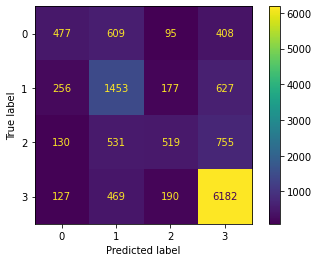

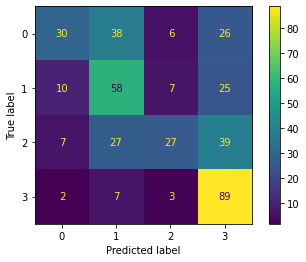

In [ ]:
# Confusion matrix whose i-th row and j-th column entry indicates 
# the number of samples with 
# true label being i-th class, and 
# predicted label being j-th class.
a = confusion_matrix(sess_gt_list, sess_pred_list)
a_per = a / np.sum(a, axis=1, keepdims=True) * 100
cm_display = ConfusionMatrixDisplay(a, display_labels=range(4)).plot(values_format='d')
cm_display = ConfusionMatrixDisplay(a_per, display_labels=range(4)).plot(values_format='2.0f')

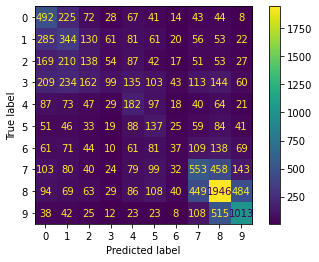

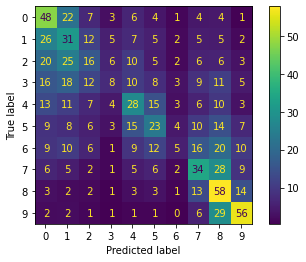

In [ ]:
a = confusion_matrix(pred_num_list, gt_num_list)
a_per = a / np.sum(a, axis=1, keepdims=True) * 100
cm_display = ConfusionMatrixDisplay(a, display_labels=range(10)).plot(values_format='d')
cm_display = ConfusionMatrixDisplay(a_per, display_labels=range(10)).plot(values_format='2.0f')

In [ ]:
s = 0
for i in range(10):
    s += a[i][i]
print(s)

4605


In [ ]:
4605 / np.sum(a)

0.35409457900807384

In [ ]:
np.sum(a)

13005

In [ ]:
a = one_zero + zero_one + one_one + zero_zero
print(one_zero)
print(zero_one)
print(one_one)
print(zero_zero) 
print('')
print(np.round(one_zero  / a, 2))
print(np.round(zero_one  / a, 2))
print(np.round(one_one   / a, 2))
print(np.round(zero_zero / a, 2)) 

[1842. 1766. 1681. 1399. 1459. 1411. 1192. 1327.  869.]
[ 489.  600.  778. 1235. 1222. 1231. 1344. 1203. 1334.]
[9831. 9651. 9357. 6867. 6842. 6742. 4269. 4093. 2000.]
[ 843.  988. 1189. 3504. 3482. 3621. 6200. 6382. 8802.]

[0.14 0.14 0.13 0.11 0.11 0.11 0.09 0.1  0.07]
[0.04 0.05 0.06 0.09 0.09 0.09 0.1  0.09 0.1 ]
[0.76 0.74 0.72 0.53 0.53 0.52 0.33 0.31 0.15]
[0.06 0.08 0.09 0.27 0.27 0.28 0.48 0.49 0.68]
